
# RNN Dead Layer Fit Project
## MC2 Fixed DLF=1, Quantile Regression Loss on DLF Label


## Import general packages

In [66]:
#check env
import os
print (os.environ['CONDA_DEFAULT_ENV'])

/unix/legend/abi/ML_DL/MLenv


In [67]:
#General
import sys
import json
import yaml
import pandas as pd

#RNN imports
import numpy as np
import os
import argparse
import time
import math
import random
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
from torch.nn import init
import torch.nn.functional as F
import torch
import torch.utils.data as data_utils
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
import gzip
import pickle
import numpy as np
from torch.autograd import Variable
from scipy import sparse
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import torchsnooper #problem installing: !pip install torchsnooper --user #this worked for installing torchsnooper
import h5py
import re
from tqdm import tqdm
from torch.cuda.amp import autocast

torch.cuda.empty_cache()


DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# DEVICE = torch.device("cuda:0")
print(DEVICE)
torch.cuda.is_available()

cuda:0


True

## Import dataset and RNN functions

In [68]:
from src.data import *
from src.RNN import *
from src.training import *
from src.misc import *

## Get relevant paths

In [69]:
# Data paths:
CodePath = os.path.dirname(os.path.abspath("__file__"))
MC_PATH = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_randomDLFs/"
MC_PATH_FCCDonly = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_DLF1/"

DATA_PATH = CodePath+"/data/V05268A_data/experimental_data_V05268A.h5"
MCBESTFIT_FOLDER = CodePath+"/data/V05268A_data/MCBestFit_data_V05268A_FCCD0.97mm/"

## Plot Training Data

no files:  4908


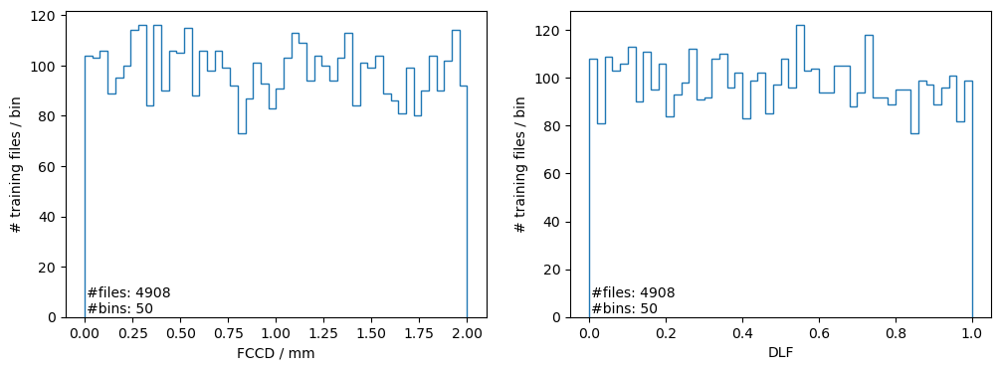

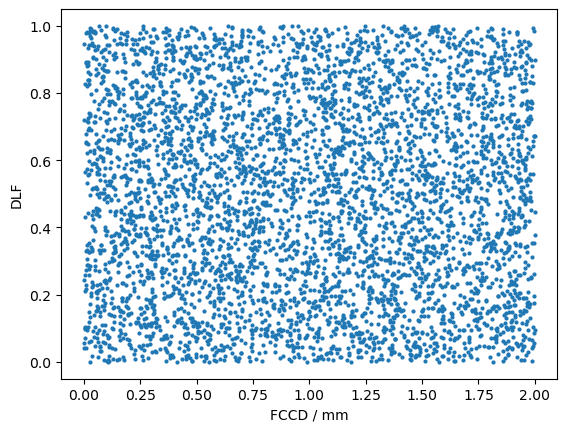

In [5]:
#Plot Training Data
plotTrainingData(MC_PATH)

no files:  4991


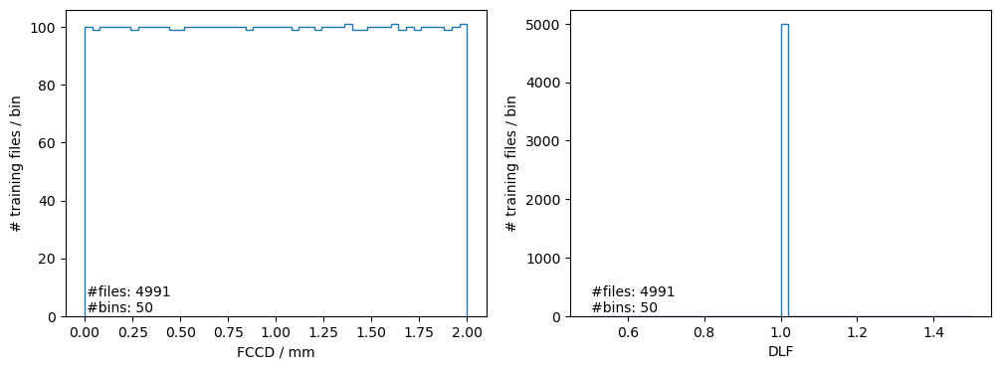

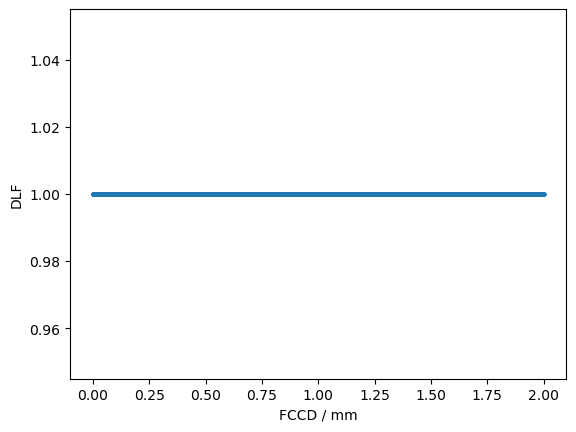

In [6]:
#Plot Training Data
plotTrainingData(MC_PATH_FCCDonly)

# -------------------------------------------------------
# WORKFLOW
# -------------------------------------------------------

# TRAINING 1: full dataset

In [7]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
# RNN_ID = "RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"
RNN_ID = "RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"
# RNN_ID = "RNN_MC2DLF1_norm1_ratioInput_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Training  (DO NOT RERUN UNLESS NECESSARY)

In [8]:
# #load dataset
# BATCH_SIZE = 4 
# # train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                 normaliseSpectraUnity = True, ratioSpectraRNNInput = True)


In [9]:
# #run training
# FCCD_accuracy_values, DLF_accuracy_values, loss_values = train_RNN(dataset, train_loader, test_loader, NUM_EPOCHS, LEARNING_RATE, saveRNN=True, 
#                                                                    plot_training_results = True, RNN_ID = RNN_ID, quantileRegressionDLF=True)


In [10]:
# #Training Results
# training_results(NUM_EPOCHS, loss_values, FCCD_accuracy_values, DLF_accuracy_values, save_plots = False, RNN_ID = RNN_ID)


## Testing

In [11]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
                                               separate_scalers=True, normaliseSpectraUnity = True)

# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
#                                                normaliseSpectraUnity = True, separate_scalers=True)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                                                normaliseSpectraUnity = True, ratioSpectraRNNInput = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:22<00:00, 217.80it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:24<00:00, 203.65it/s]


(4991, 890)


In [12]:
# Load saved model
RNNclassifier_fulldataset = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_fulldataset.load_state_dict(torch.load(model_path))
RNNclassifier_fulldataset.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.03it/s]


FCCD accuracies: 
total:  3000
TP:  1451
FP:  26
TN:  1504
FN:  19
accuracy:  0.985
precision:  0.982396750169262
recall:  0.9870748299319728

DLF accuracies: 
accuracy_DLF:  0.978

roc auc FCCD:  0.9991303187941843

Total # misclassified trials FCCD:  45  / 3000
Total # misclassified trials DLF:  66  / 3000


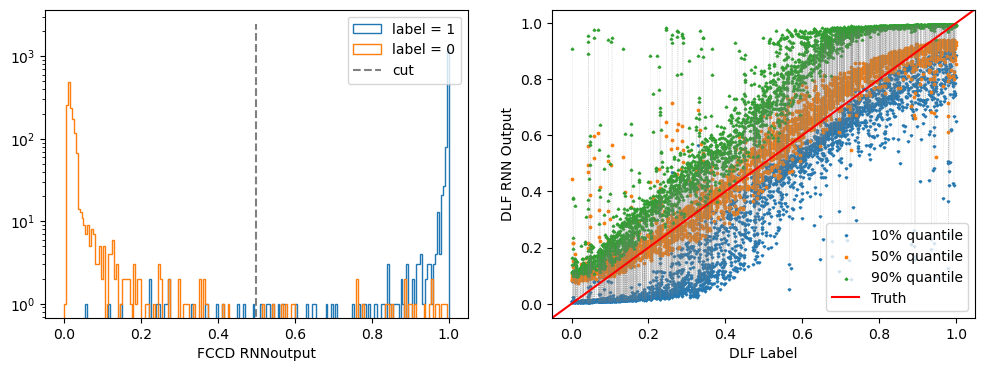

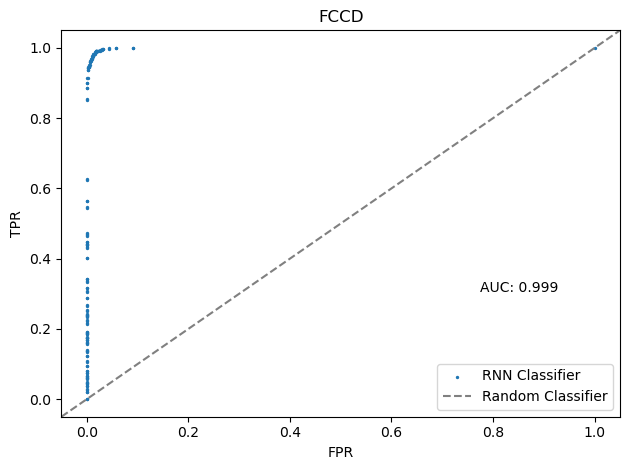

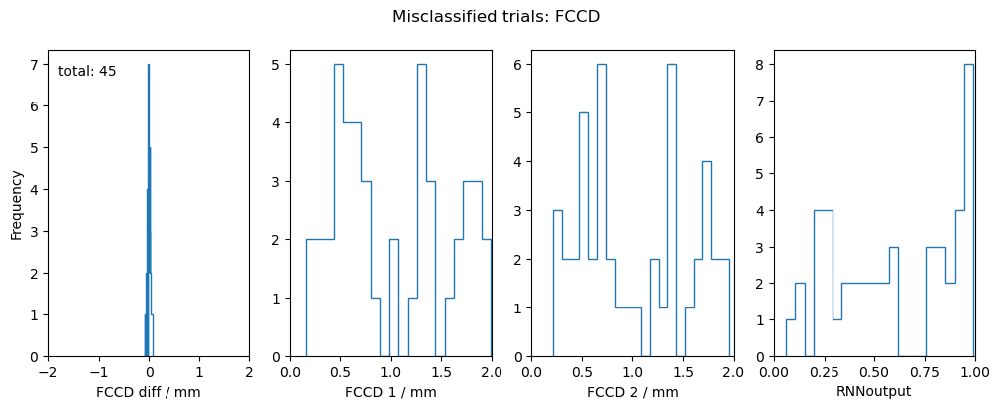

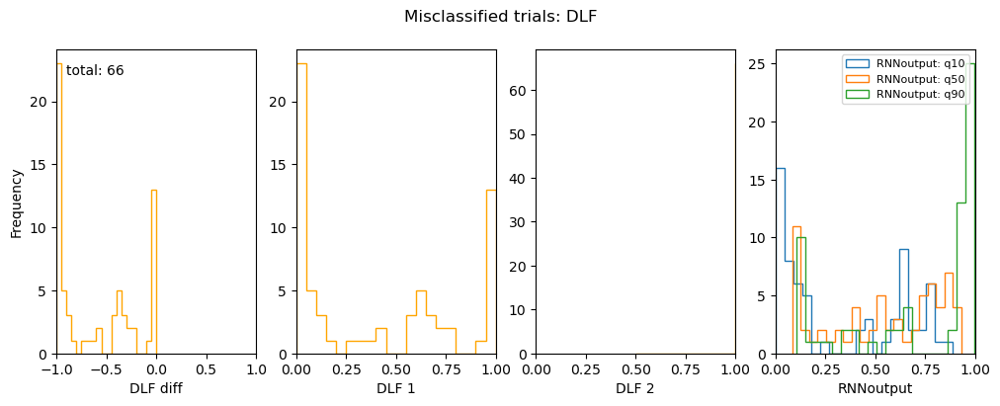

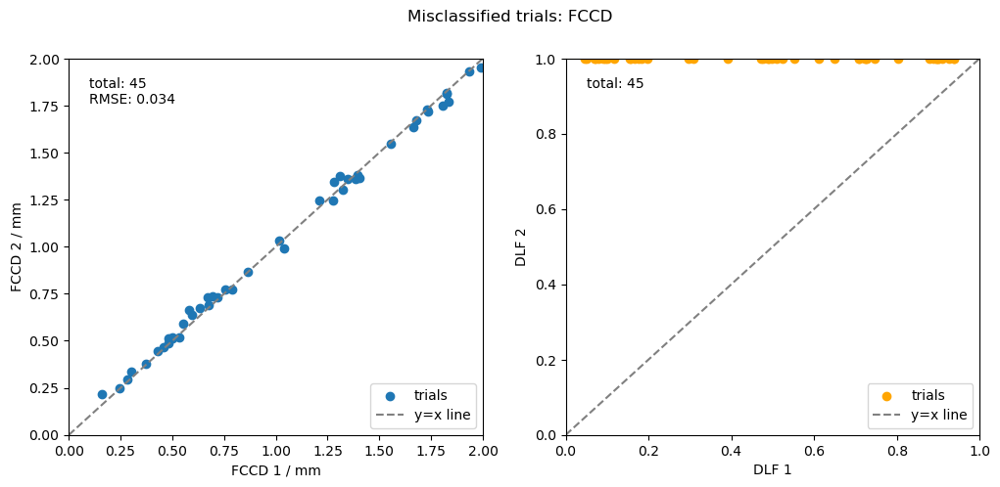

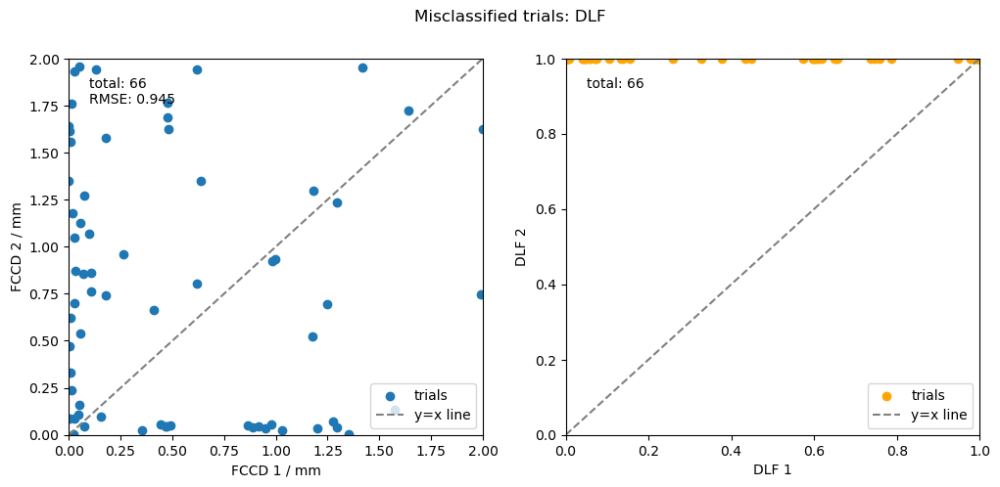

In [13]:
#testing
accuracies_fulldataset = test_RNN(RNNclassifier_fulldataset, test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

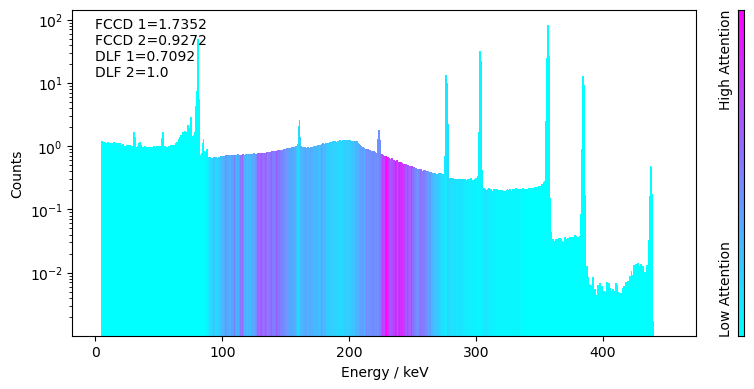

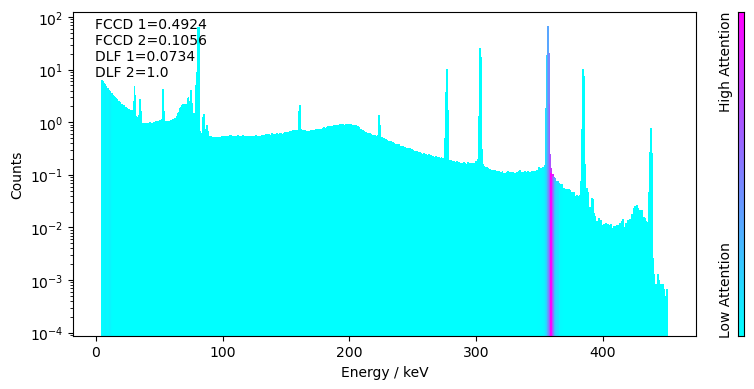

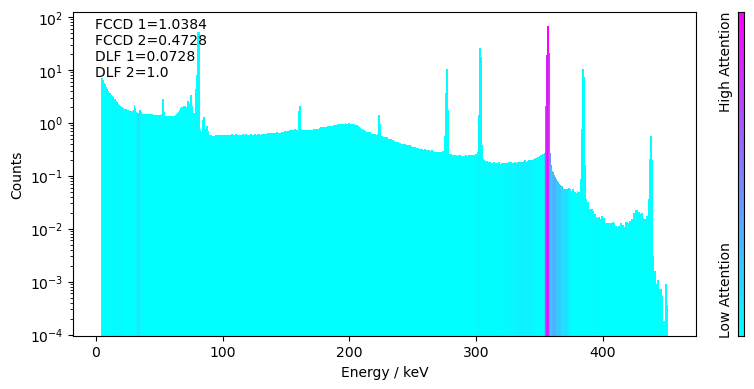

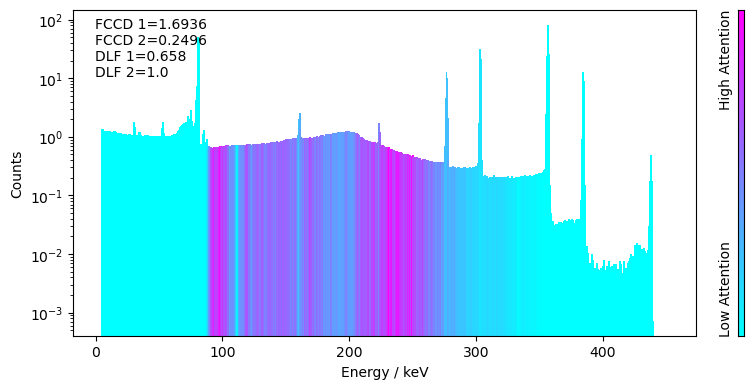

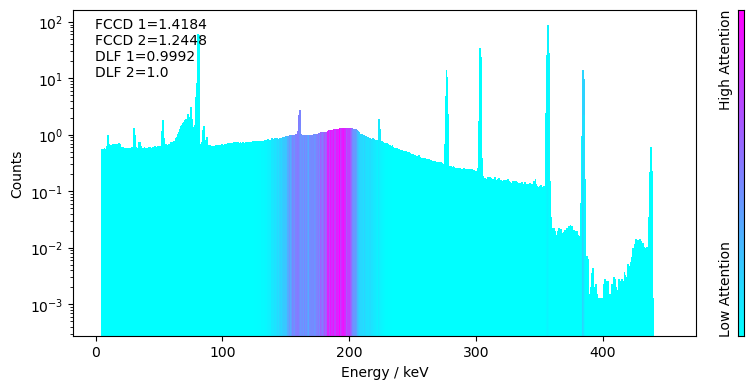

...

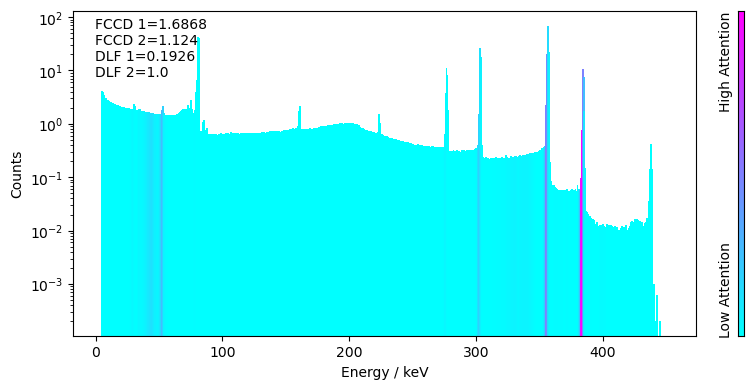

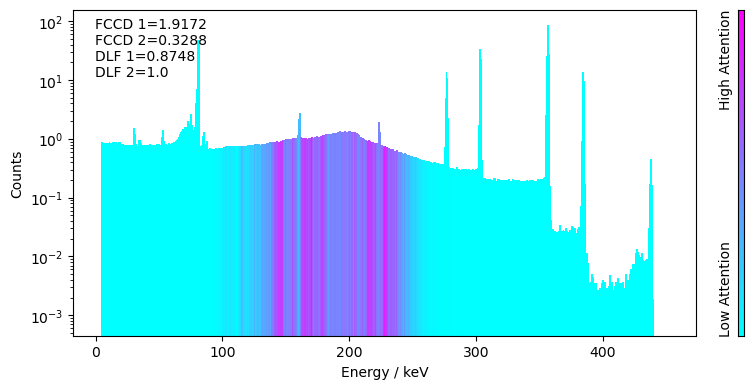

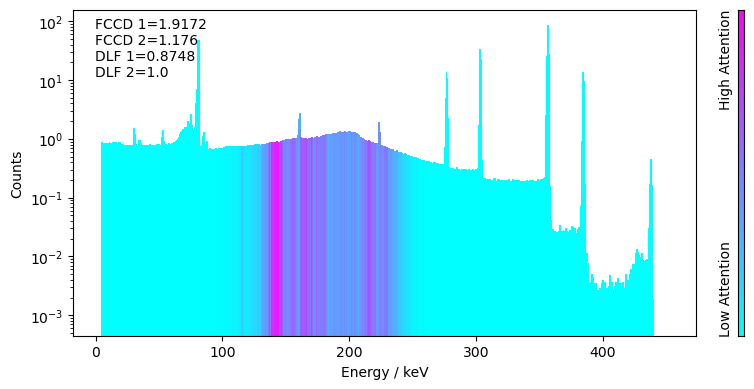

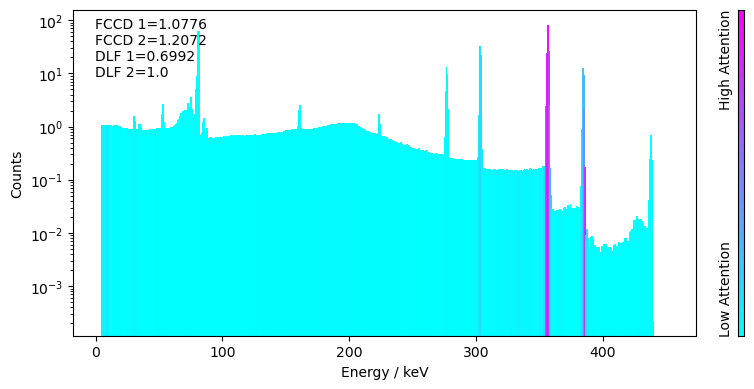

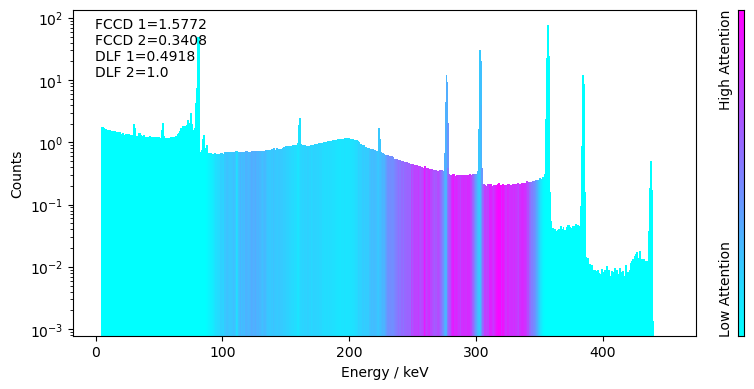

In [14]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.78it/s]


saved average attention to csv file


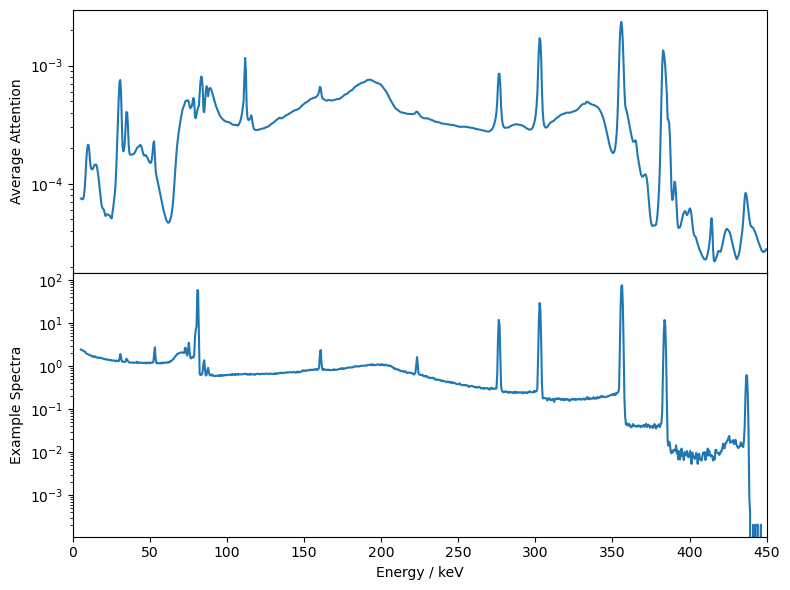

In [15]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, RNN_ID=RNN_ID, save_plots = True,
                                          quantileRegressionDLF=True)


# TRAINING 2: restircted dataset - Max FCCD diff = 0.5 mm
Only train on FCCDs with a max diff of 0.5 mm

In [16]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.5
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.5mm

In [17]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, separate_scalers=True,
                                              normaliseSpectraUnity = True)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 201.66it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:26<00:00, 191.62it/s]


(4991, 890)


In [18]:
# Load saved model
RNNclassifier_maxFCCDdiff0_5mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_5mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_5mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.68it/s]


FCCD accuracies: 
total:  3000
TP:  1446
FP:  31
TN:  1485
FN:  38
accuracy:  0.977
precision:  0.979011509817197
recall:  0.9743935309973046

DLF accuracies: 
accuracy_DLF:  0.9843333333333333

roc auc FCCD:  0.9979717692324105

Total # misclassified trials FCCD:  69  / 3000
Total # misclassified trials DLF:  47  / 3000


{'accuracy_FCCD': 0.977,
 'precision_FCCD': 0.979011509817197,
 'recall_FCCD': 0.9743935309973046,
 'accuracy_DLF': 0.9843333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9979717692324105,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.0253344011979358,
  'RMSE_DLFmisclassified_FCCD': 0.27934375985550985,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 69,
  'NoMisclassifiedDLF': 47}}

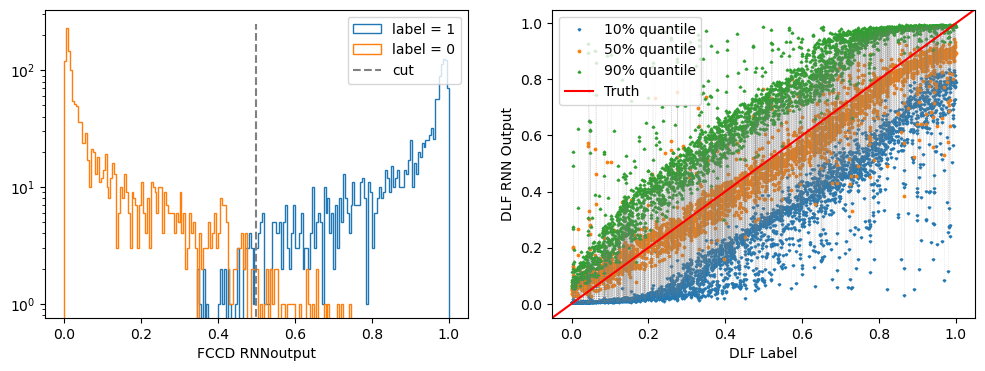

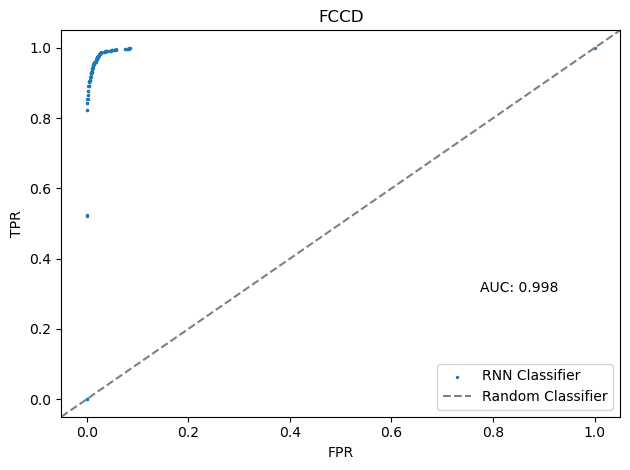

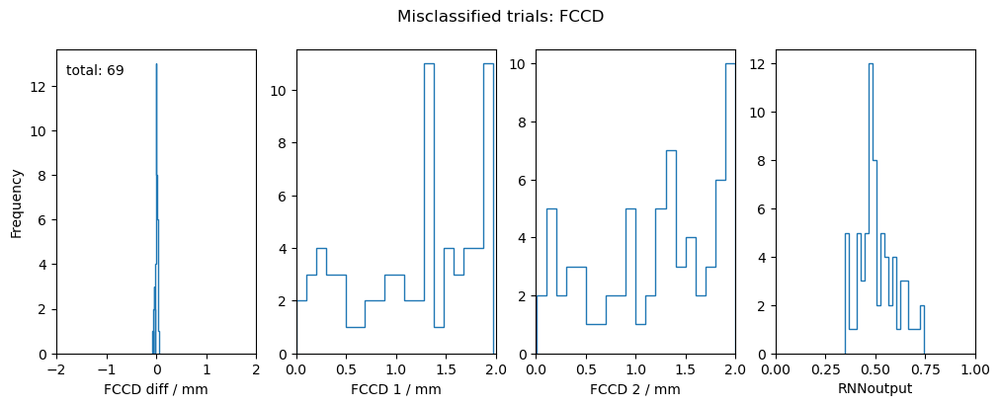

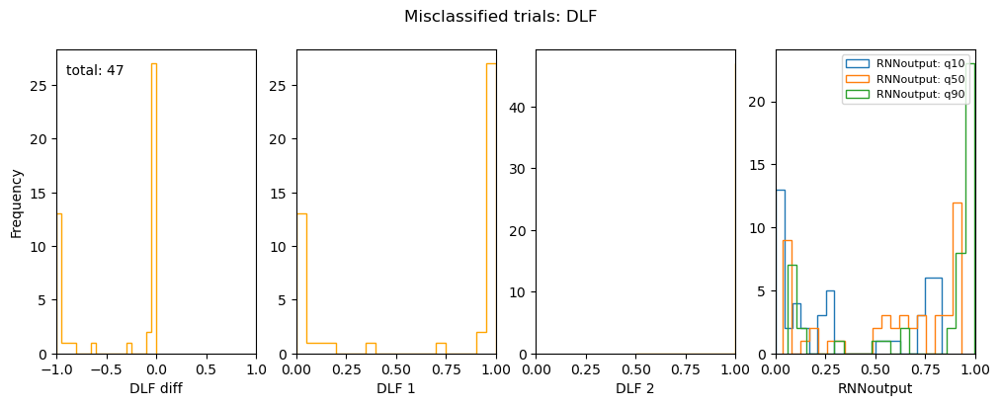

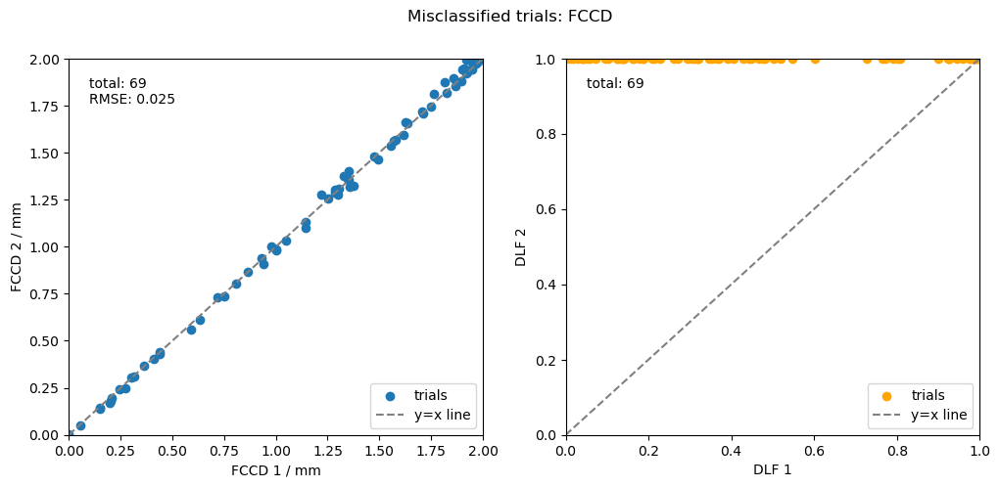

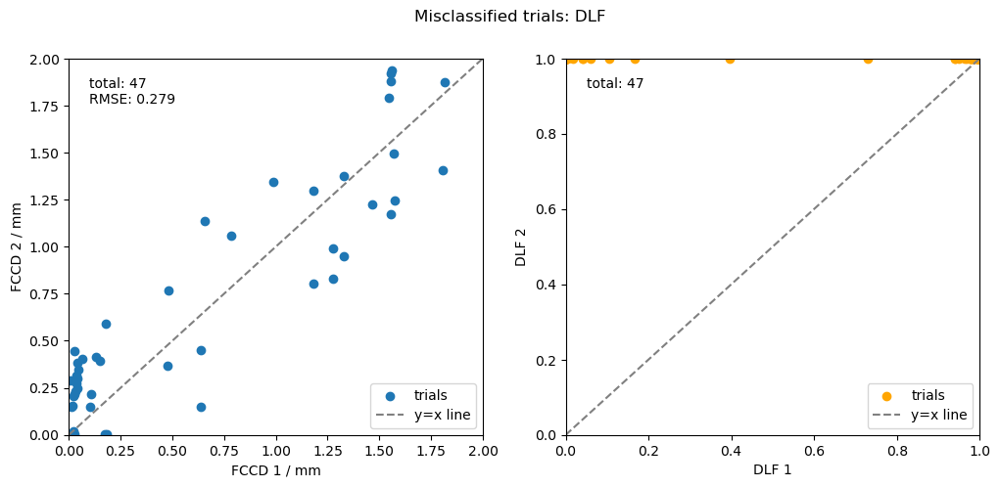

In [19]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

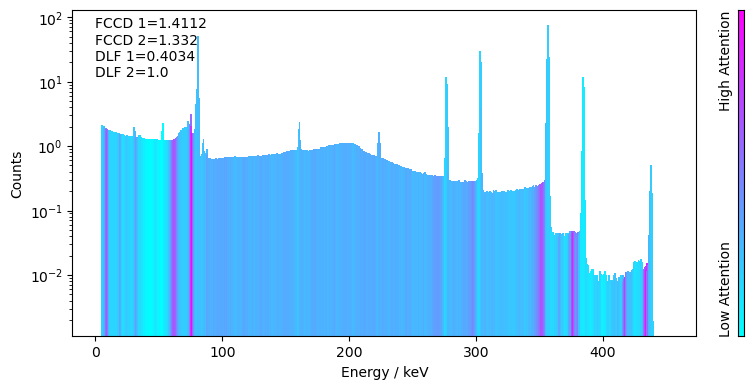

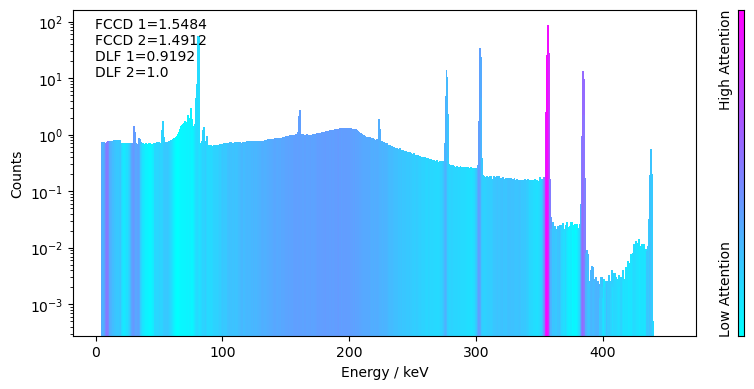

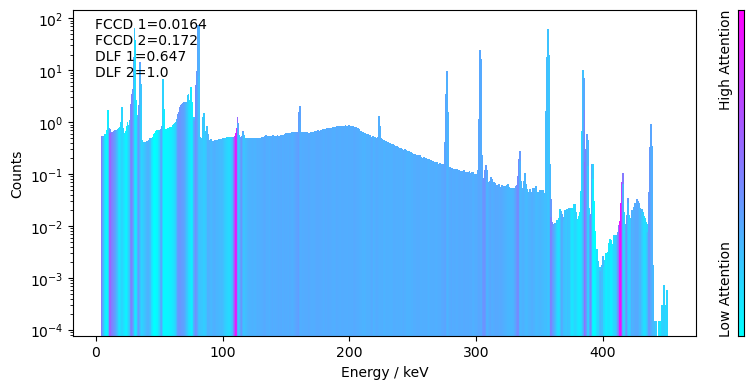

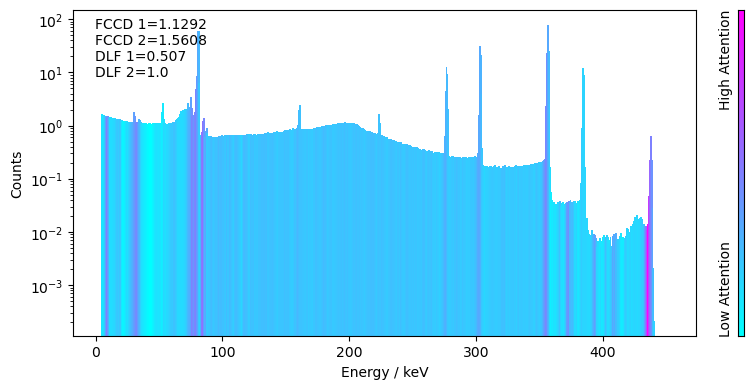

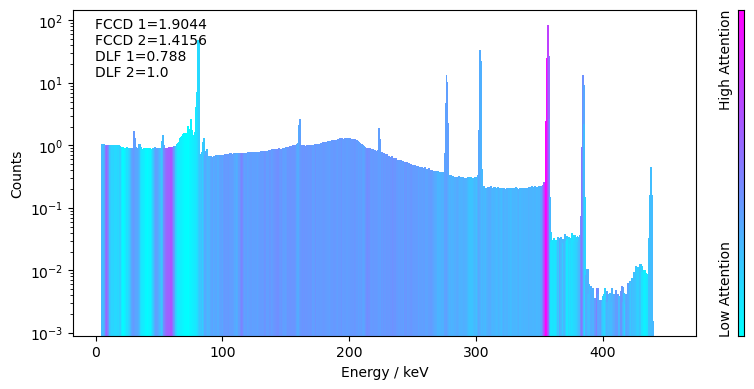

...

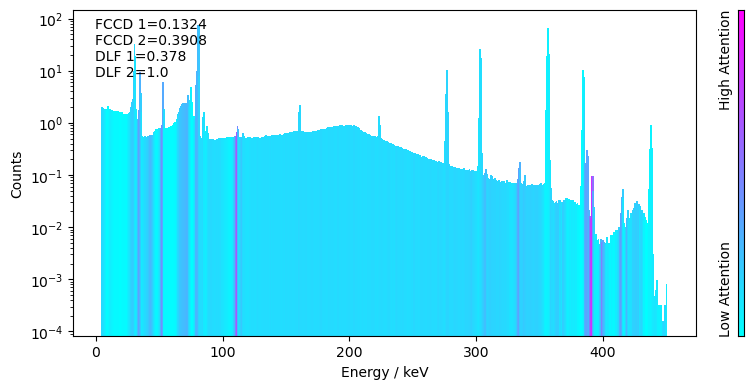

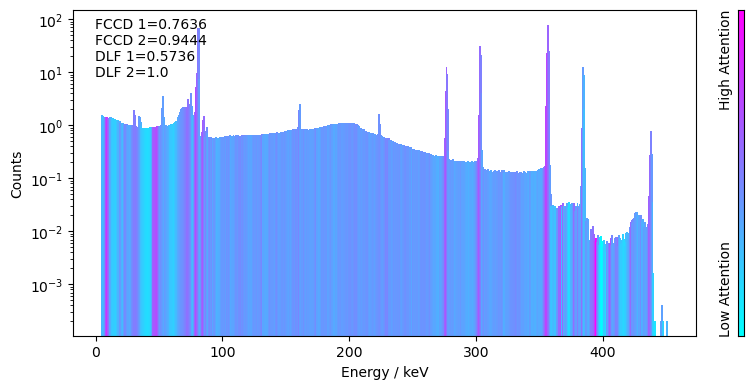

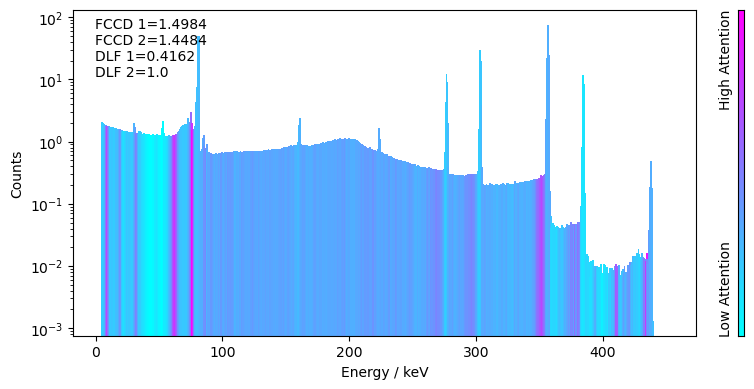

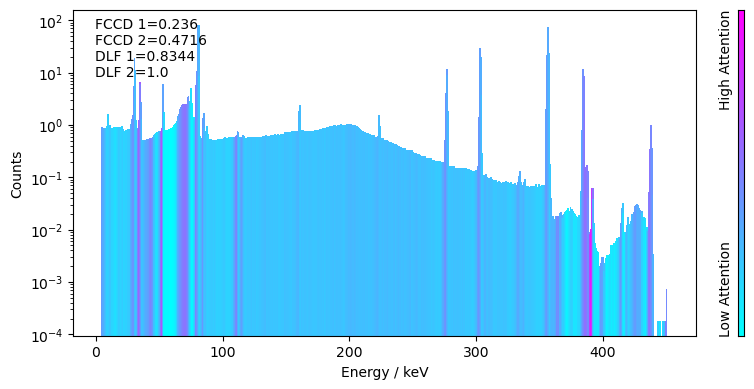

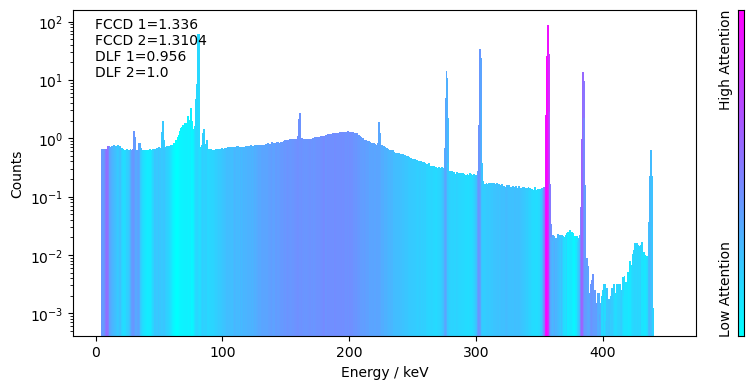

In [20]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:04<00:00, 11.64it/s]


saved average attention to csv file


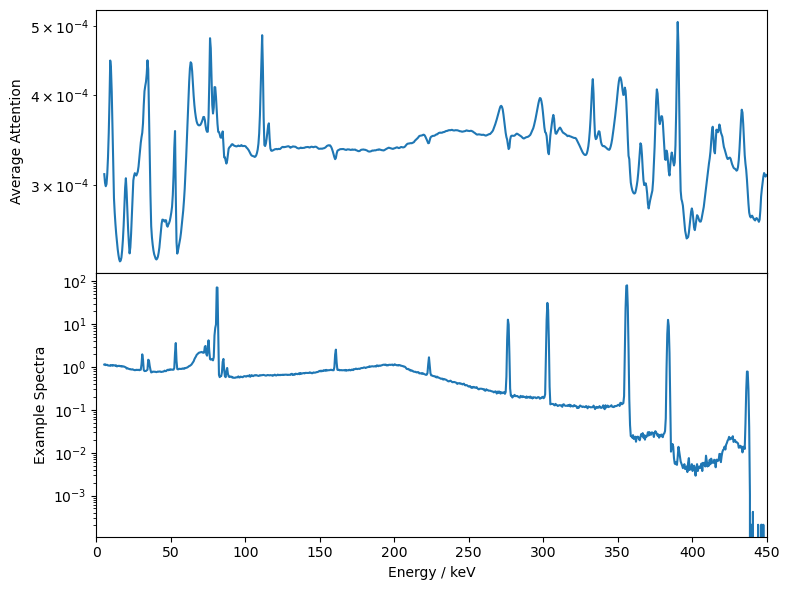

In [21]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)


## Testing - on full dataset

In [22]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:25<00:00, 195.79it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:23<00:00, 213.97it/s]

(4991, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.84it/s]


FCCD accuracies: 
total:  3000
TP:  1423
FP:  34
TN:  1496
FN:  47
accuracy:  0.973
precision:  0.9766643788606726
recall:  0.9680272108843537

DLF accuracies: 
accuracy_DLF:  0.9223333333333333

roc auc FCCD:  0.9908034324841047

Total # misclassified trials FCCD:  81  / 3000
Total # misclassified trials DLF:  233  / 3000


{'accuracy_FCCD': 0.973,
 'precision_FCCD': 0.9766643788606726,
 'recall_FCCD': 0.9680272108843537,
 'accuracy_DLF': 0.9223333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9908034324841047,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.168881193891021,
  'RMSE_DLFmisclassified_FCCD': 1.2329119630652985,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 81,
  'NoMisclassifiedDLF': 233}}

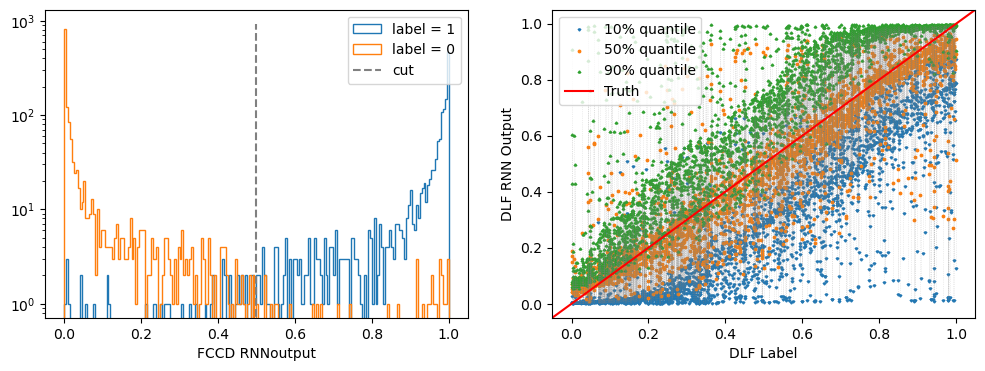

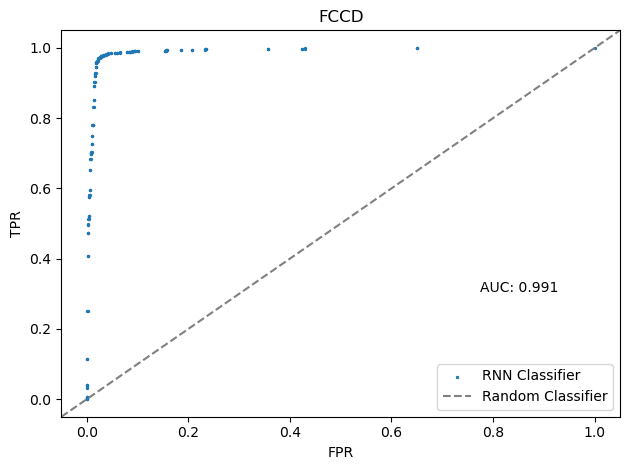

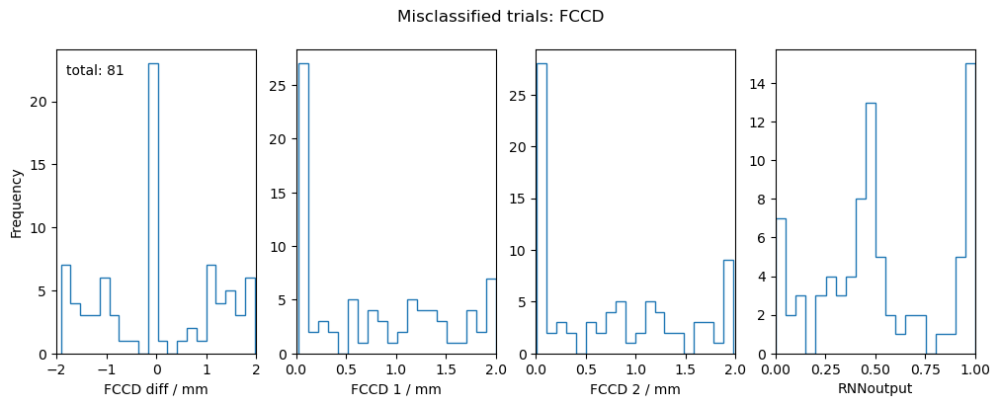

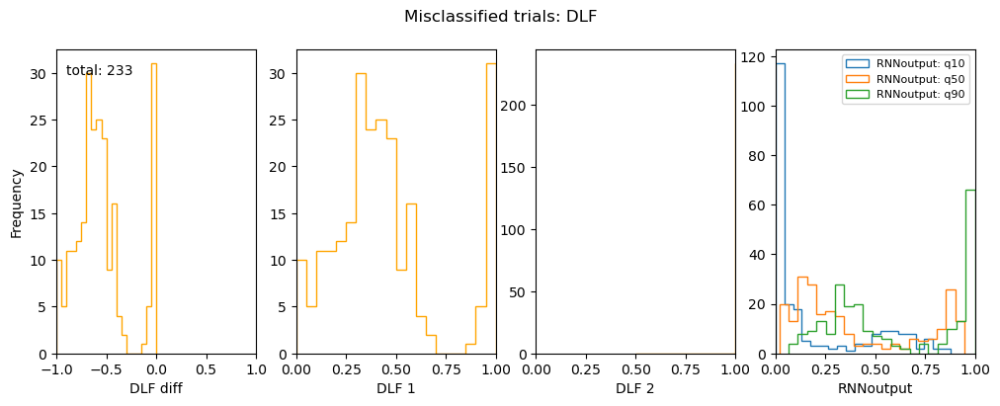

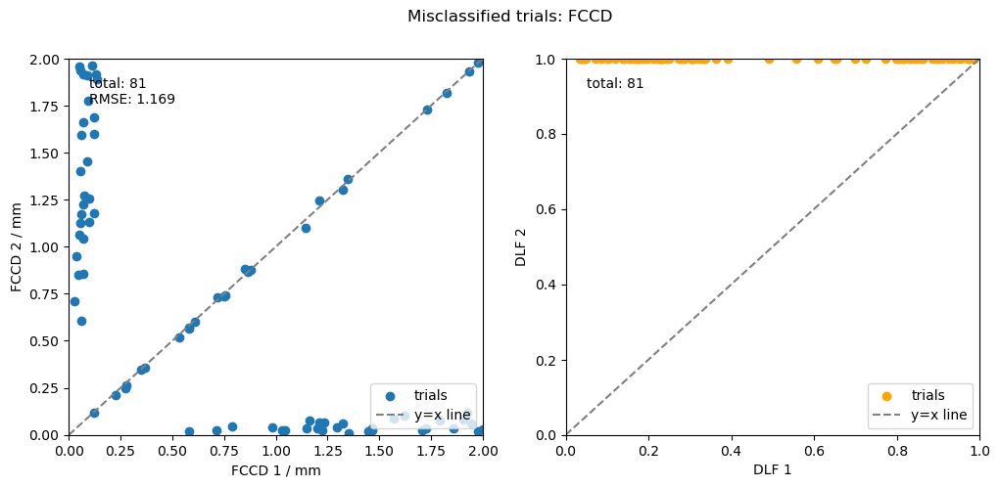

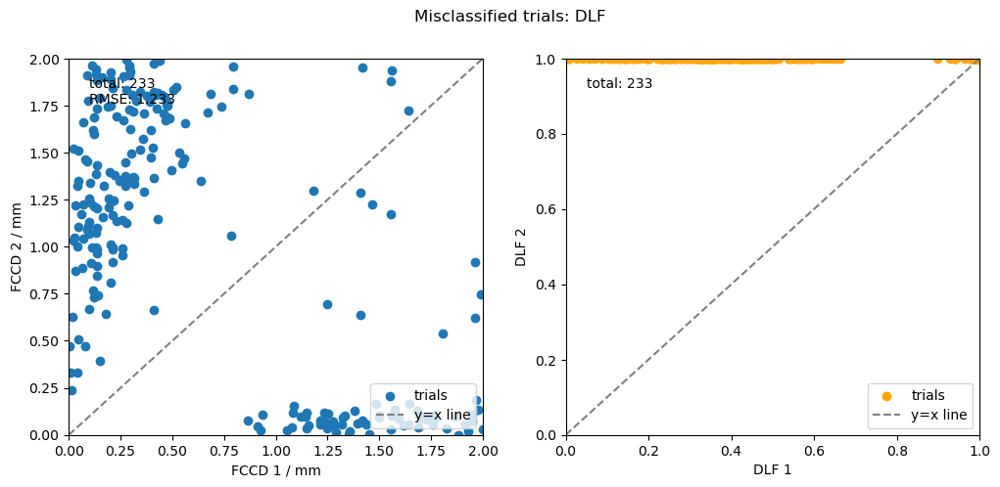

In [23]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

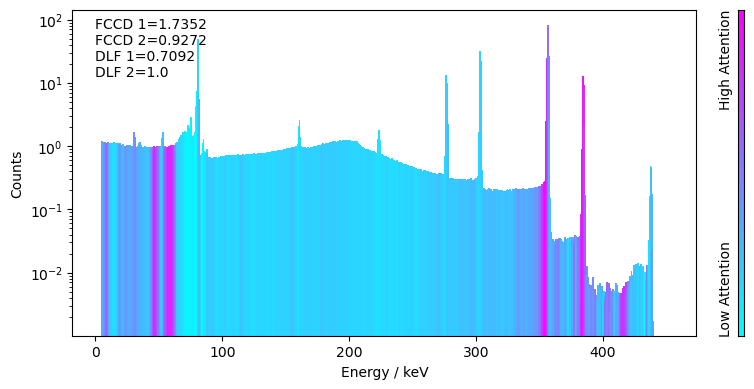

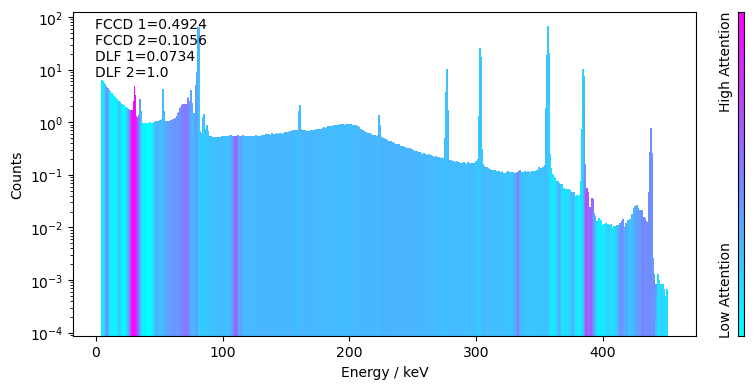

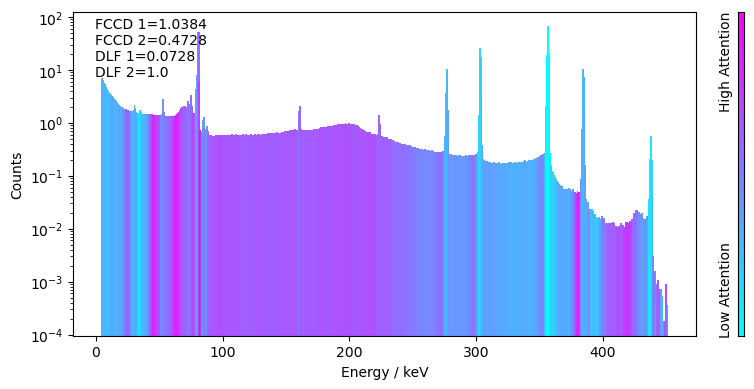

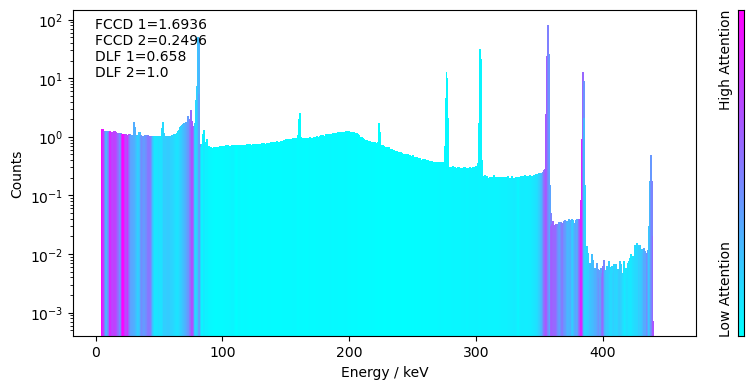

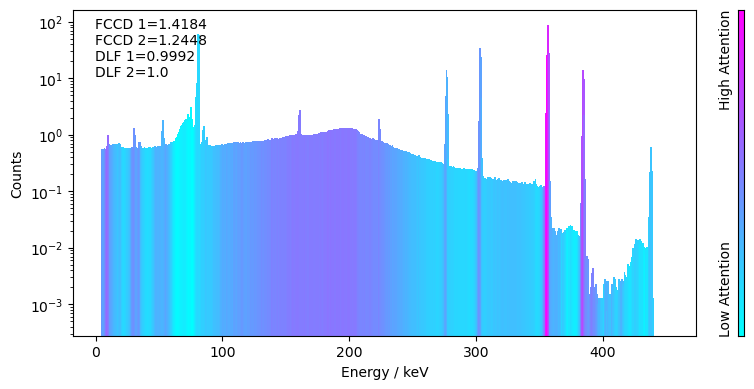

...

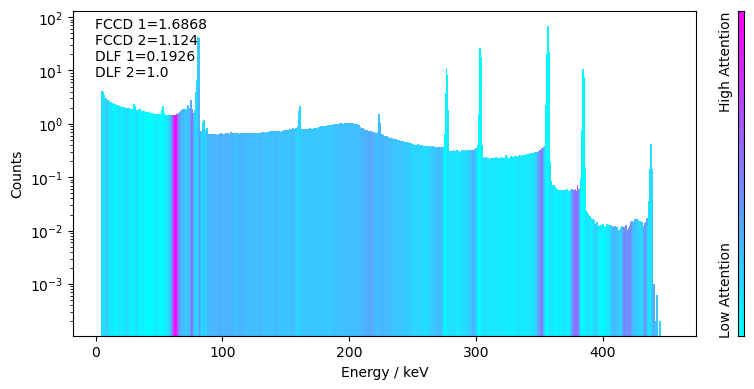

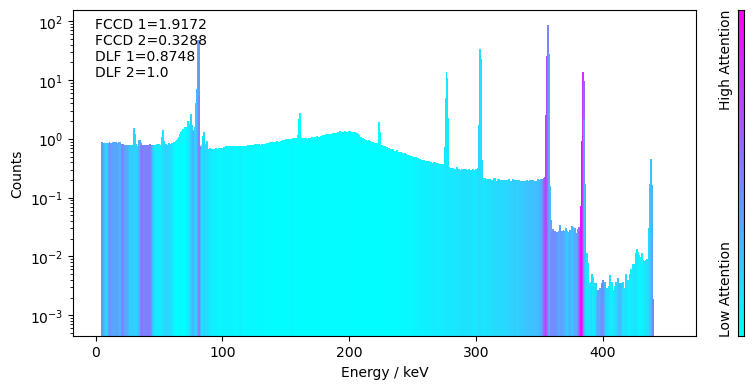

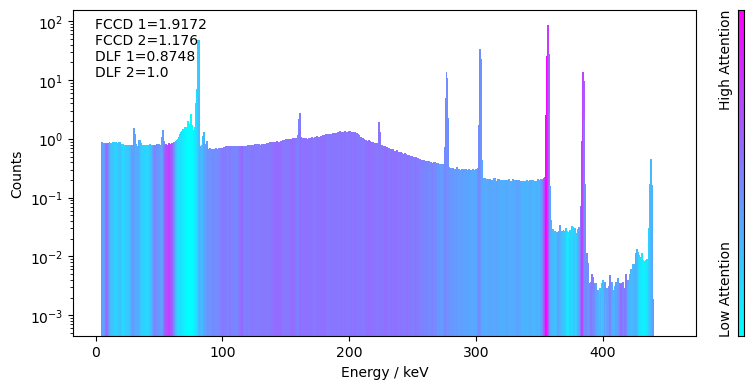

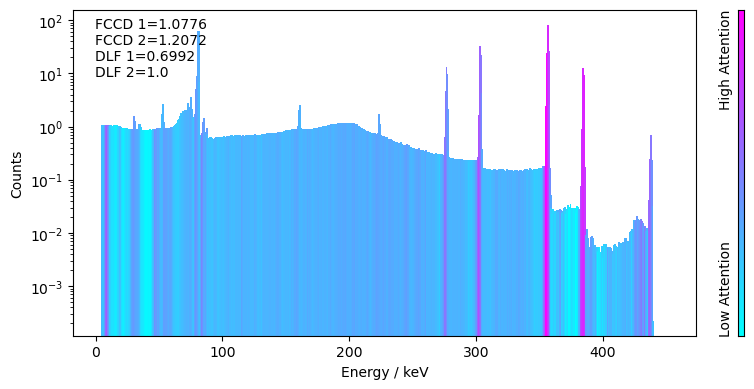

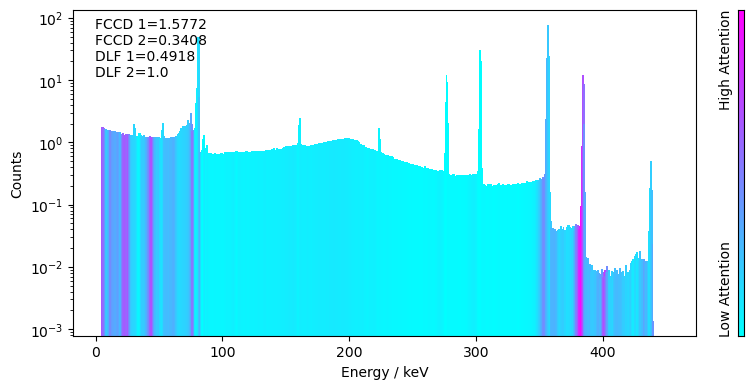

In [24]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.61it/s]


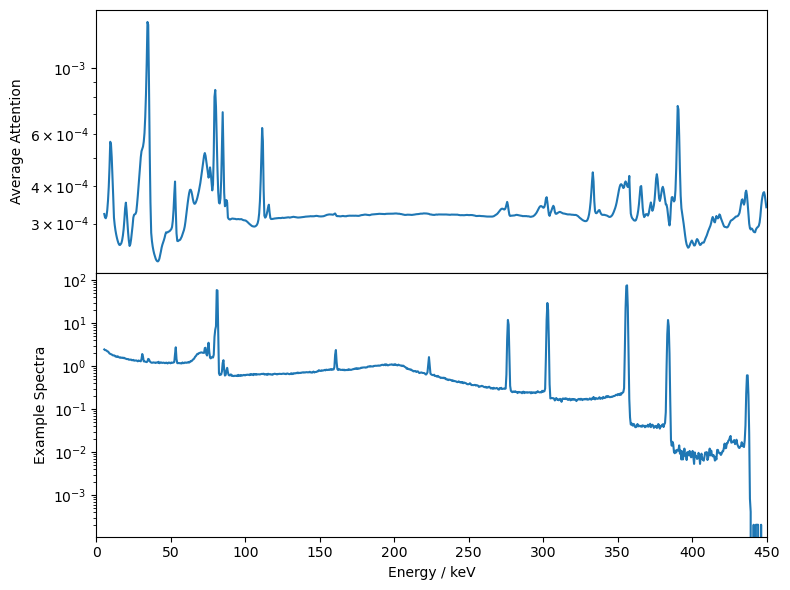

In [25]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)


# TRAINING 3: restircted dataset - Max FCCD diff = 0.25 mm

In [26]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.25
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.25mm

In [27]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 200.24it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:24<00:00, 202.12it/s]

(4991, 890)


In [28]:
# Load saved model
RNNclassifier_maxFCCDdiff0_25mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_25mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_25mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.95it/s]


FCCD accuracies: 
total:  3000
TP:  1475
FP:  62
TN:  1447
FN:  16
accuracy:  0.974
precision:  0.9596616785946649
recall:  0.9892689470154259

DLF accuracies: 
accuracy_DLF:  0.9693333333333334

roc auc FCCD:  0.9979048134621734

Total # misclassified trials FCCD:  78  / 3000
Total # misclassified trials DLF:  92  / 3000


{'accuracy_FCCD': 0.974,
 'precision_FCCD': 0.9596616785946649,
 'recall_FCCD': 0.9892689470154259,
 'accuracy_DLF': 0.9693333333333334,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9979048134621734,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.017554077618195742,
  'RMSE_DLFmisclassified_FCCD': 0.17086817700509208,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 78,
  'NoMisclassifiedDLF': 92}}

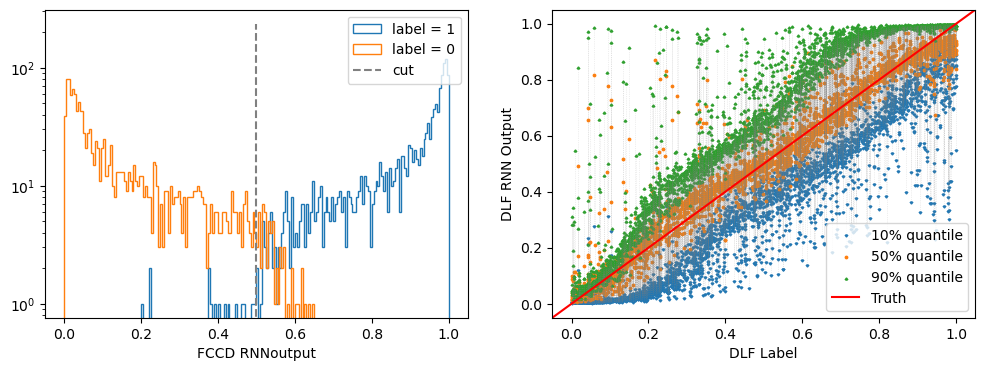

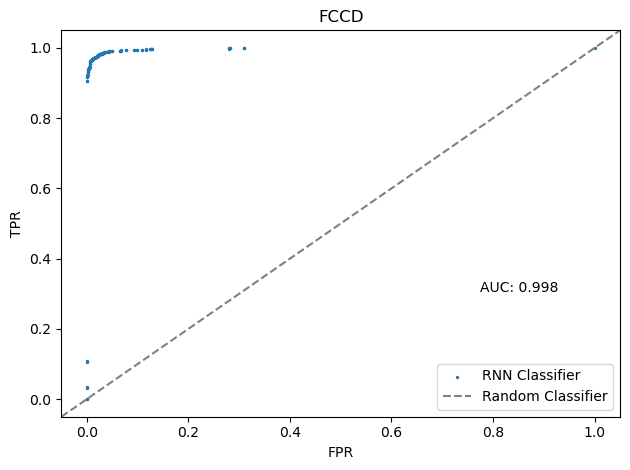

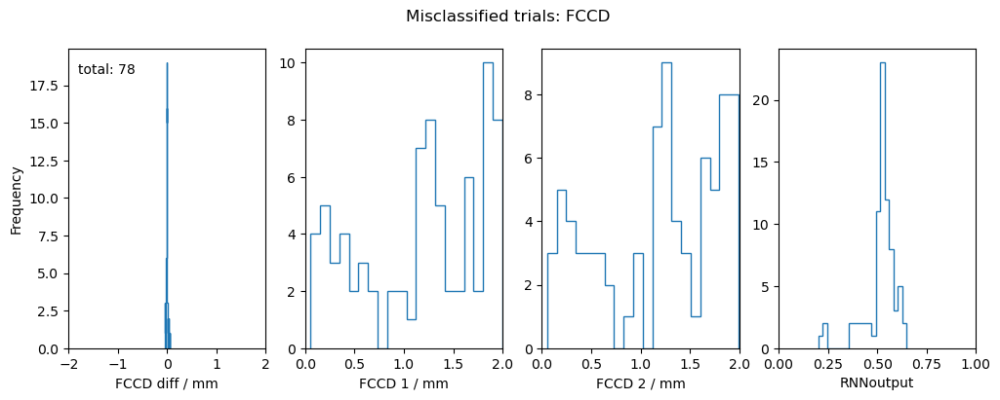

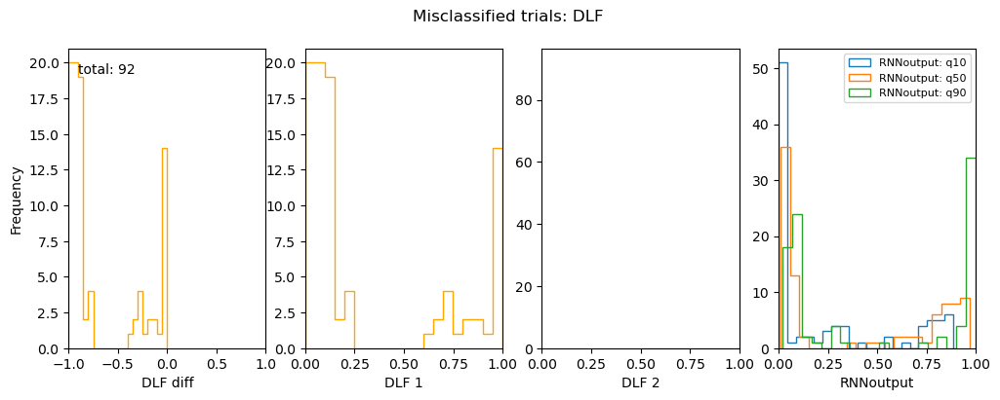

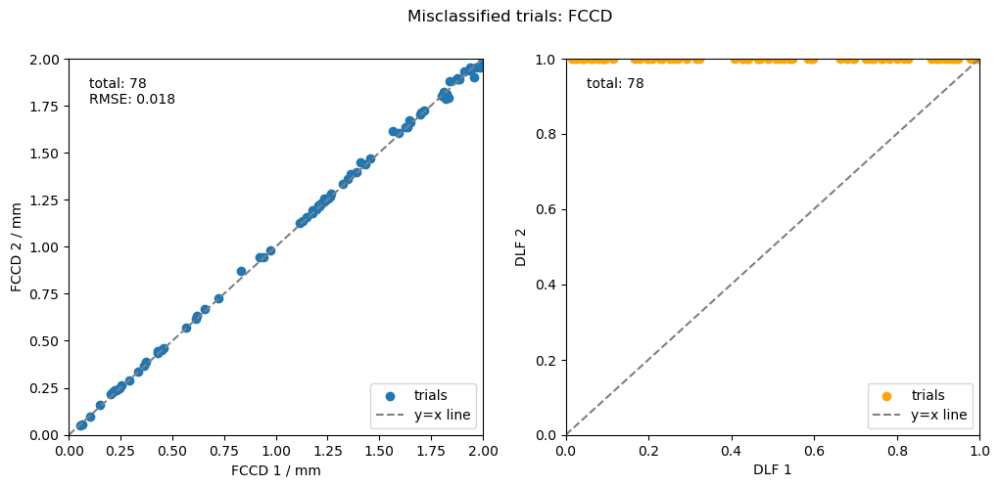

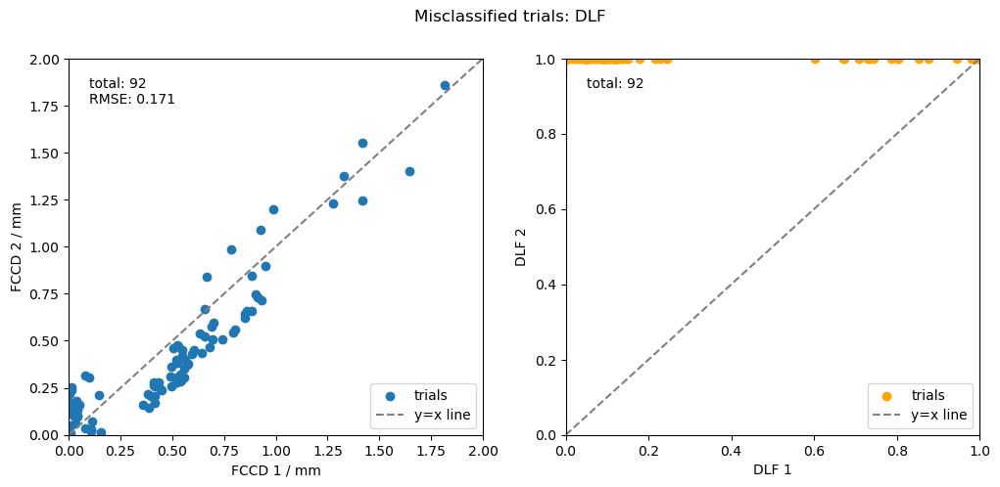

In [29]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

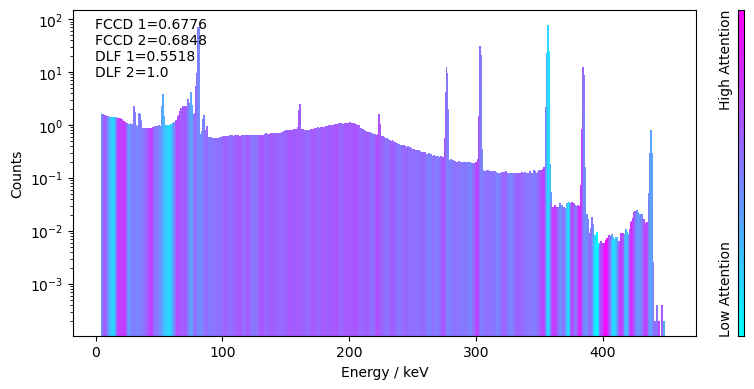

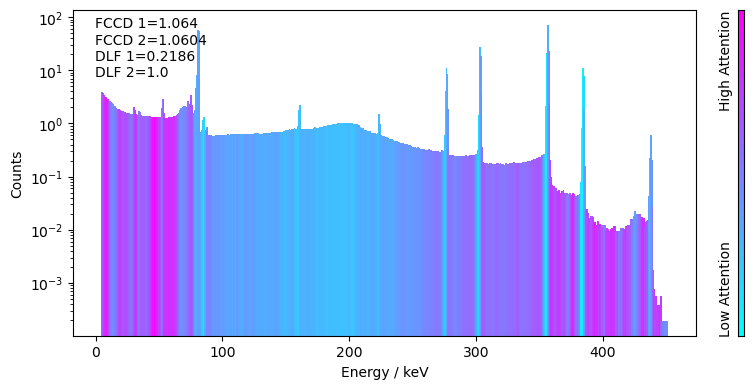

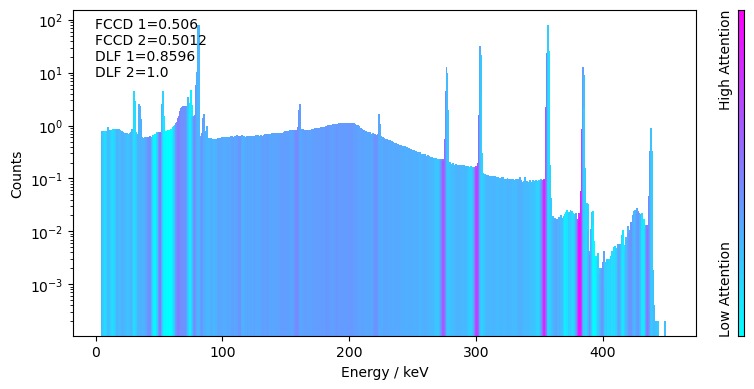

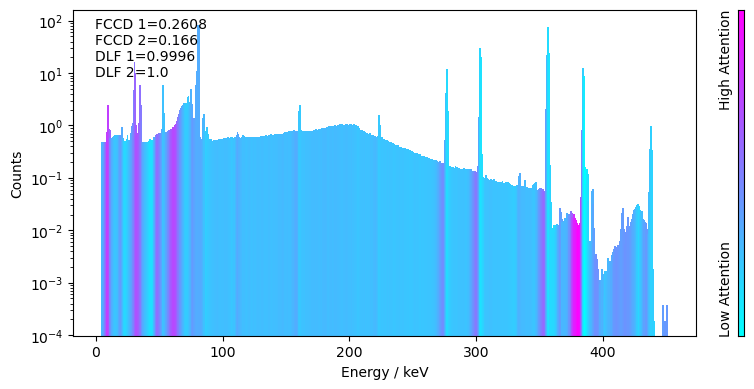

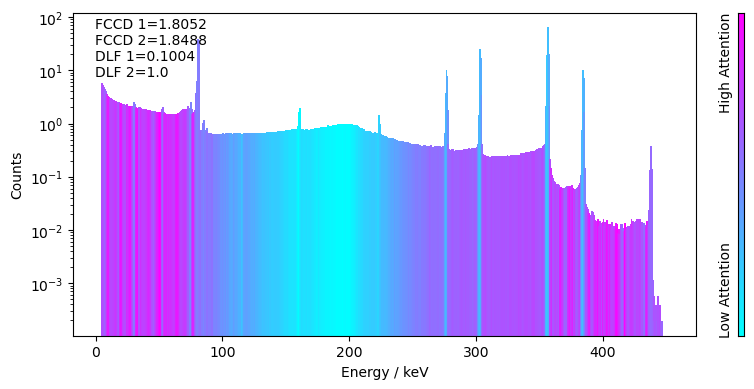

...

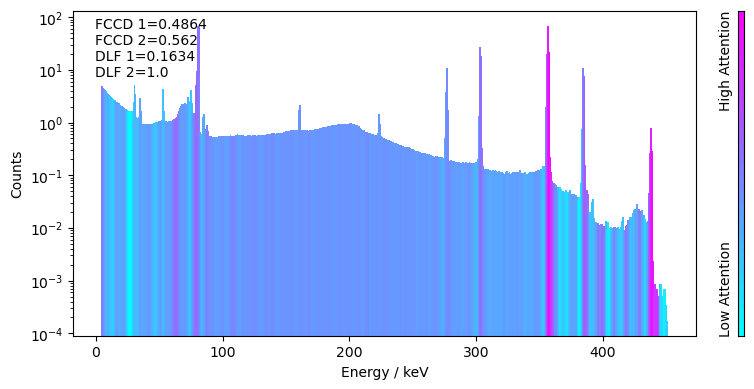

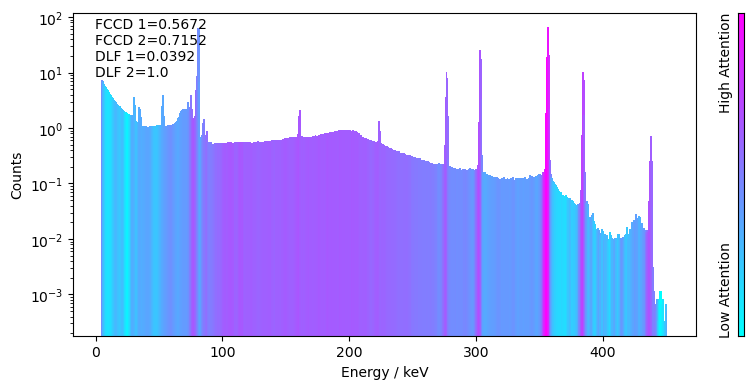

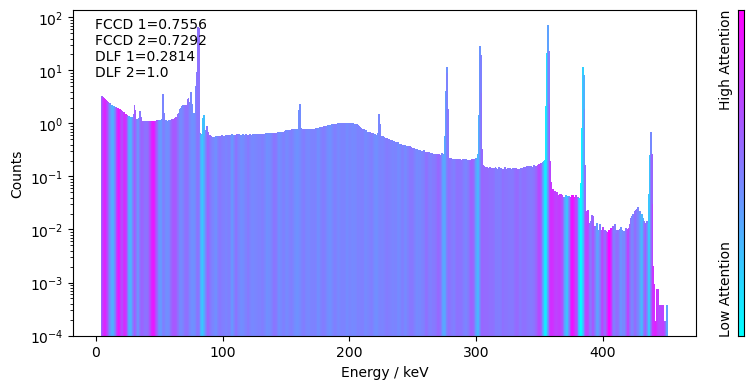

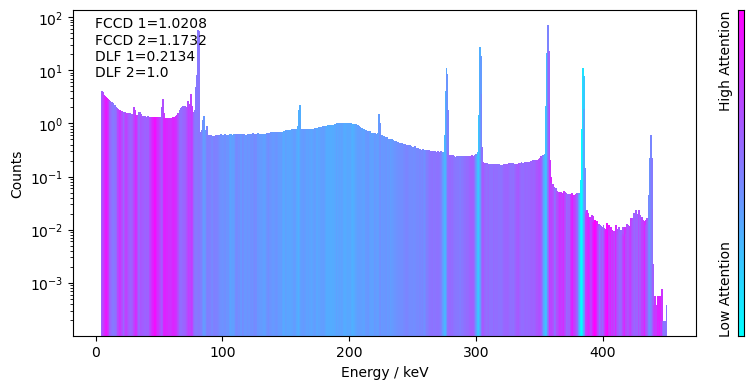

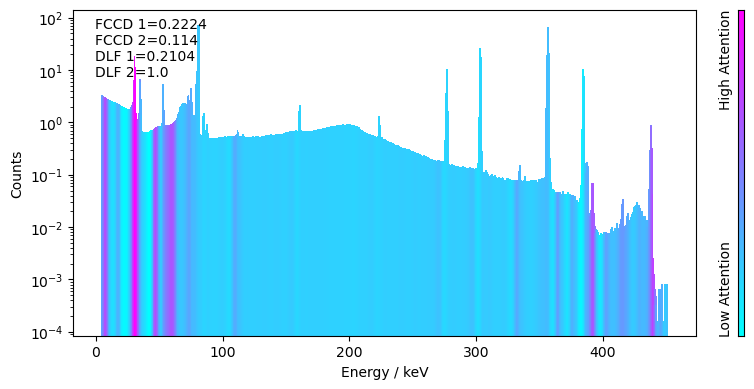

In [30]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.81it/s]


saved average attention to csv file


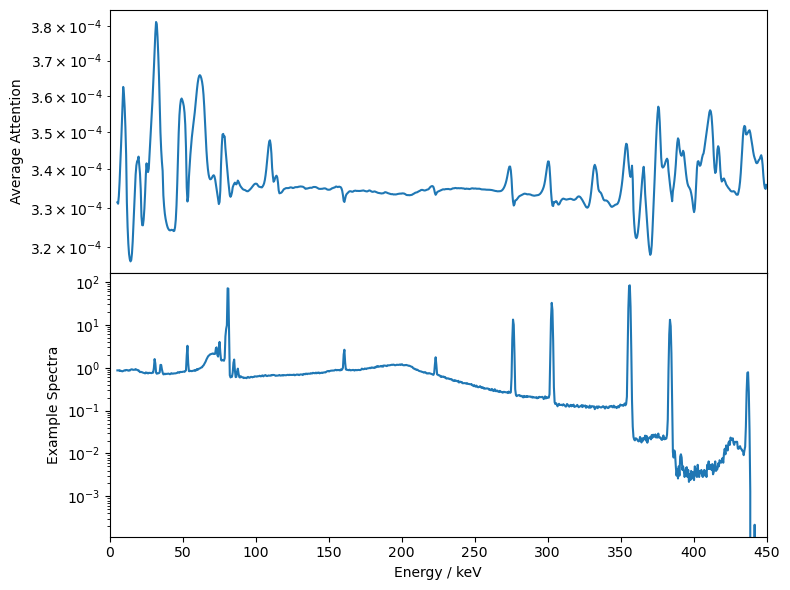

In [31]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [32]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:23<00:00, 207.29it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:24<00:00, 206.46it/s]

(4991, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.62it/s]


FCCD accuracies: 
total:  3000
TP:  1465
FP:  11
TN:  1519
FN:  5
accuracy:  0.9946666666666667
precision:  0.9925474254742548
recall:  0.9965986394557823

DLF accuracies: 
accuracy_DLF:  0.708

roc auc FCCD:  0.9997994753456938

Total # misclassified trials FCCD:  16  / 3000
Total # misclassified trials DLF:  876  / 3000


{'accuracy_FCCD': 0.9946666666666667,
 'precision_FCCD': 0.9925474254742548,
 'recall_FCCD': 0.9965986394557823,
 'accuracy_DLF': 0.708,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9997994753456938,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.18763203351240426,
  'RMSE_DLFmisclassified_FCCD': 1.0269275777997502,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 16,
  'NoMisclassifiedDLF': 876}}

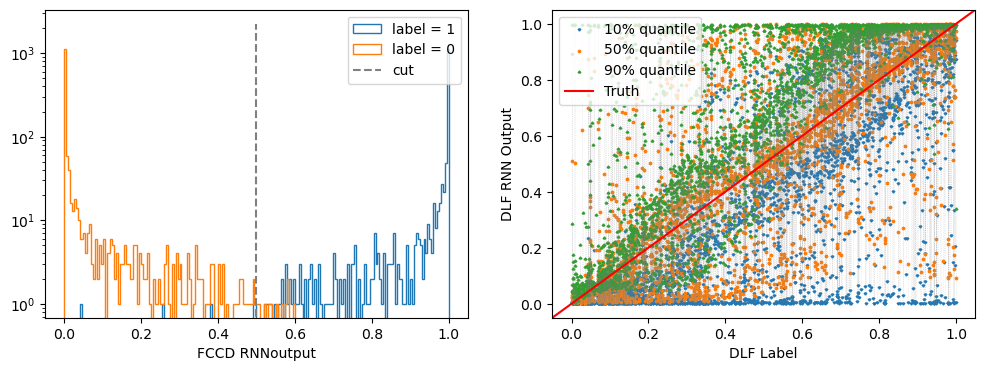

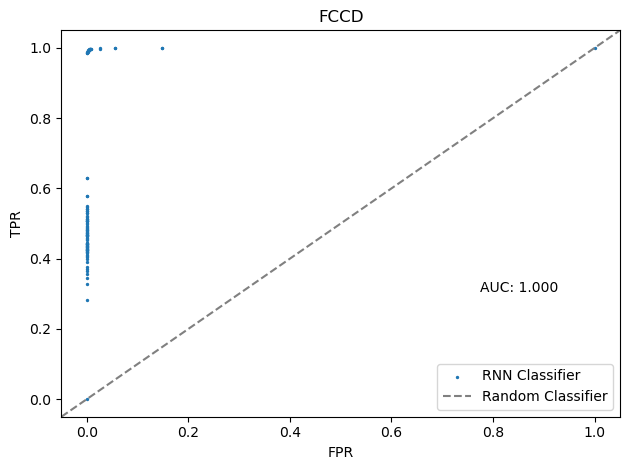

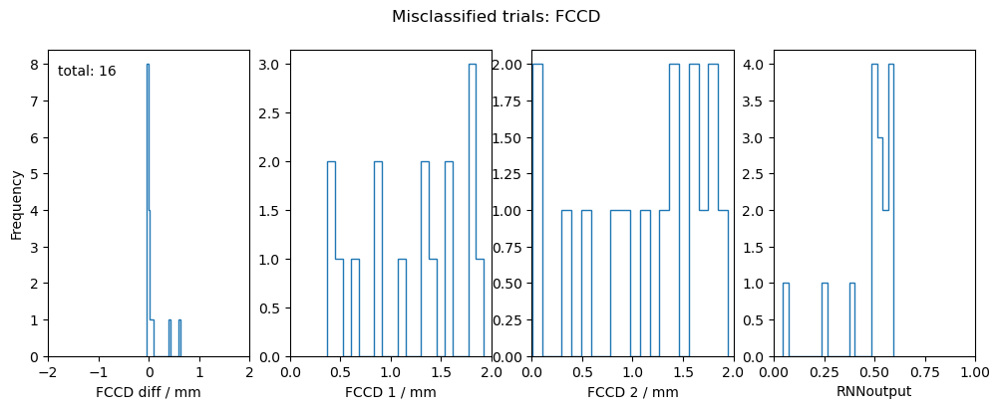

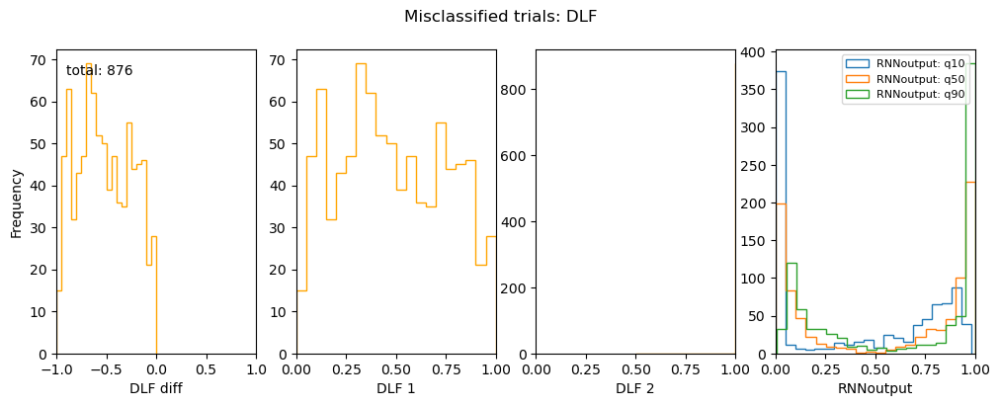

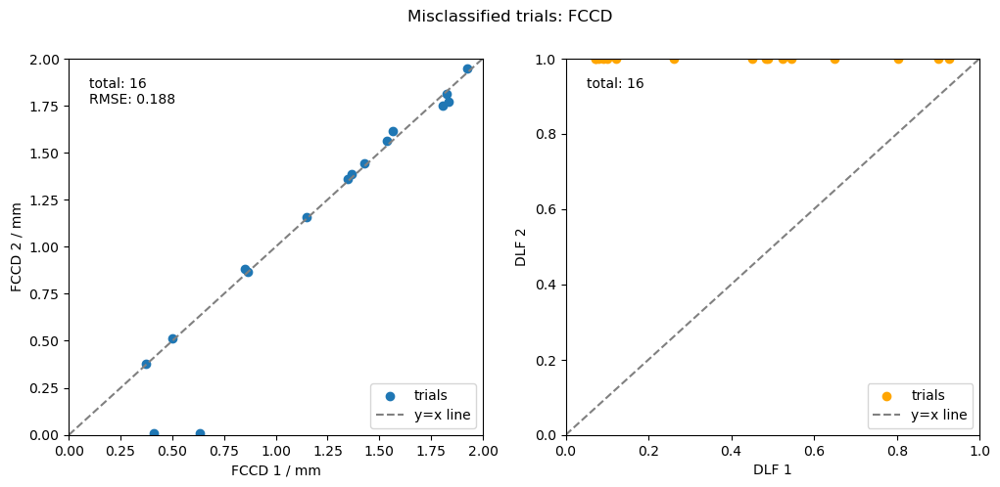

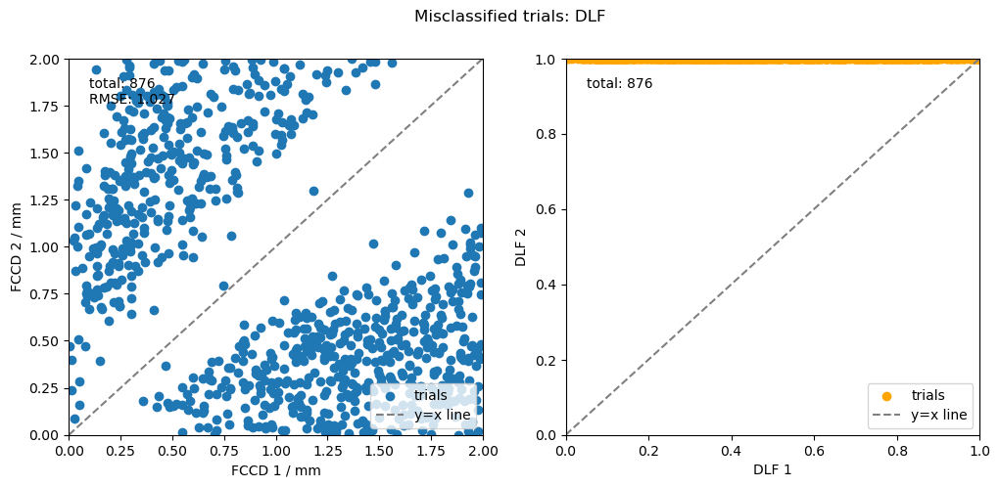

In [33]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

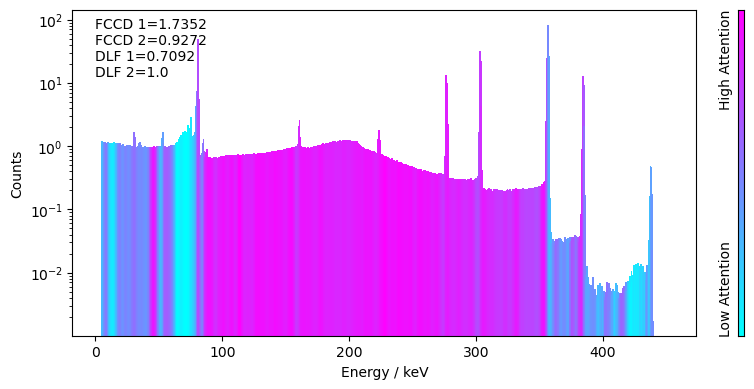

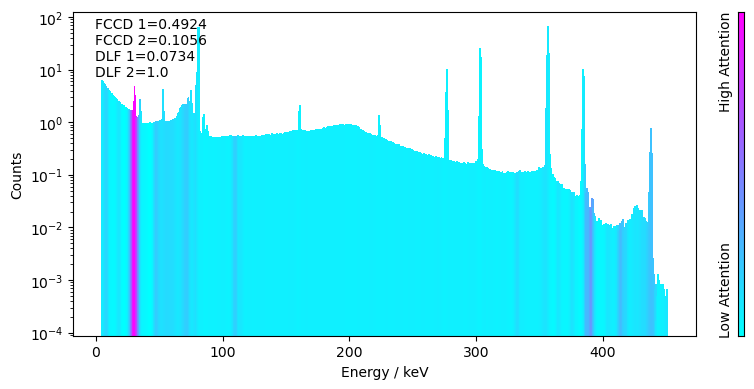

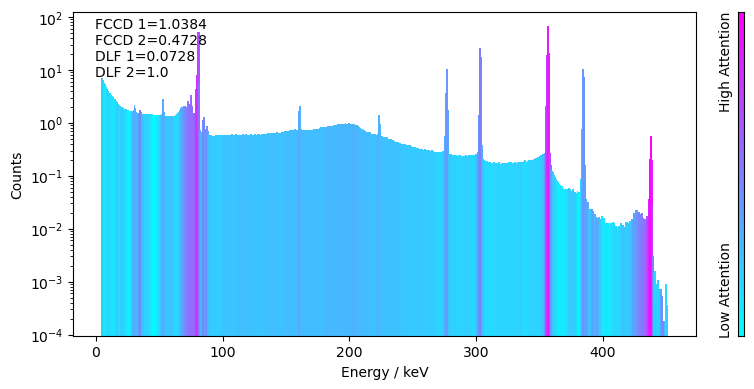

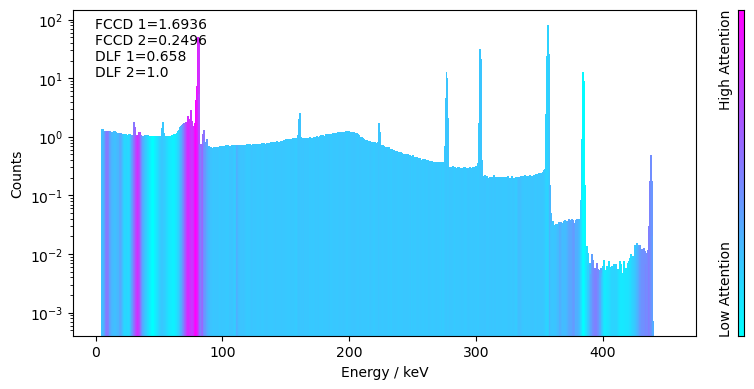

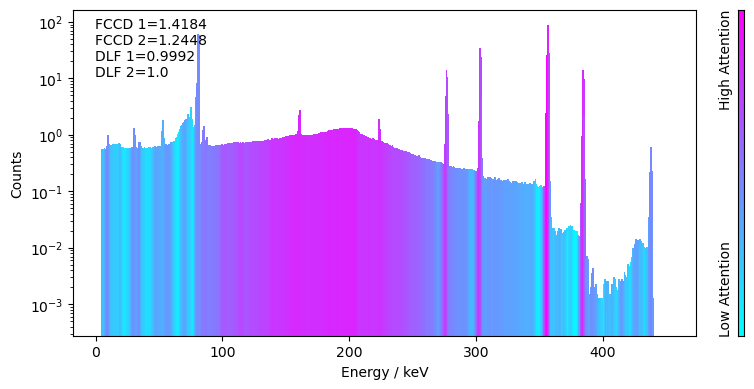

...

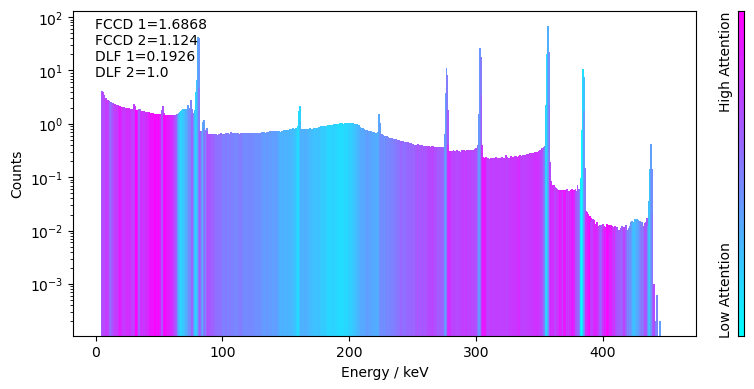

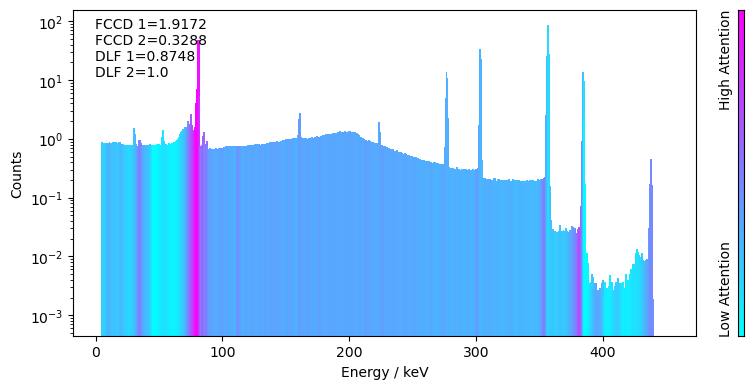

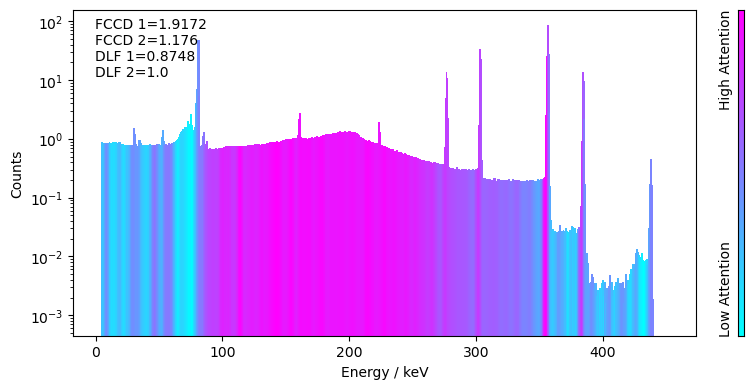

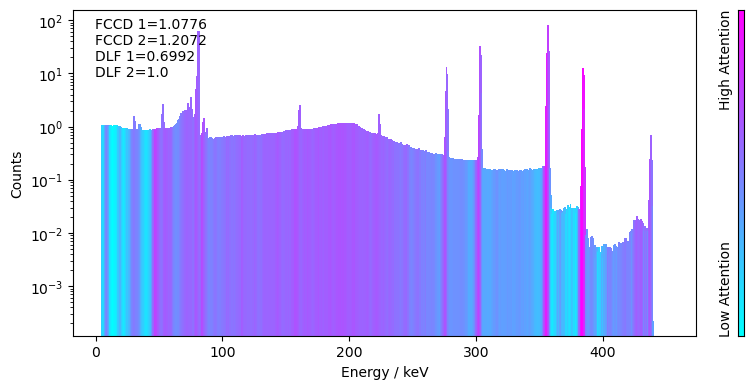

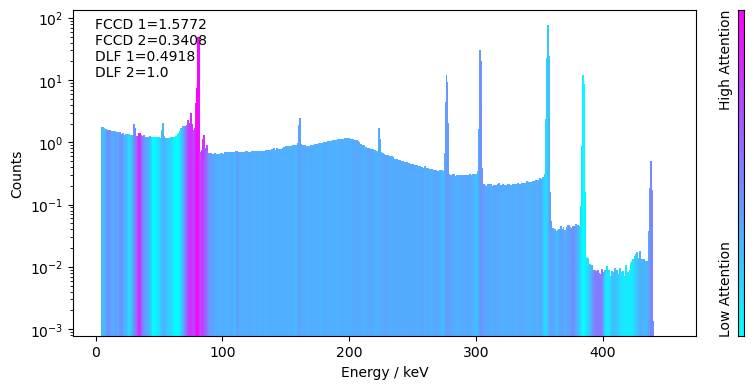

In [34]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.74it/s]


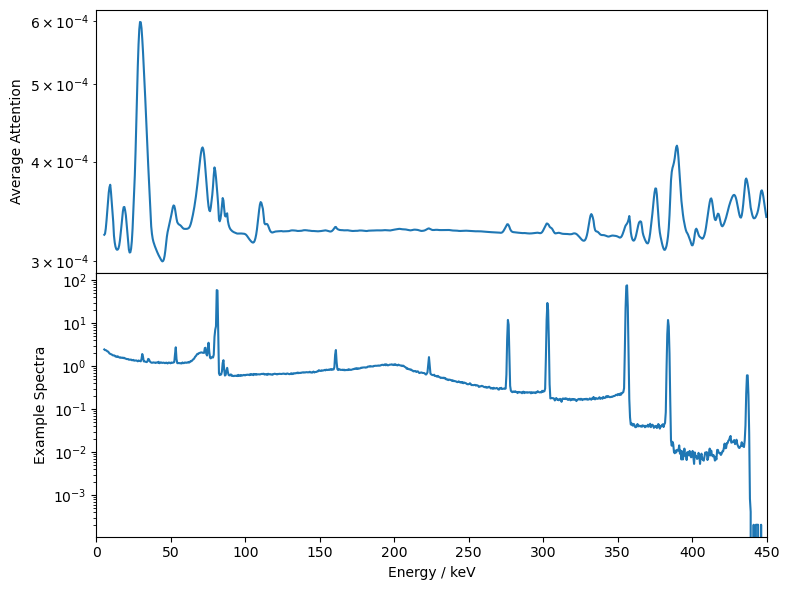

In [35]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 4: restircted dataset - Max FCCD diff = 0.1 mm

In [36]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.1
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff = 0.1 mm

In [37]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:22<00:00, 218.05it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:24<00:00, 207.36it/s]


(4991, 890)


In [38]:
# Load saved model
RNNclassifier_maxFCCDdiff0_1mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_1mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_1mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.44it/s]


FCCD accuracies: 
total:  3000
TP:  1407
FP:  28
TN:  1447
FN:  118
accuracy:  0.9513333333333334
precision:  0.9804878048780488
recall:  0.9226229508196722

DLF accuracies: 
accuracy_DLF:  0.974

roc auc FCCD:  0.9935359822172826

Total # misclassified trials FCCD:  146  / 3000
Total # misclassified trials DLF:  78  / 3000


{'accuracy_FCCD': 0.9513333333333334,
 'precision_FCCD': 0.9804878048780488,
 'recall_FCCD': 0.9226229508196722,
 'accuracy_DLF': 0.974,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9935359822172826,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.009527753260437682,
  'RMSE_DLFmisclassified_FCCD': 0.06123990654668045,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 146,
  'NoMisclassifiedDLF': 78}}

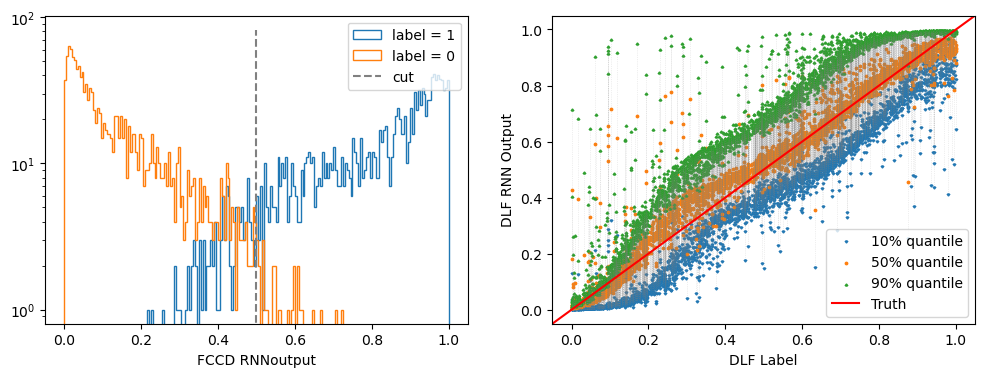

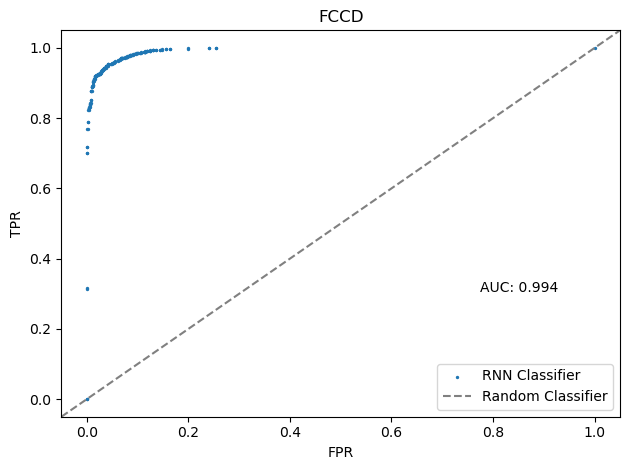

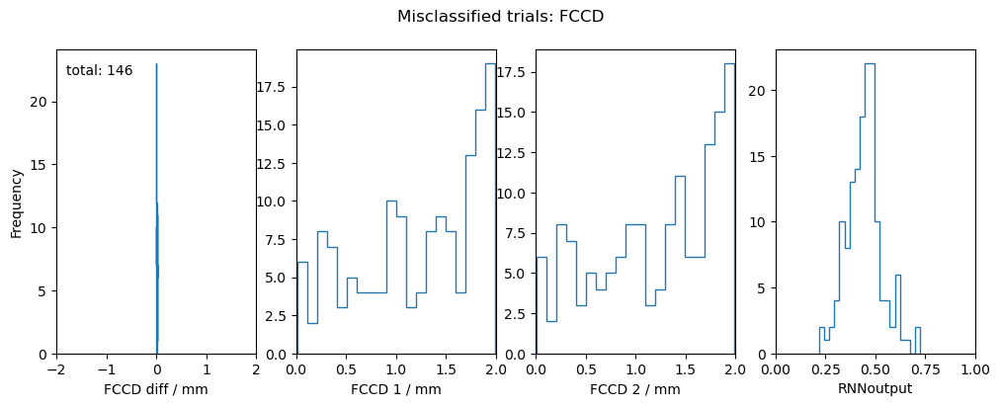

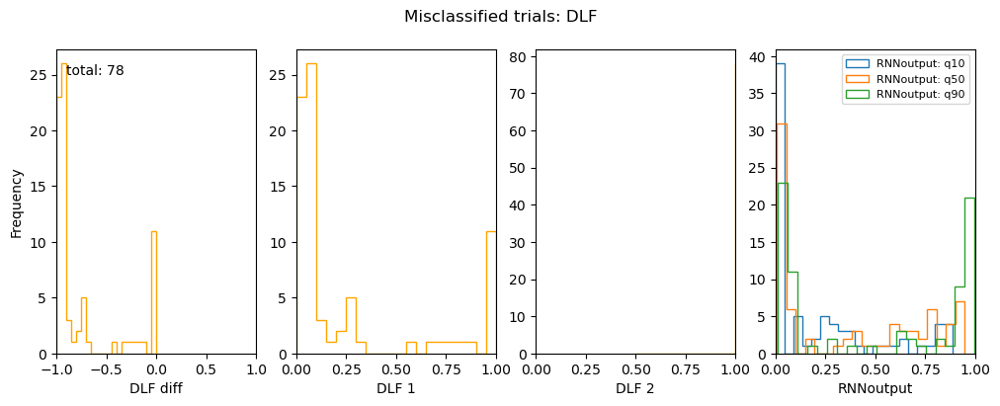

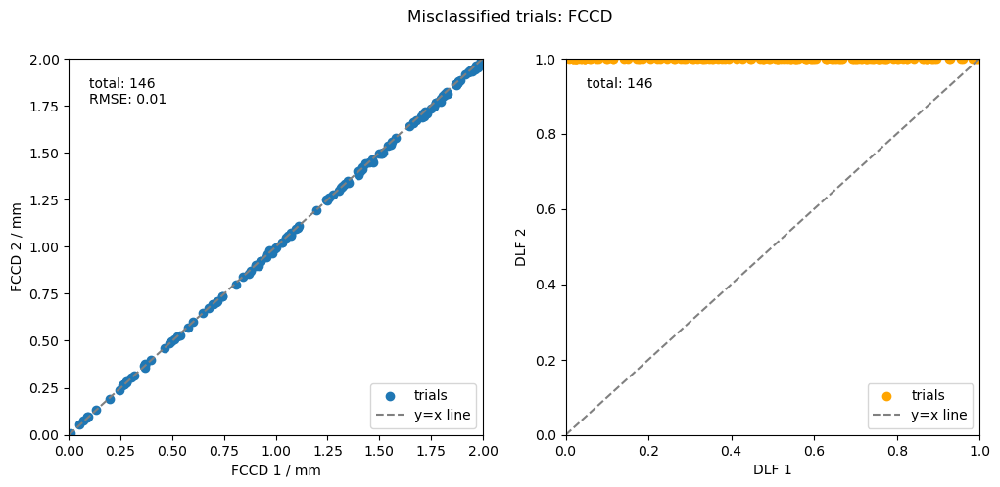

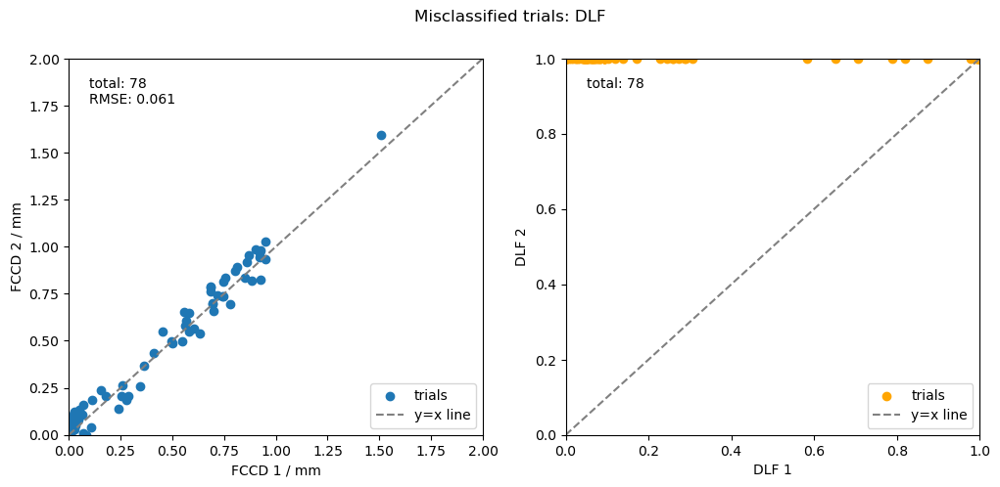

In [39]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

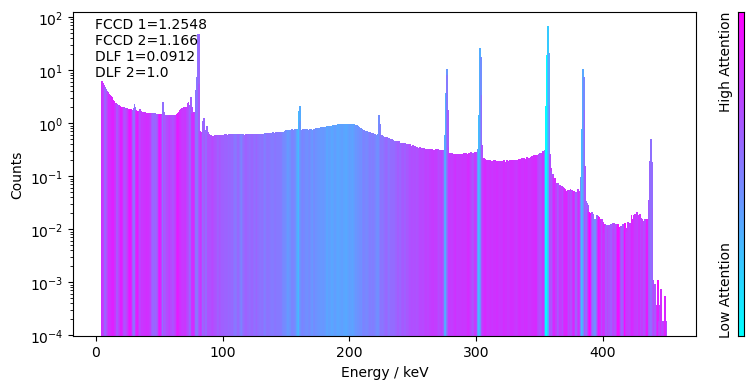

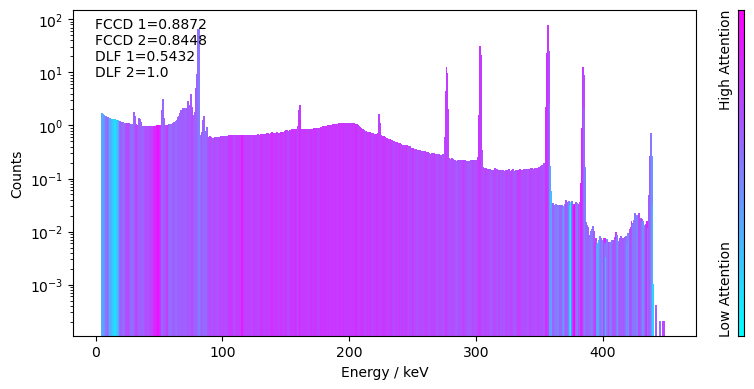

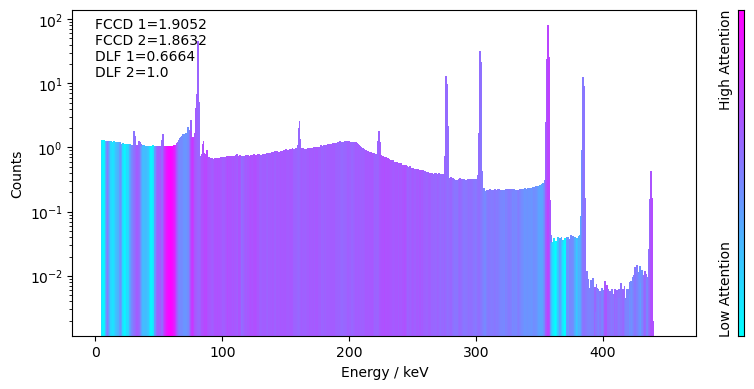

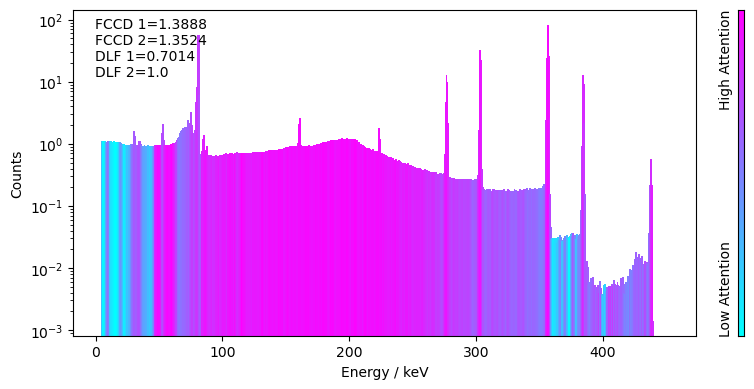

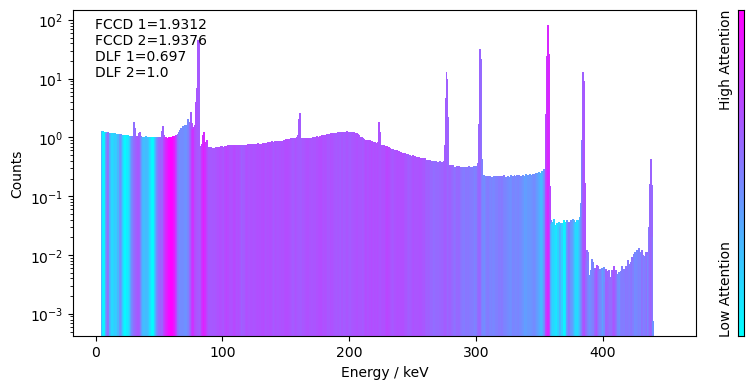

...

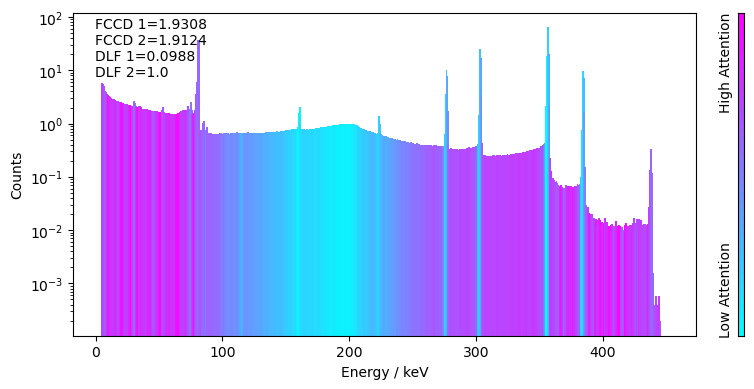

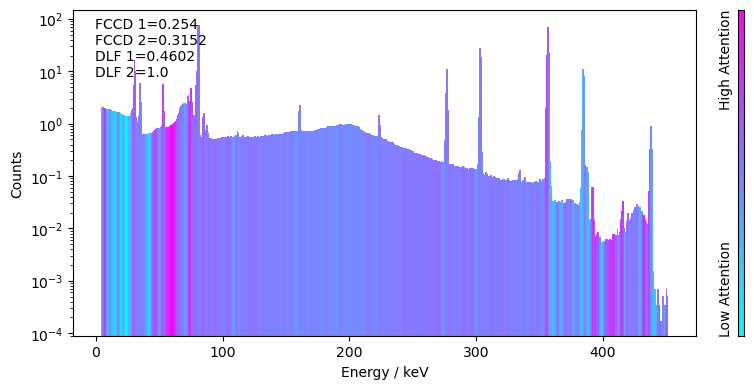

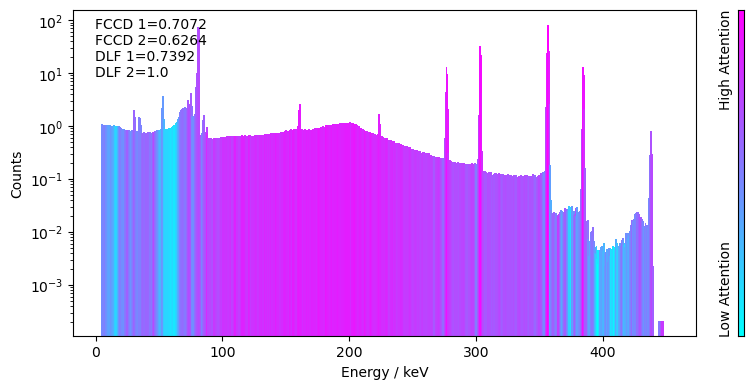

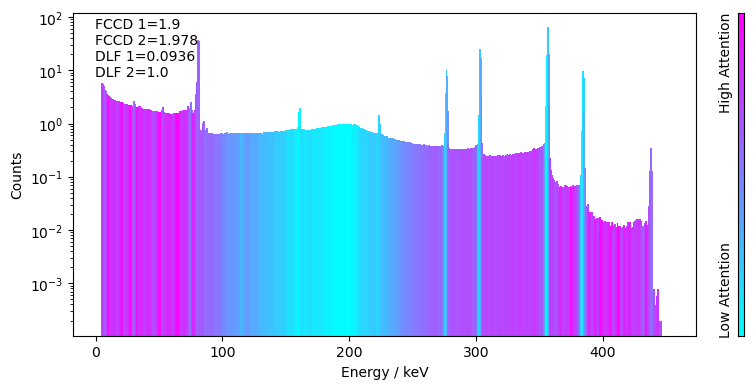

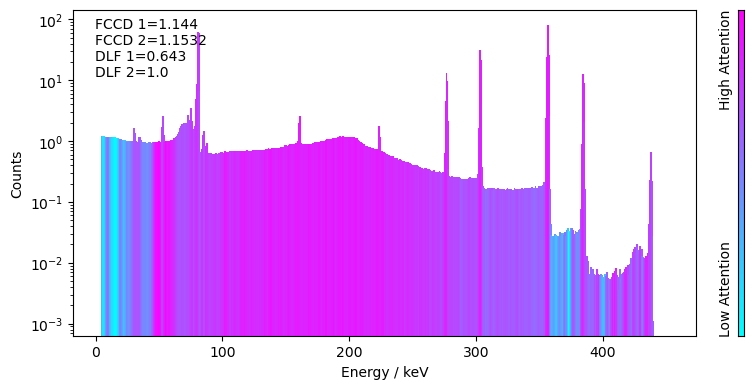

In [40]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.86it/s]


saved average attention to csv file


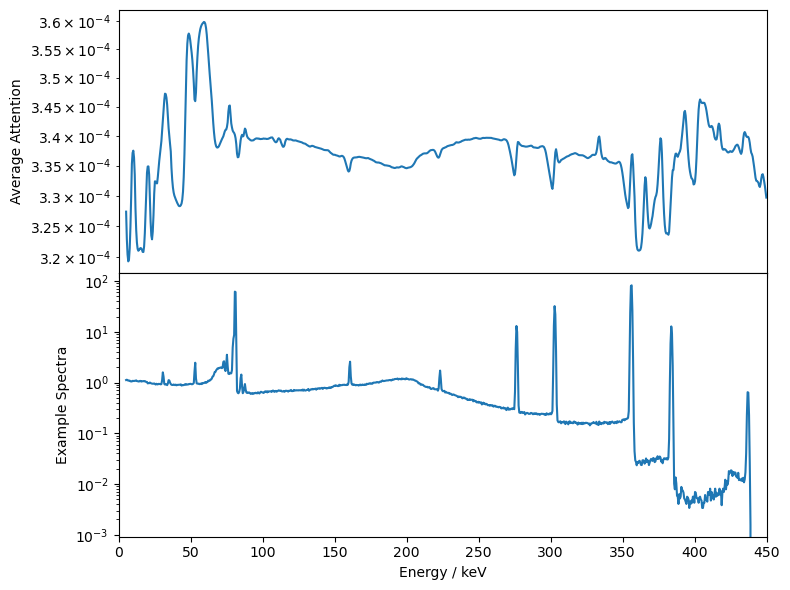

In [41]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing on full dataset

In [42]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:25<00:00, 194.06it/s]


(4991, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:11<00:00, 10.51it/s]


FCCD accuracies: 
total:  3000
TP:  1460
FP:  1
TN:  1529
FN:  10
accuracy:  0.9963333333333333
precision:  0.999315537303217
recall:  0.9931972789115646

DLF accuracies: 
accuracy_DLF:  0.7493333333333333

roc auc FCCD:  0.9999662087057045

Total # misclassified trials FCCD:  11  / 3000
Total # misclassified trials DLF:  752  / 3000


{'accuracy_FCCD': 0.9963333333333333,
 'precision_FCCD': 0.999315537303217,
 'recall_FCCD': 0.9931972789115646,
 'accuracy_DLF': 0.7493333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9999662087057045,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.01361870371617985,
  'RMSE_DLFmisclassified_FCCD': 1.0371684741785143,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 11,
  'NoMisclassifiedDLF': 752}}

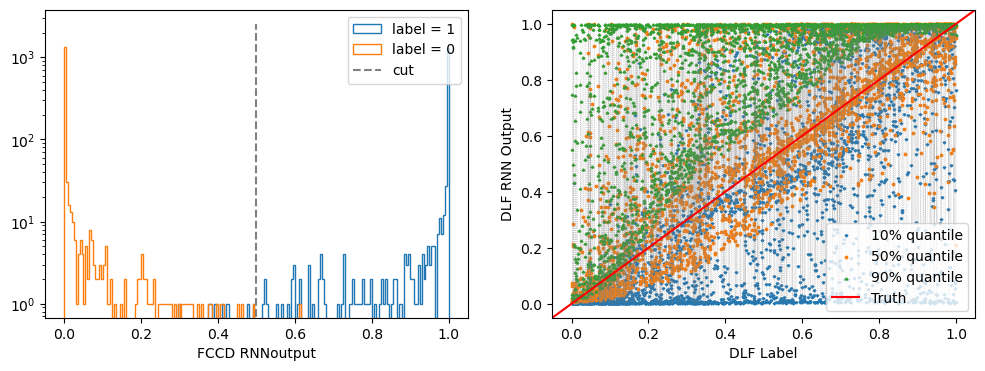

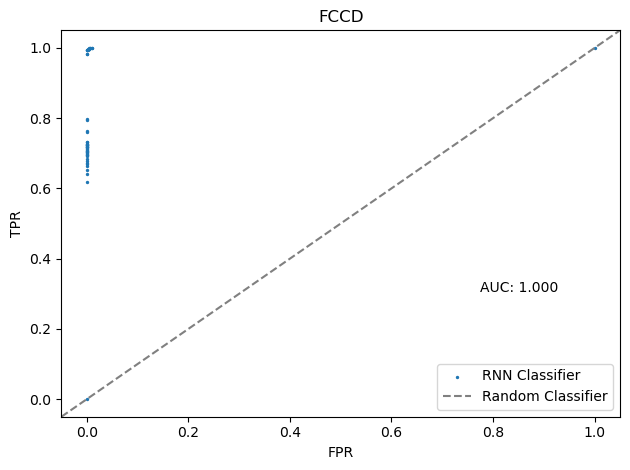

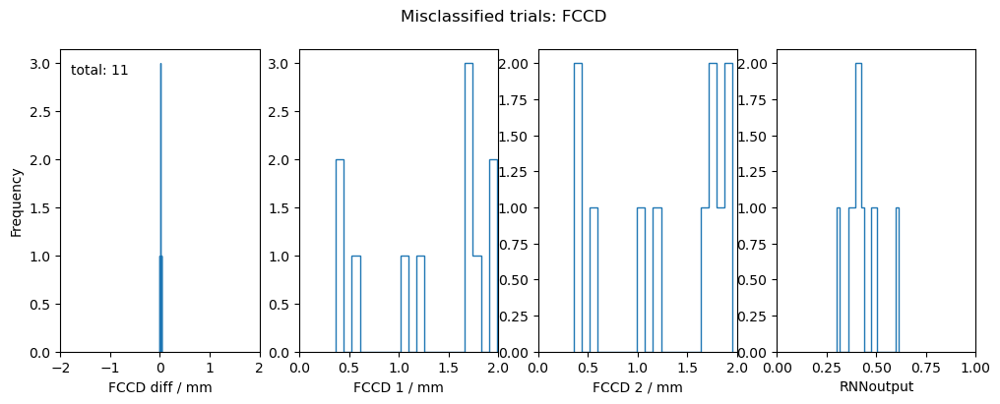

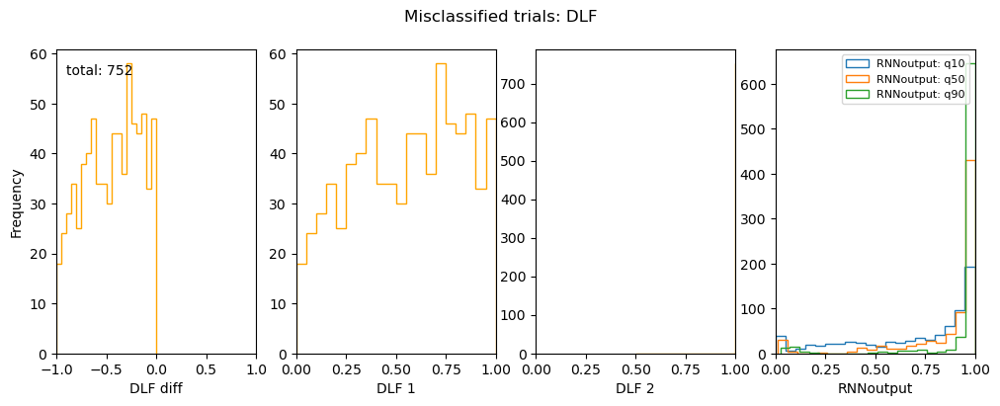

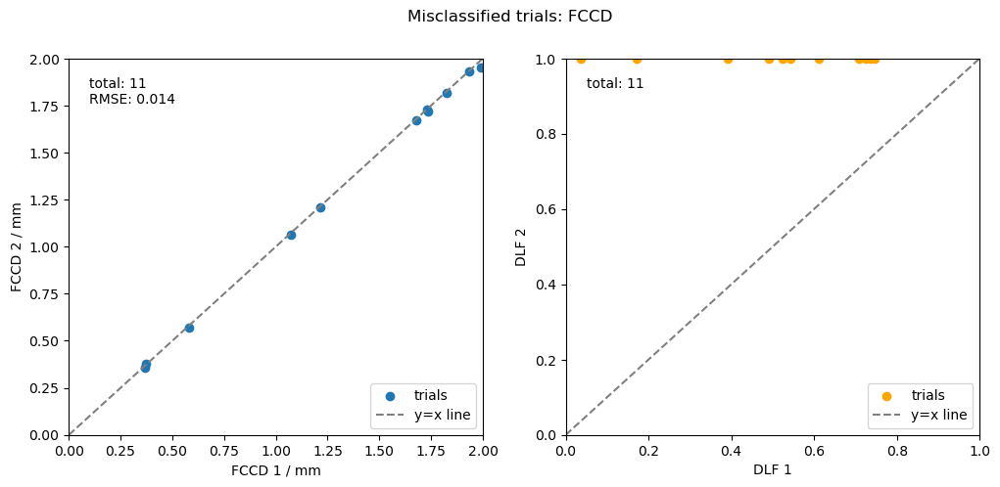

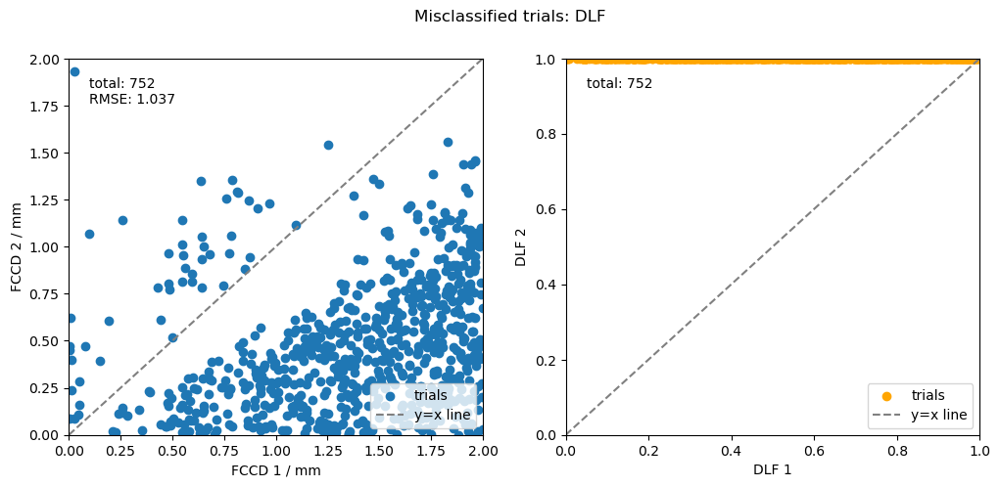

In [43]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

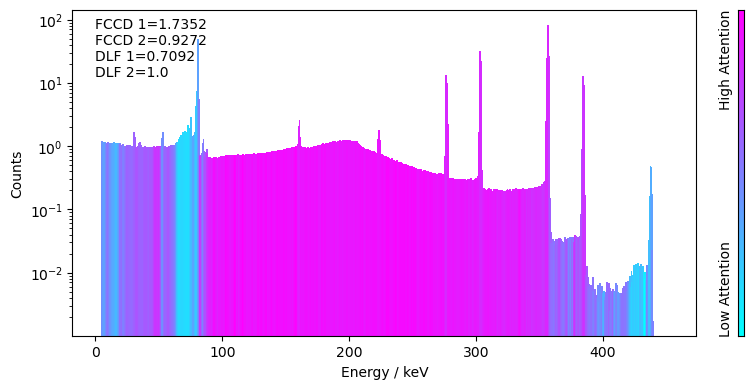

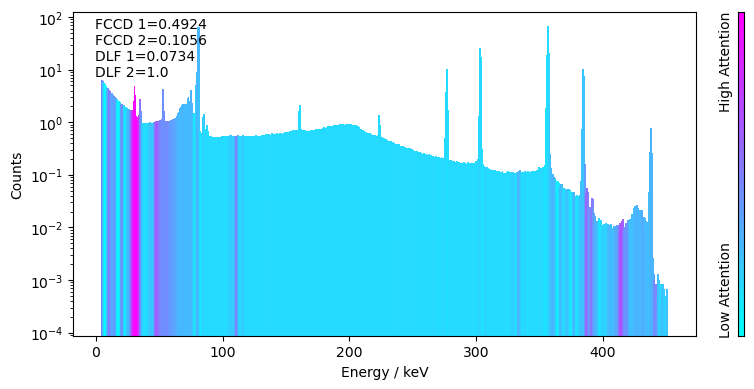

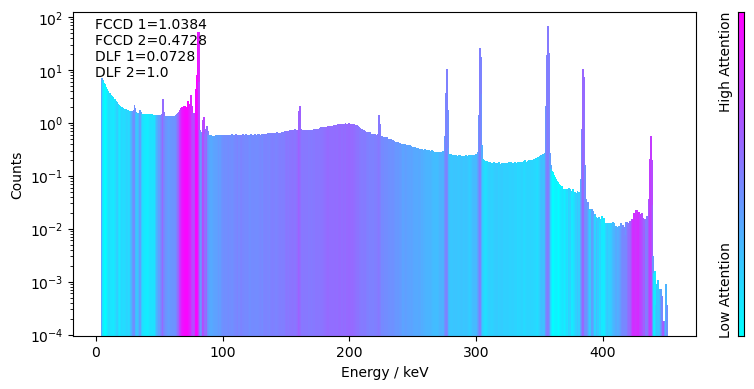

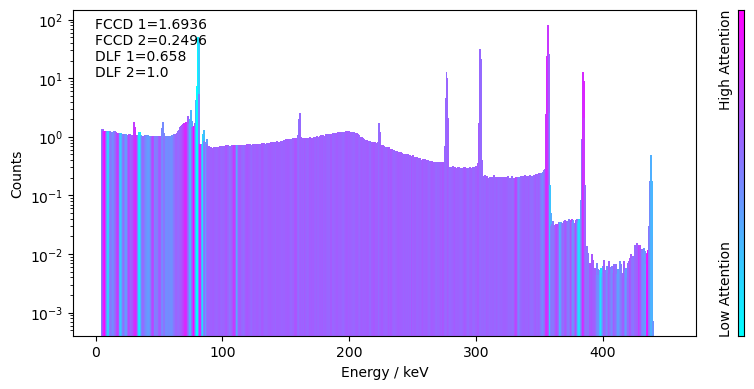

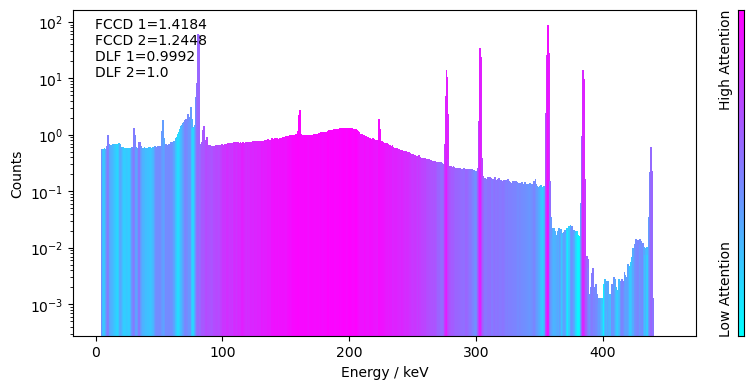

...

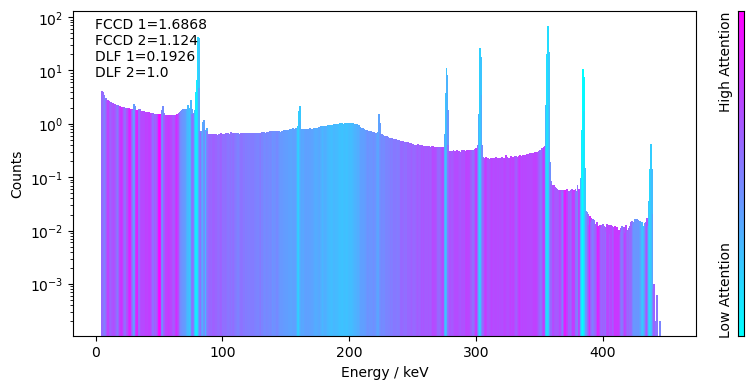

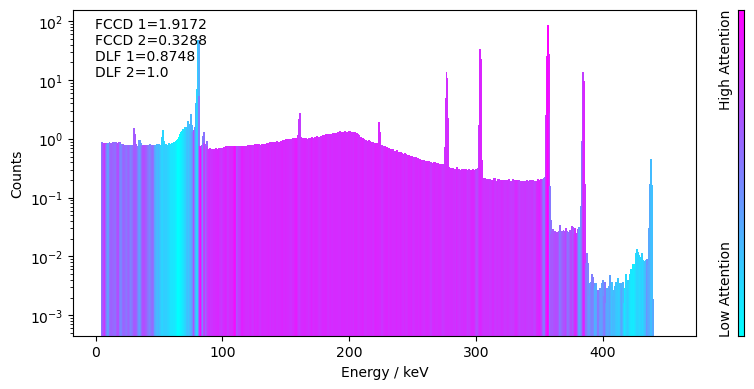

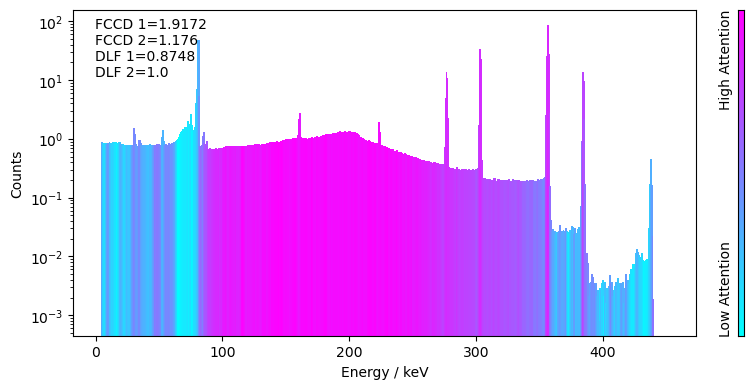

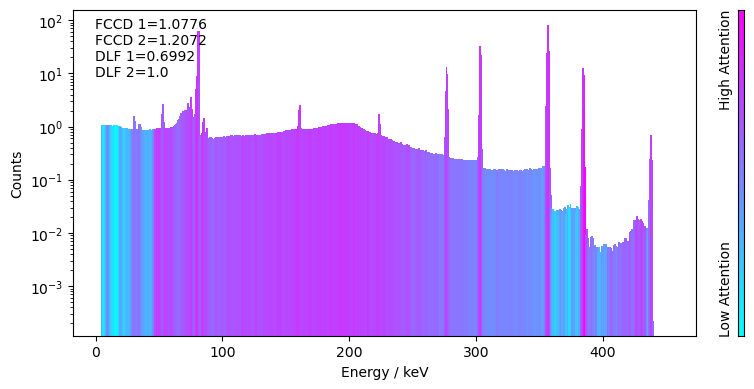

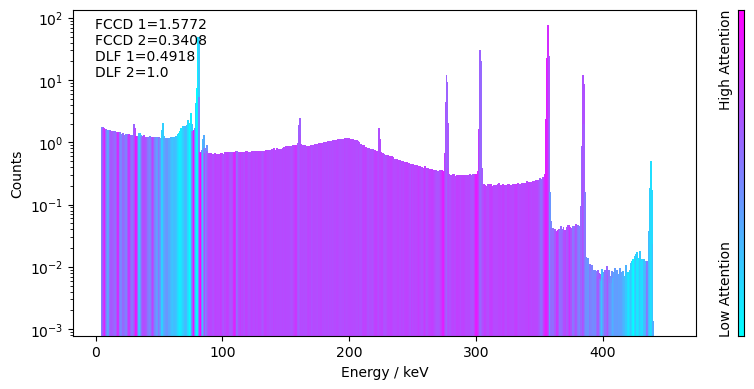

In [44]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.88it/s]


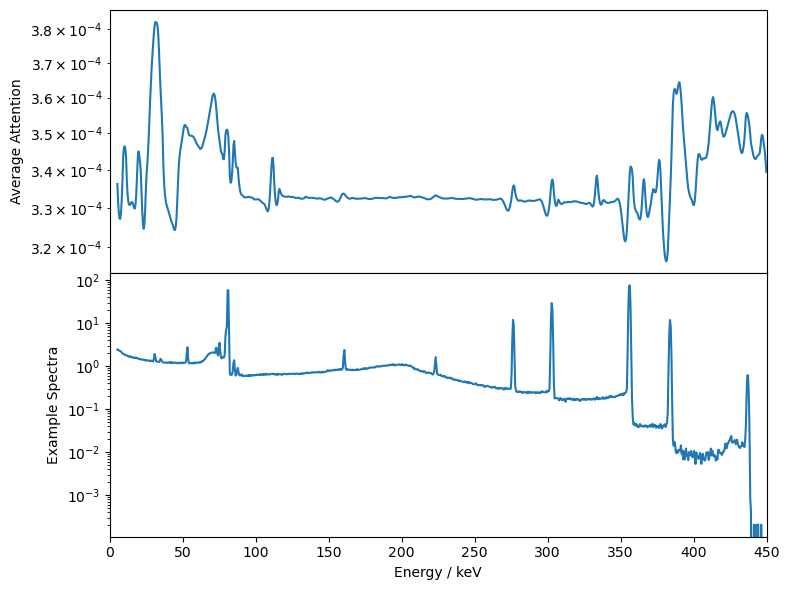

In [45]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 5: restircted dataset - Max FCCD diff = 0.05 mm

In [46]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.05
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.05 mm

In [47]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 188.06it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:23<00:00, 213.06it/s]

(4991, 890)


In [48]:
# Load saved model
RNNclassifier_maxFCCDdiff0_05mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_05mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_05mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:06<00:00, 11.26it/s]


FCCD accuracies: 
total:  3000
TP:  1420
FP:  135
TN:  1366
FN:  79
accuracy:  0.9286666666666666
precision:  0.9131832797427653
recall:  0.9472981987991995

DLF accuracies: 
accuracy_DLF:  0.9816666666666667

roc auc FCCD:  0.98316399251733

Total # misclassified trials FCCD:  214  / 3000
Total # misclassified trials DLF:  55  / 3000


{'accuracy_FCCD': 0.9286666666666666,
 'precision_FCCD': 0.9131832797427653,
 'recall_FCCD': 0.9472981987991995,
 'accuracy_DLF': 0.9816666666666667,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.98316399251733,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.008241086944007547,
  'RMSE_DLFmisclassified_FCCD': 0.027961688074935678,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 214,
  'NoMisclassifiedDLF': 55}}

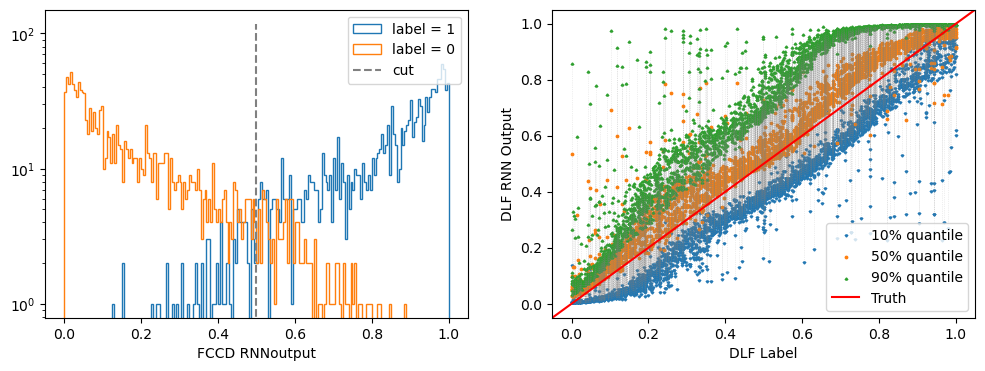

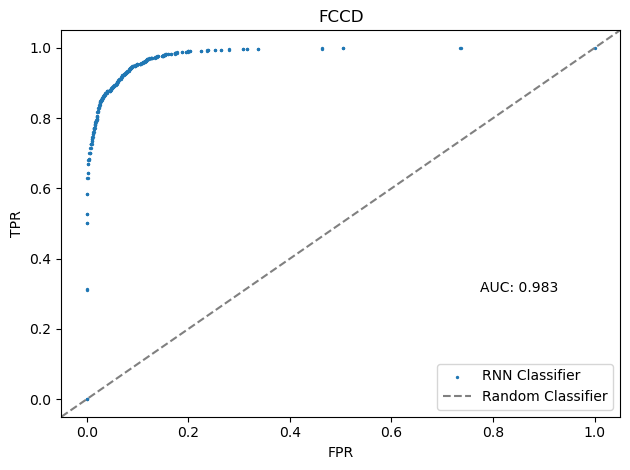

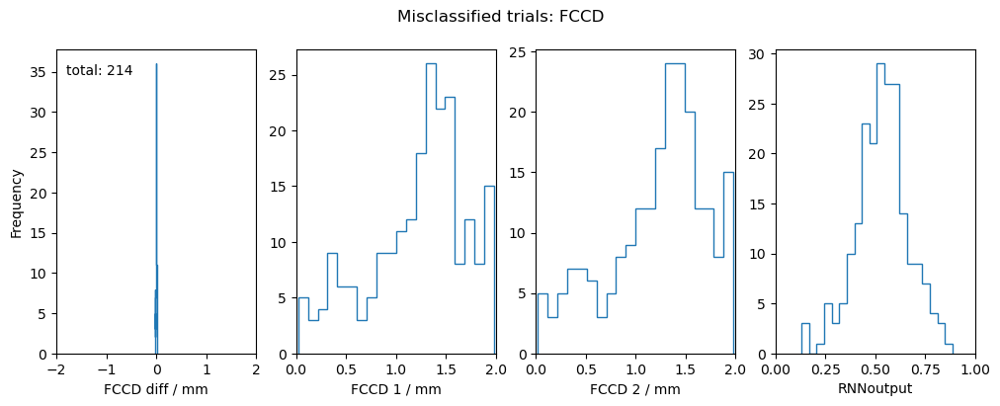

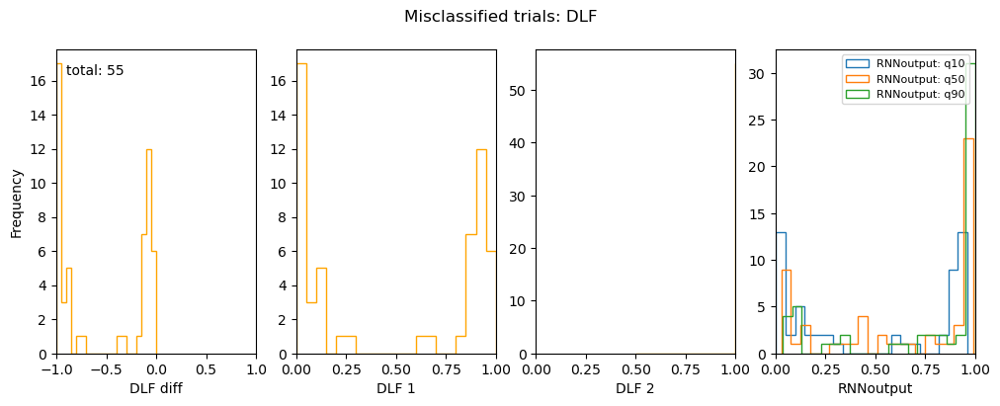

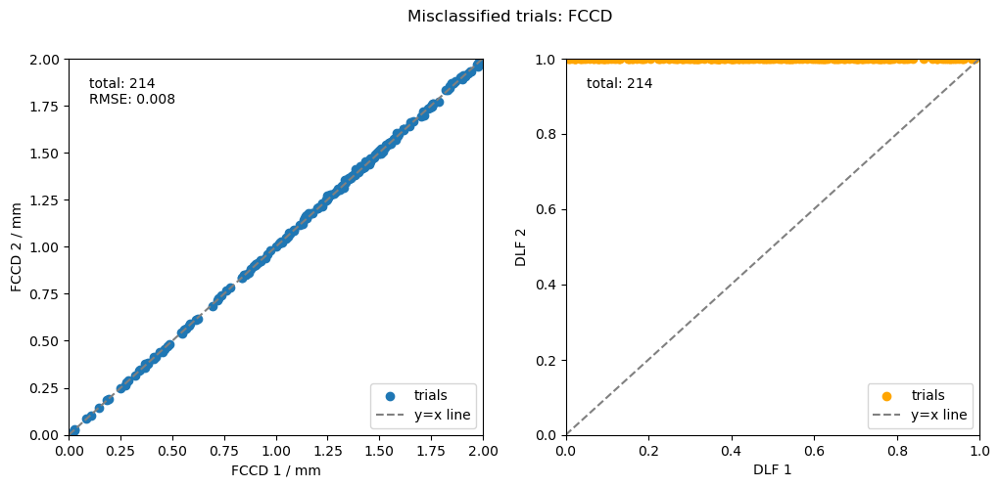

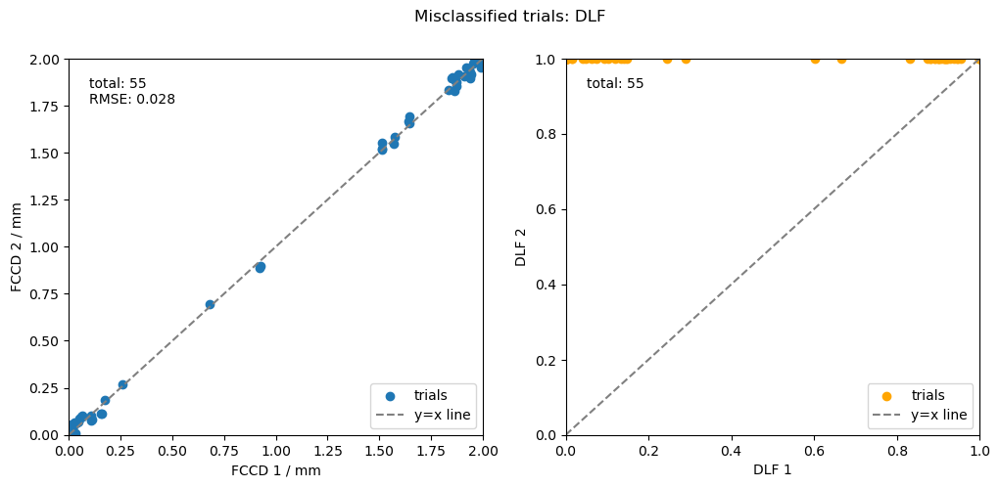

In [49]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

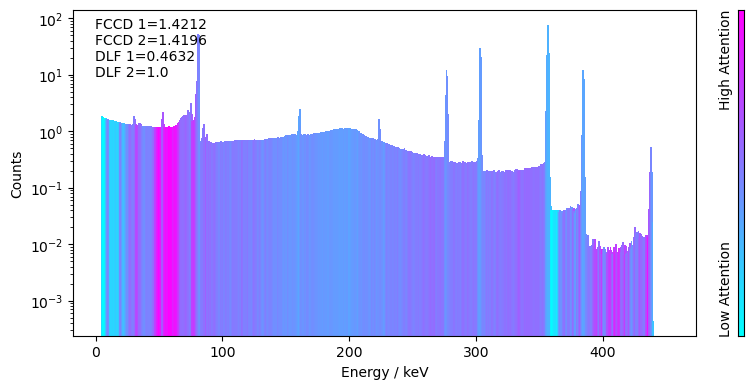

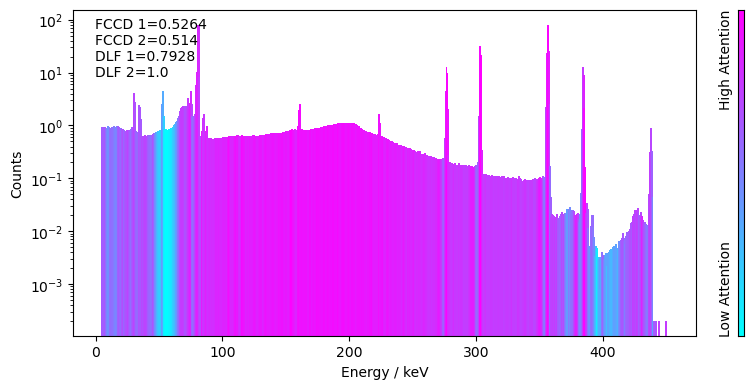

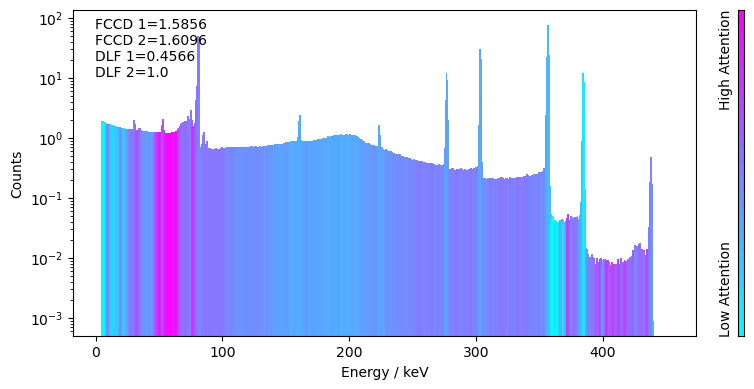

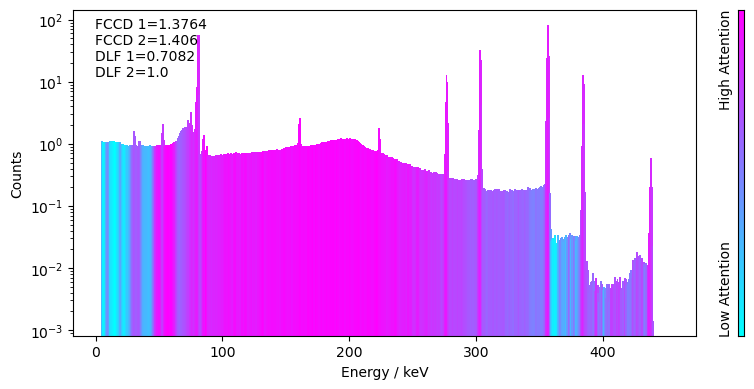

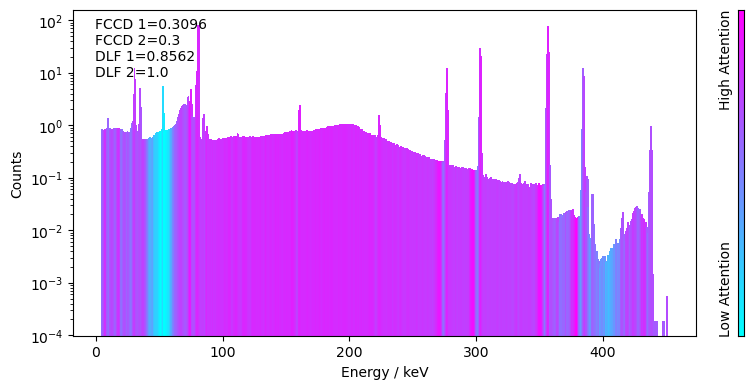

...

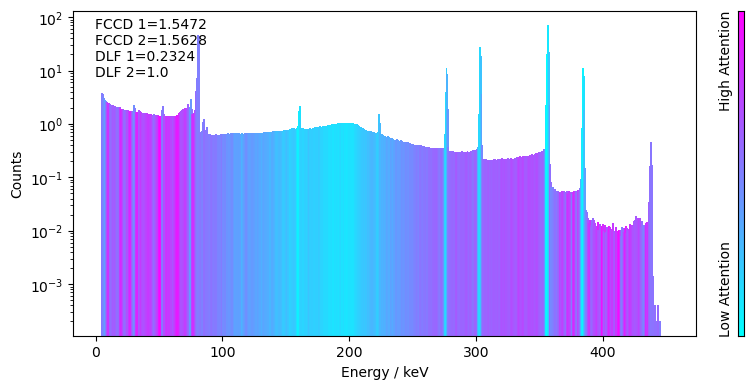

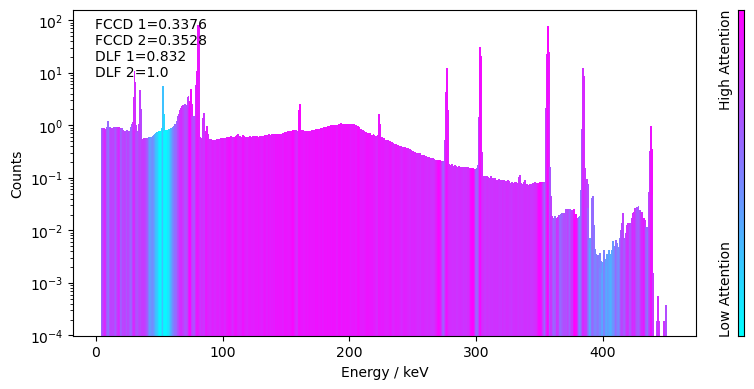

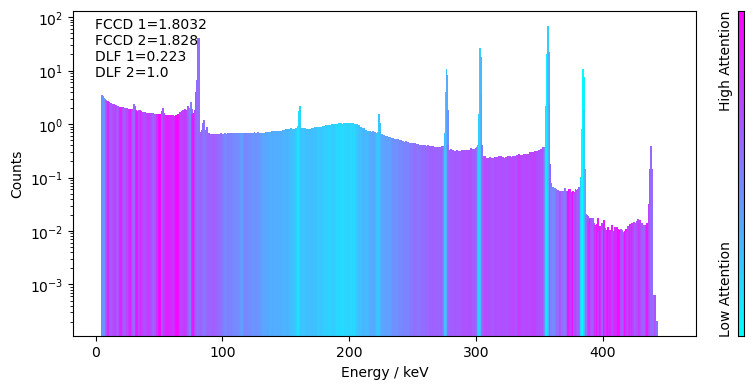

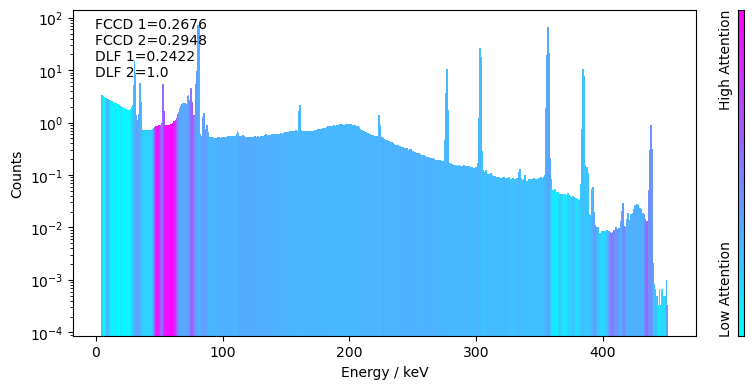

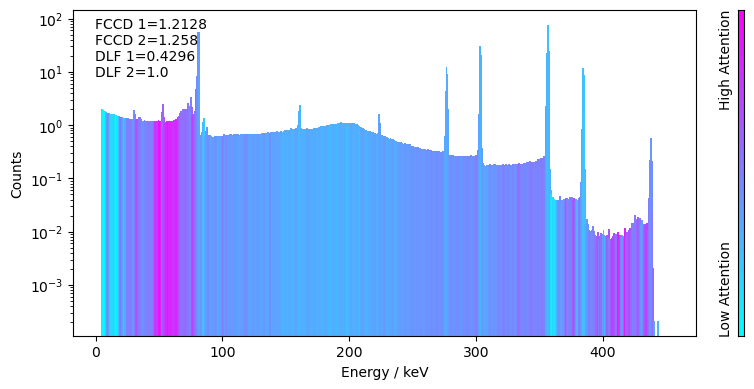

In [50]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.89it/s]


saved average attention to csv file


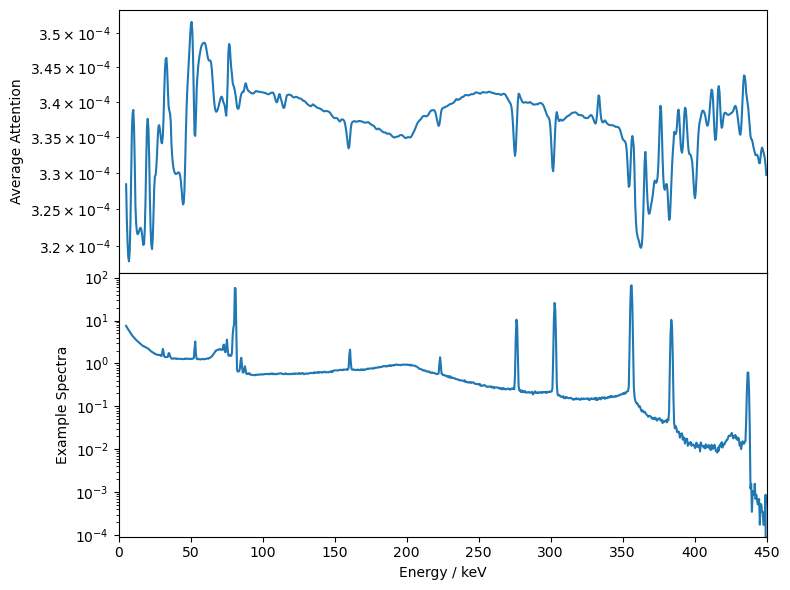

In [51]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [52]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True, normaliseSpectraUnity = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:22<00:00, 221.99it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:24<00:00, 204.31it/s]


(4991, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:11<00:00, 10.47it/s]


FCCD accuracies: 
total:  3000
TP:  1465
FP:  5
TN:  1525
FN:  5
accuracy:  0.9966666666666667
precision:  0.9965986394557823
recall:  0.9965986394557823

DLF accuracies: 
accuracy_DLF:  0.7743333333333333

roc auc FCCD:  0.9999759903961585

Total # misclassified trials FCCD:  10  / 3000
Total # misclassified trials DLF:  677  / 3000


{'accuracy_FCCD': 0.9966666666666667,
 'precision_FCCD': 0.9965986394557823,
 'recall_FCCD': 0.9965986394557823,
 'accuracy_DLF': 0.7743333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9999759903961585,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.010671082419323756,
  'RMSE_DLFmisclassified_FCCD': 1.081542071137127,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 10,
  'NoMisclassifiedDLF': 677}}

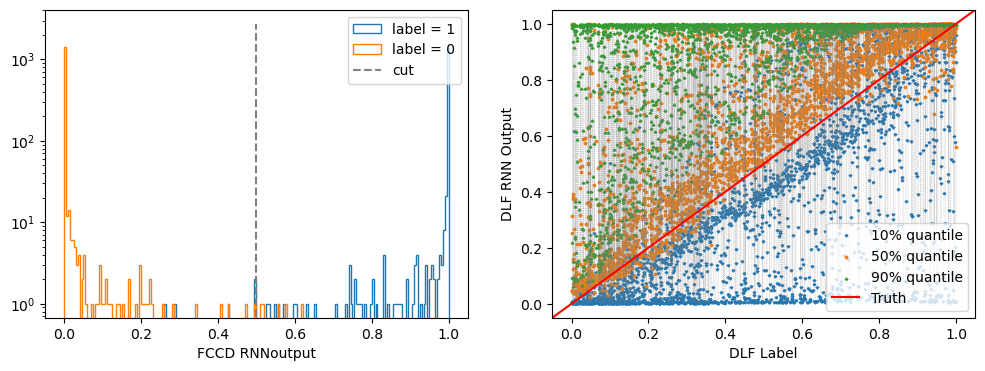

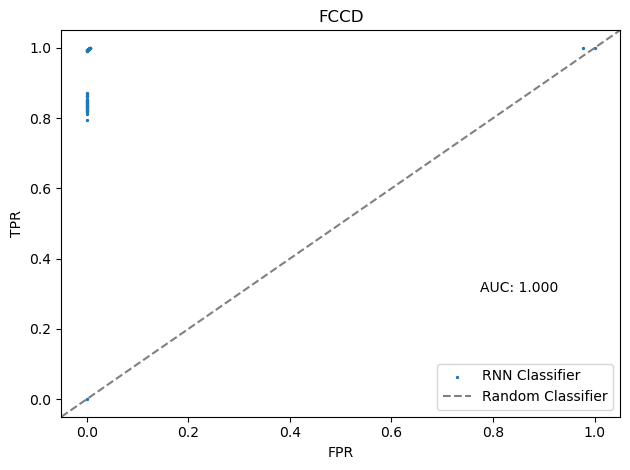

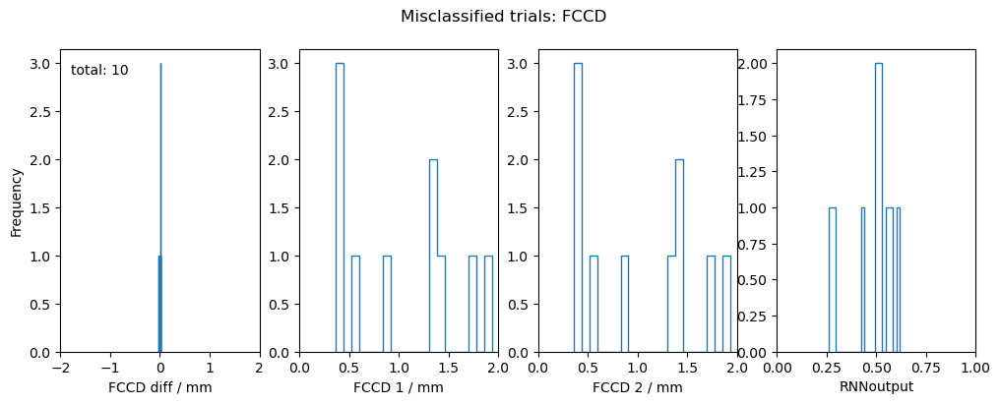

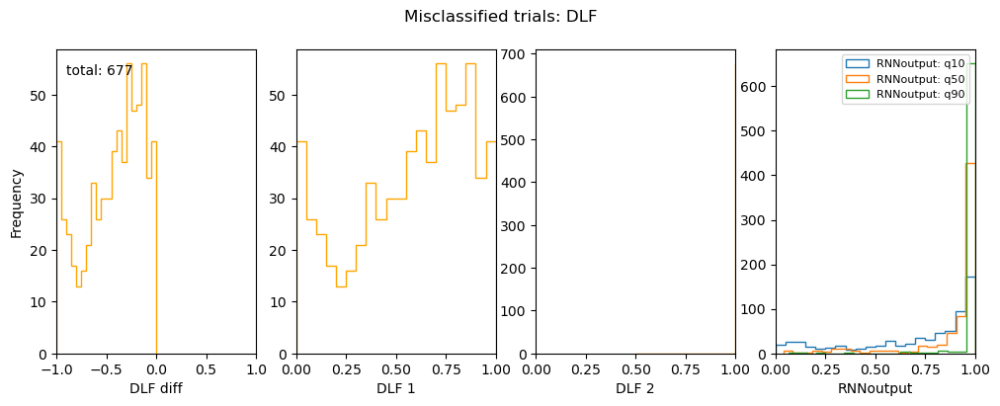

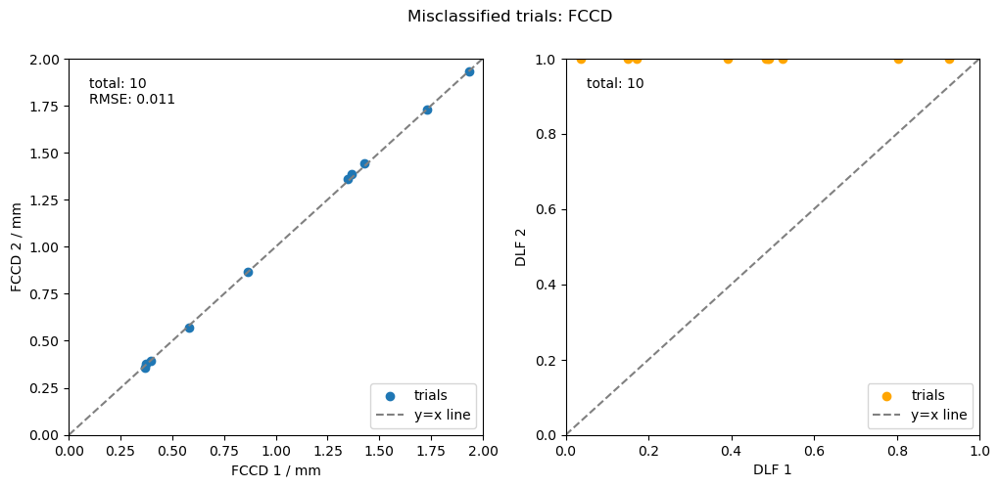

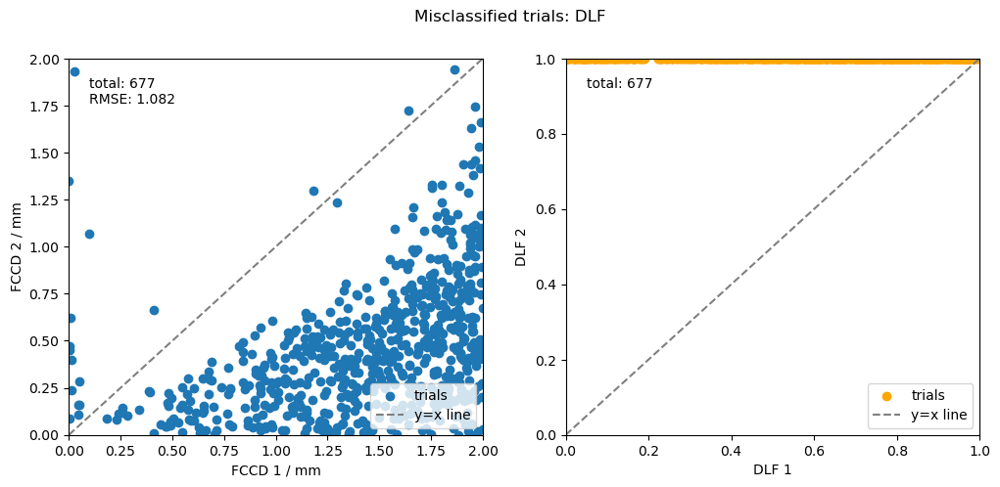

In [53]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

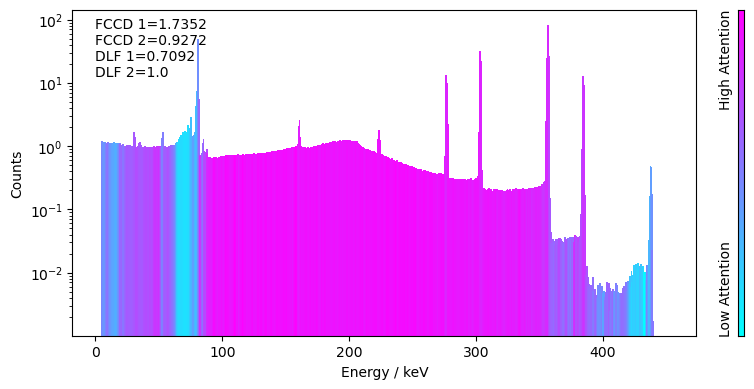

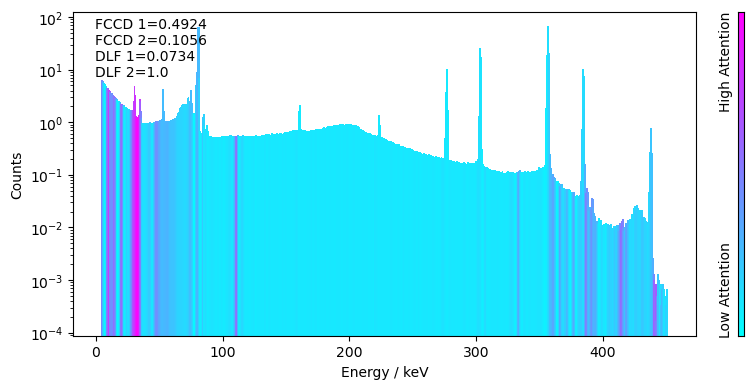

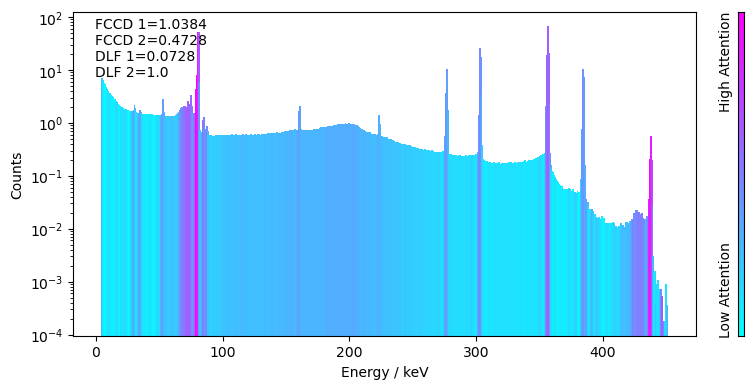

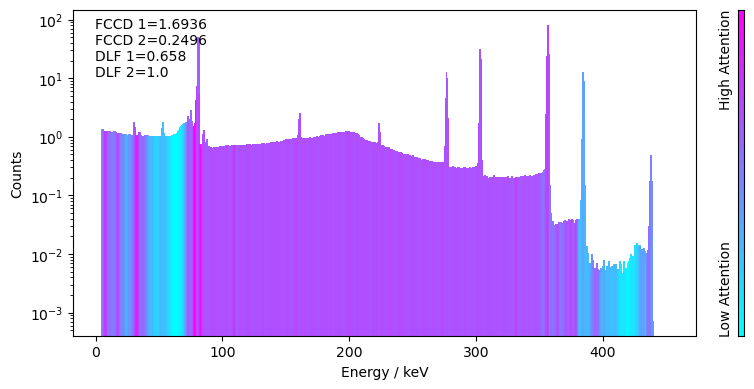

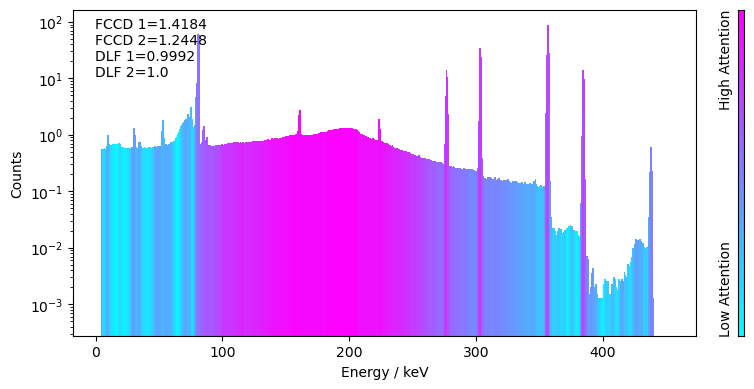

...

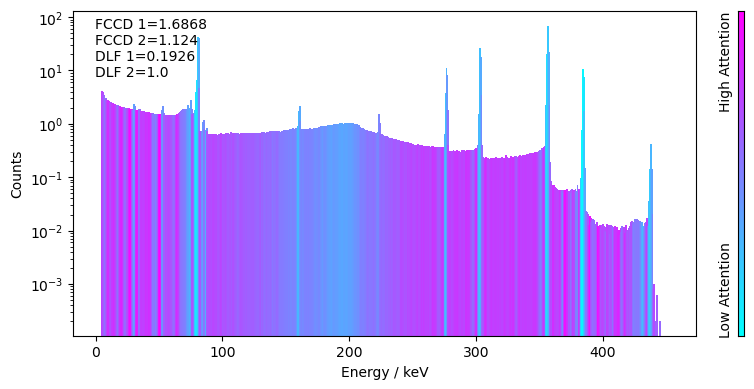

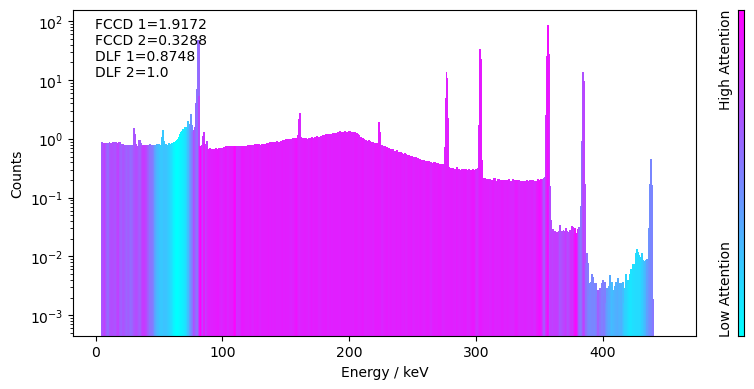

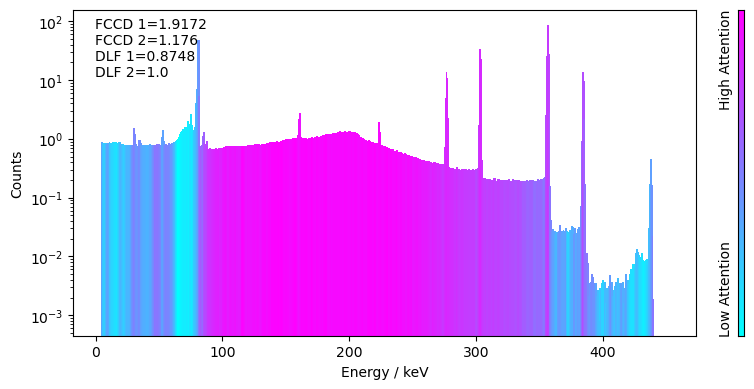

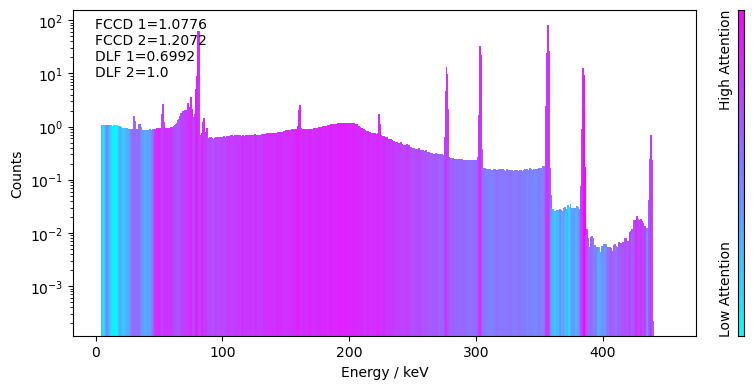

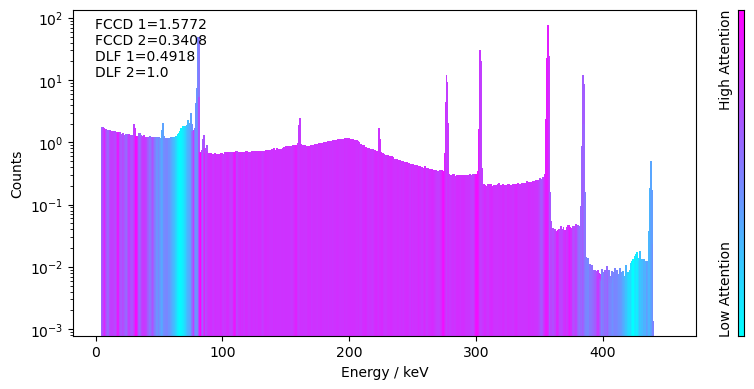

In [54]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.66it/s]


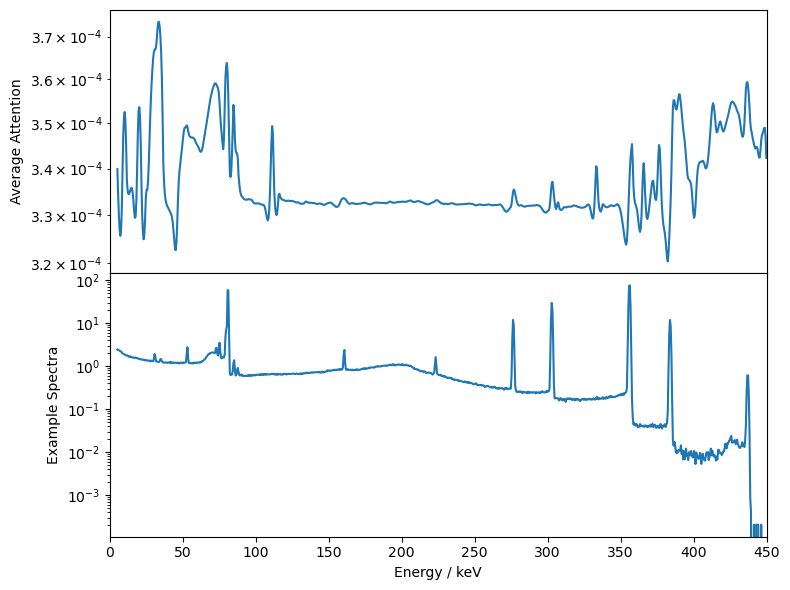

In [55]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 6: restircted dataset - Max FCCD diff = 0.01 mm

In [70]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.01
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.01 mm

In [71]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:40<00:00, 120.08it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:32<00:00, 154.36it/s]


(4991, 890)


In [72]:
# Load saved model
RNNclassifier_maxFCCDdiff0_01mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_01mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_01mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.79it/s]


FCCD accuracies: 
total:  3000
TP:  1315
FP:  1012
TN:  395
FN:  278
accuracy:  0.57
precision:  0.5651052857756769
recall:  0.8254865034526051

DLF accuracies: 
accuracy_DLF:  0.99

roc auc FCCD:  0.5868987052898007

Total # misclassified trials FCCD:  1290  / 3000
Total # misclassified trials DLF:  30  / 3000


{'accuracy_FCCD': 0.57,
 'precision_FCCD': 0.5651052857756769,
 'recall_FCCD': 0.8254865034526051,
 'accuracy_DLF': 0.99,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.5868987052898007,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.005676269109877709,
  'RMSE_DLFmisclassified_FCCD': 0.005169139193328029,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 1290,
  'NoMisclassifiedDLF': 30}}

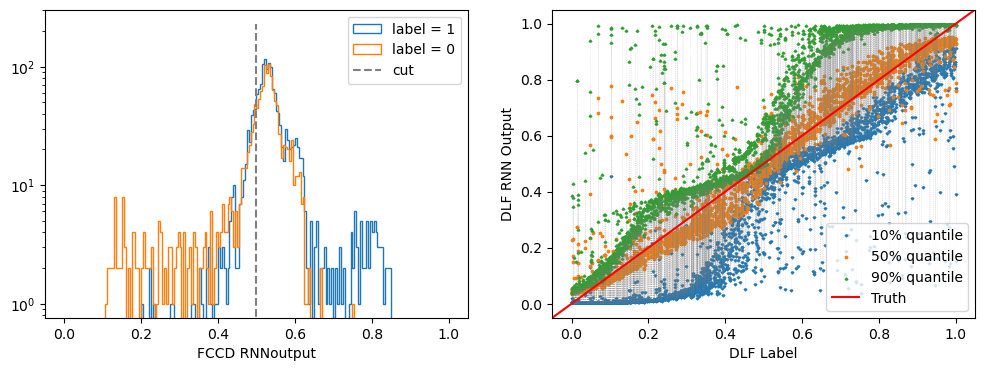

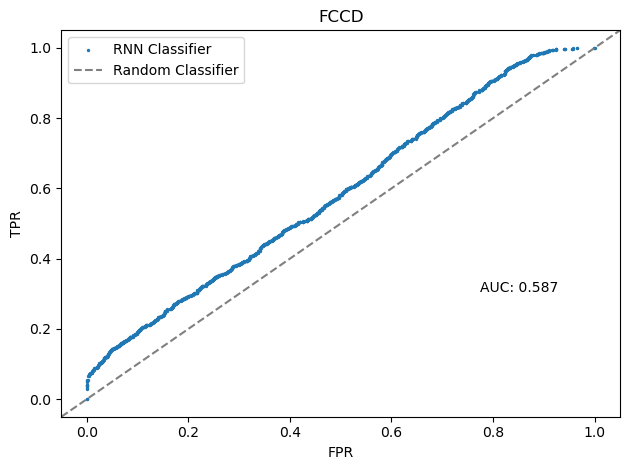

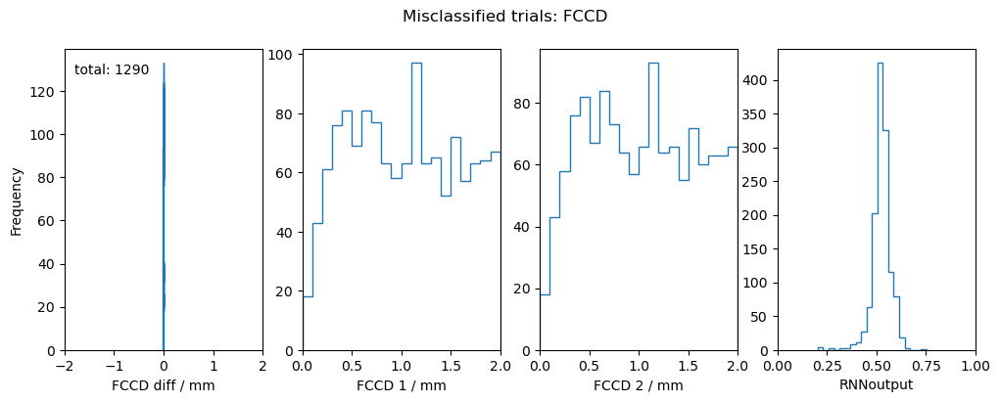

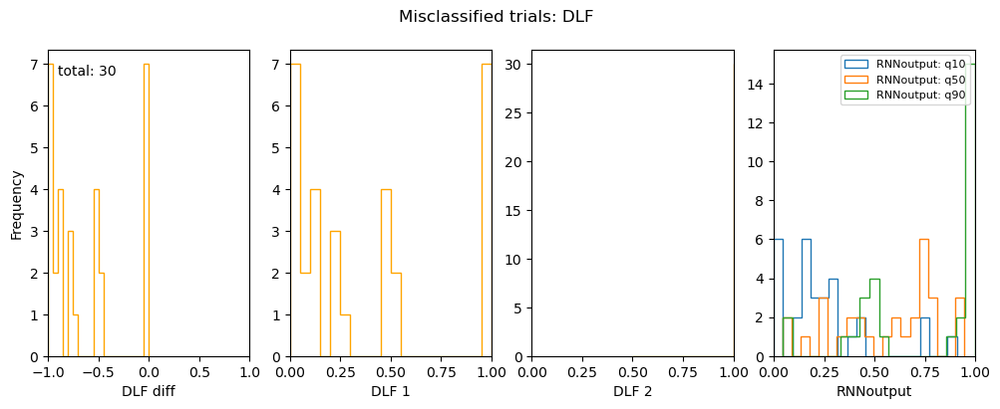

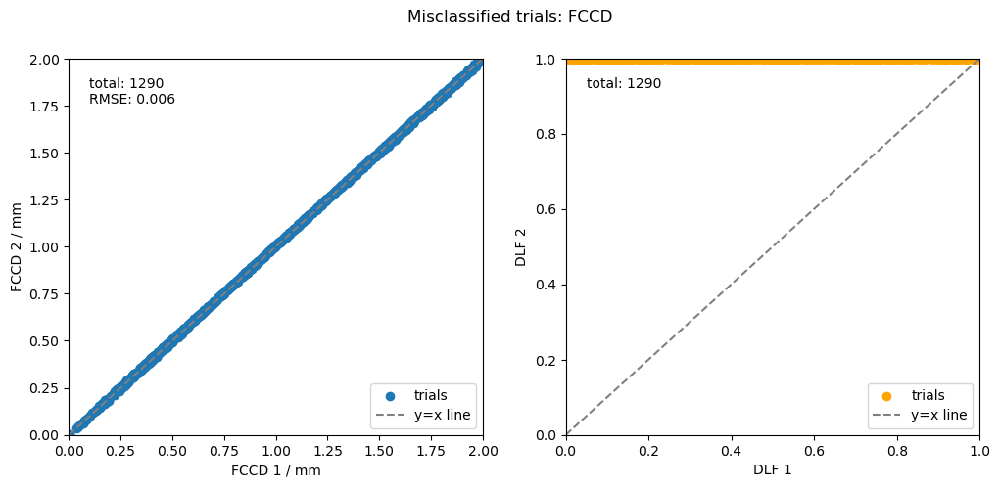

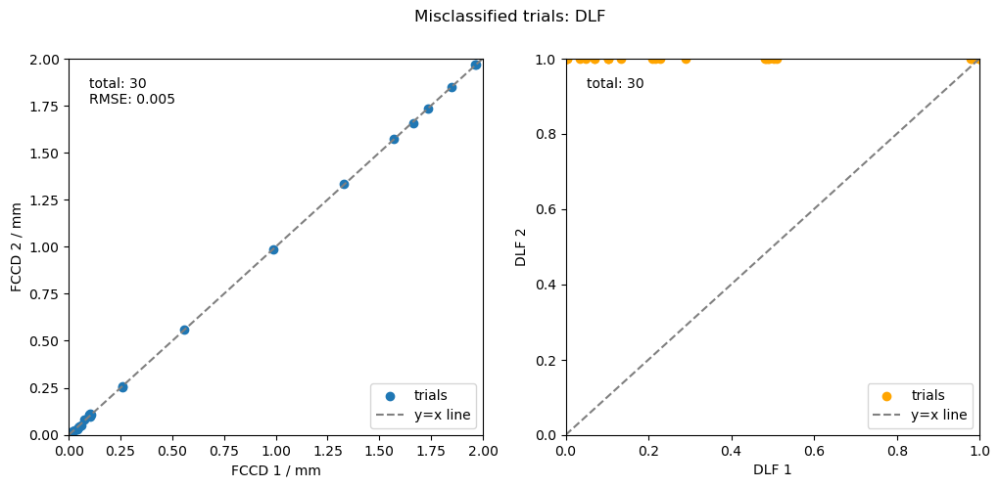

In [73]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

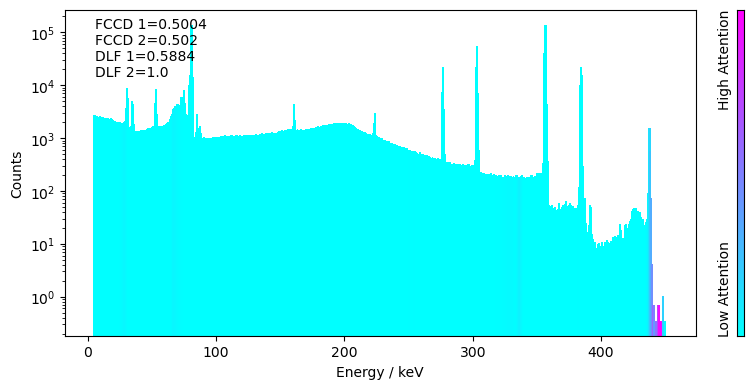

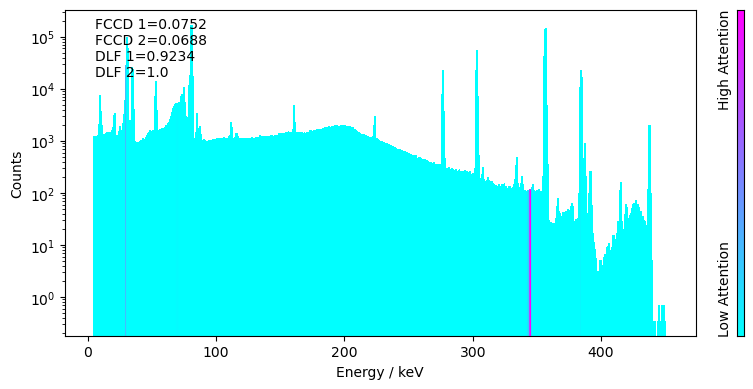

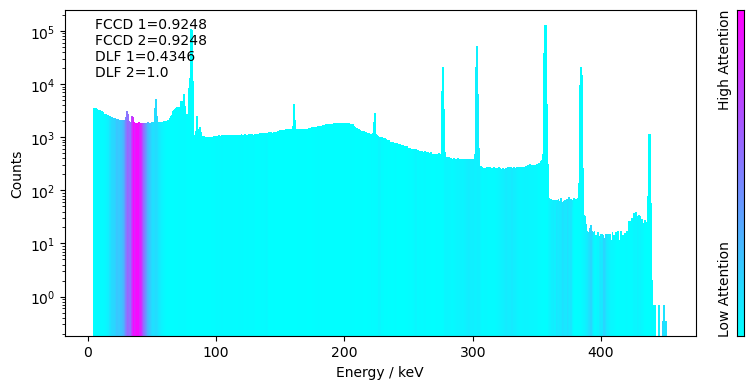

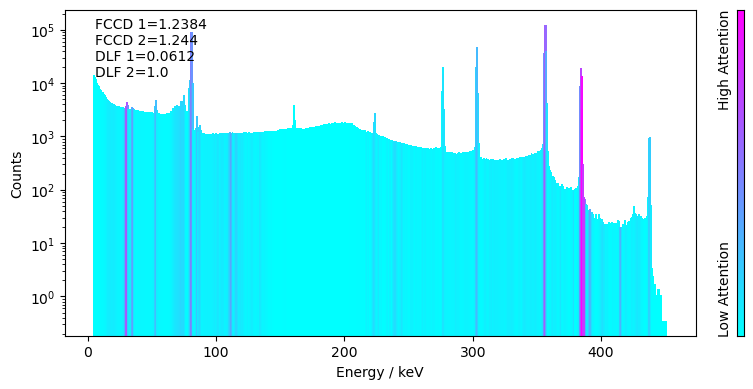

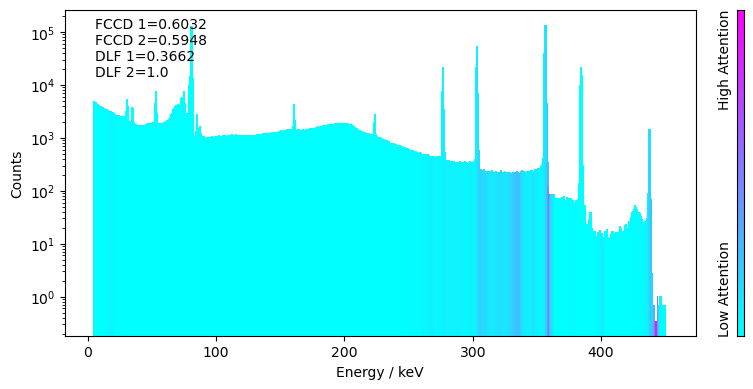

...

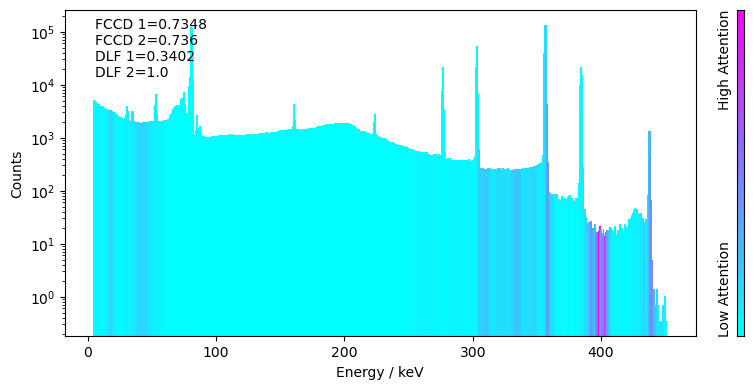

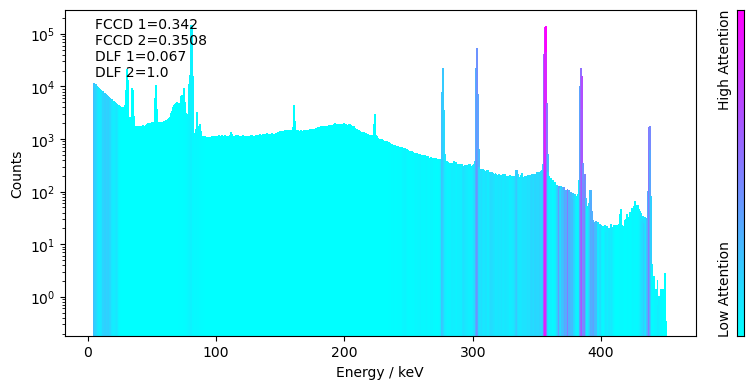

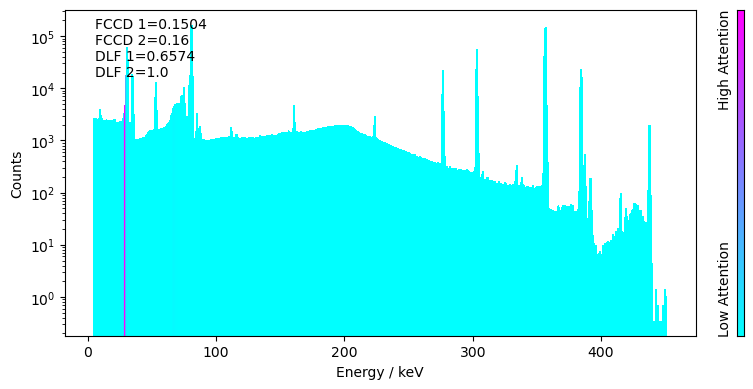

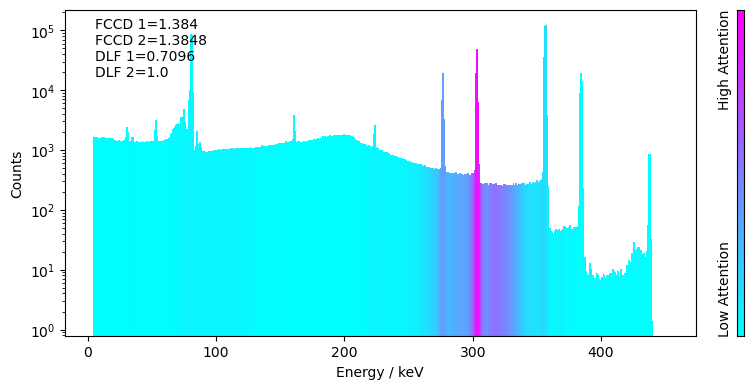

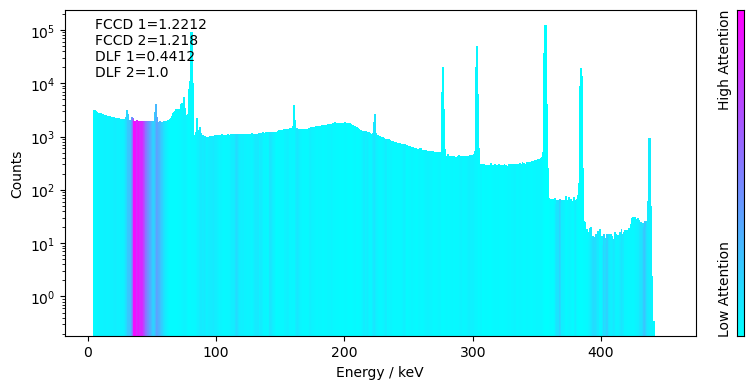

In [74]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.97it/s]


saved average attention to csv file


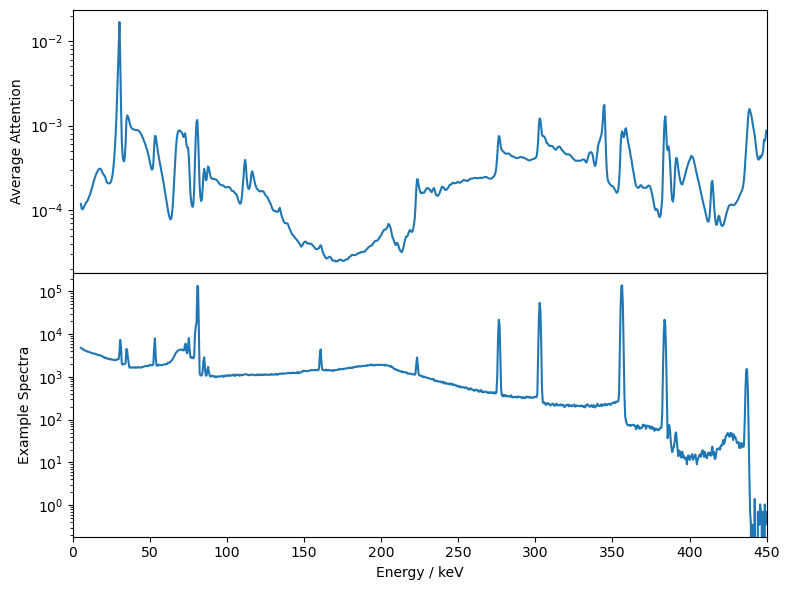

In [75]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [76]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
                                               separate_scalers=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 202.66it/s]


(4908, 890)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4991/4991 [00:25<00:00, 193.59it/s]


(4991, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.77it/s]


FCCD accuracies: 
total:  3000
TP:  1353
FP:  868
TN:  662
FN:  117
accuracy:  0.6716666666666666
precision:  0.6091850517784781
recall:  0.9204081632653062

DLF accuracies: 
accuracy_DLF:  0.526

roc auc FCCD:  0.8747639055622249

Total # misclassified trials FCCD:  985  / 3000
Total # misclassified trials DLF:  1422  / 3000


{'accuracy_FCCD': 0.6716666666666666,
 'precision_FCCD': 0.6091850517784781,
 'recall_FCCD': 0.9204081632653062,
 'accuracy_DLF': 0.526,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.8747639055622249,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.7142760811347516,
  'RMSE_DLFmisclassified_FCCD': 0.918934418122494,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 985,
  'NoMisclassifiedDLF': 1422}}

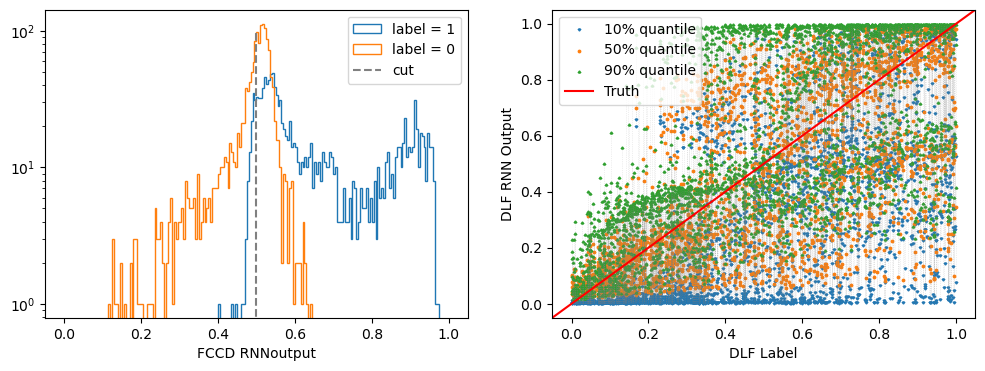

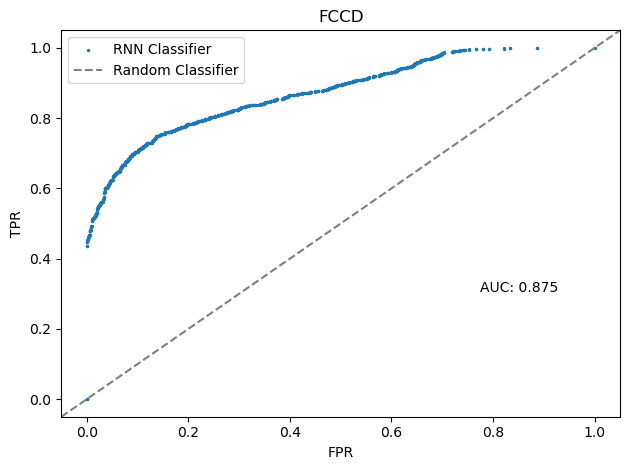

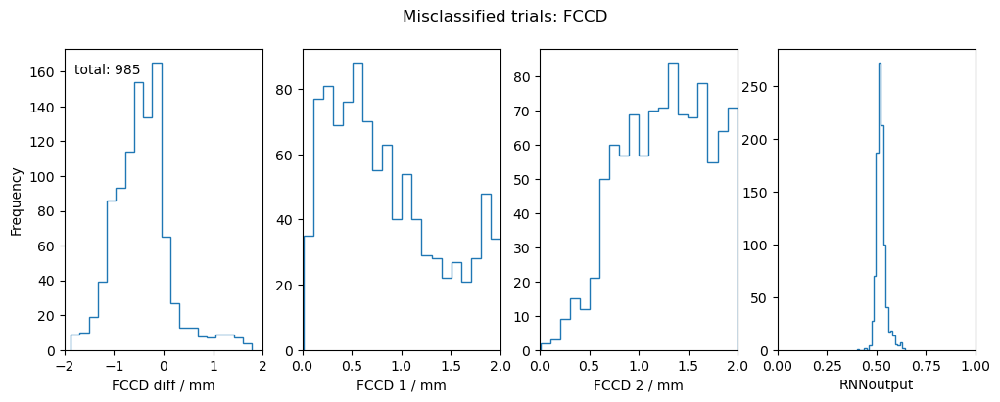

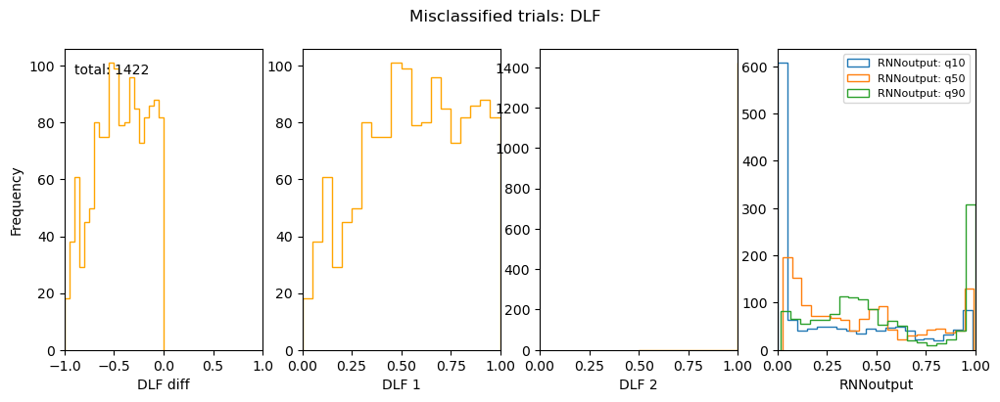

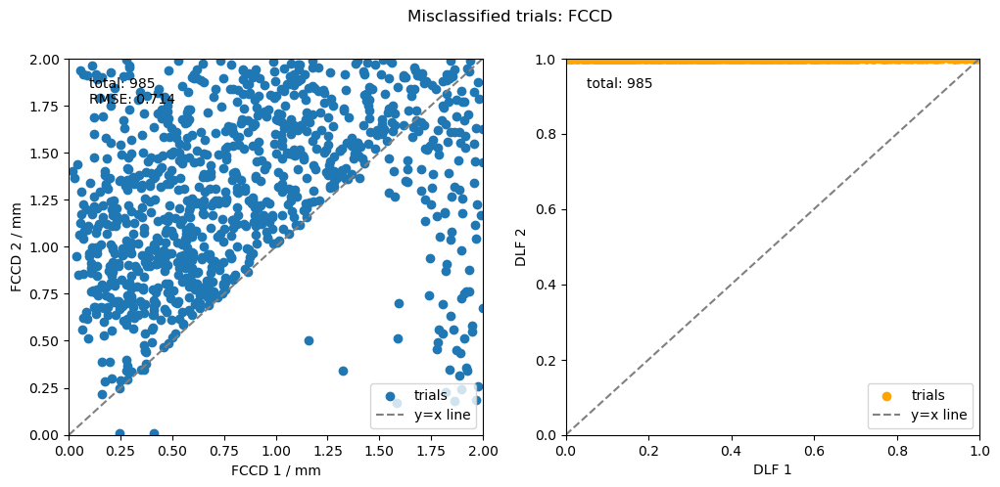

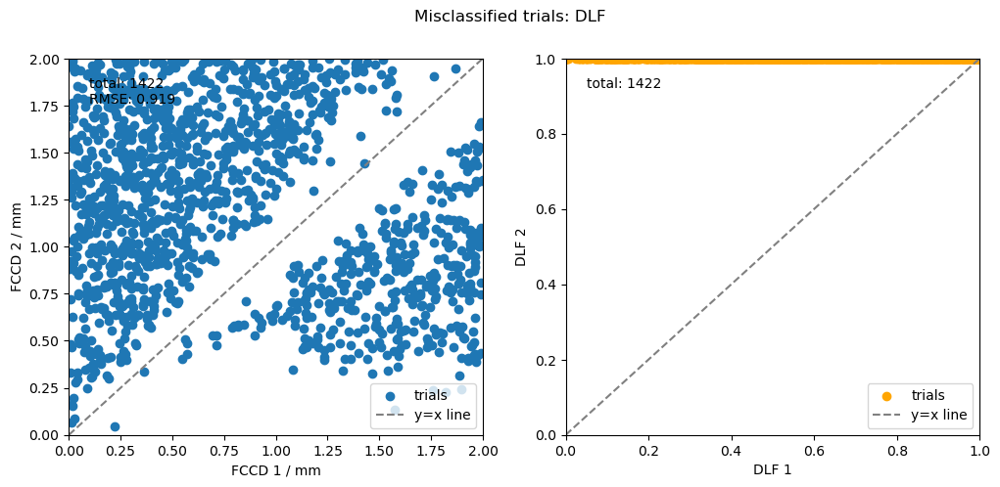

In [77]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

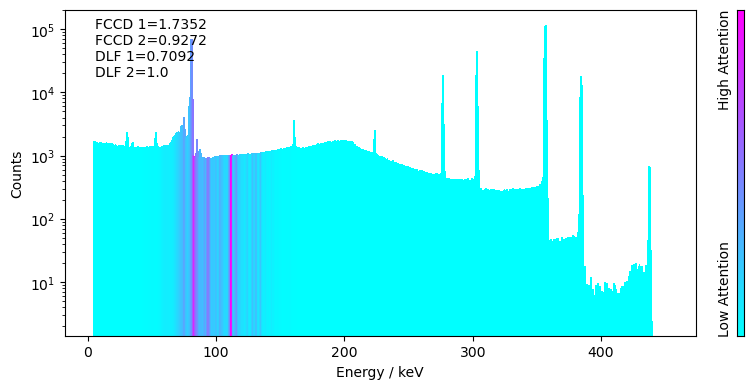

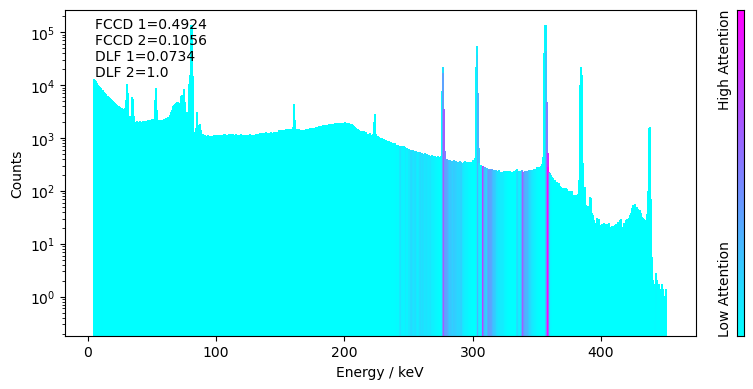

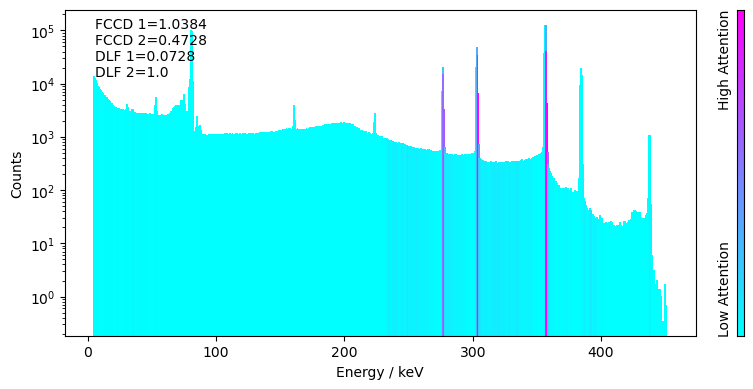

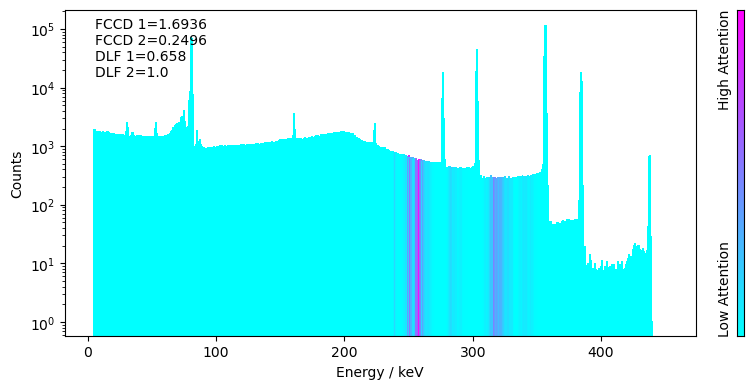

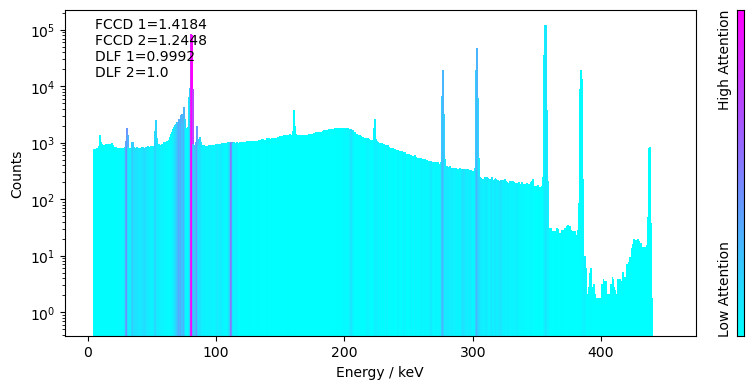

...

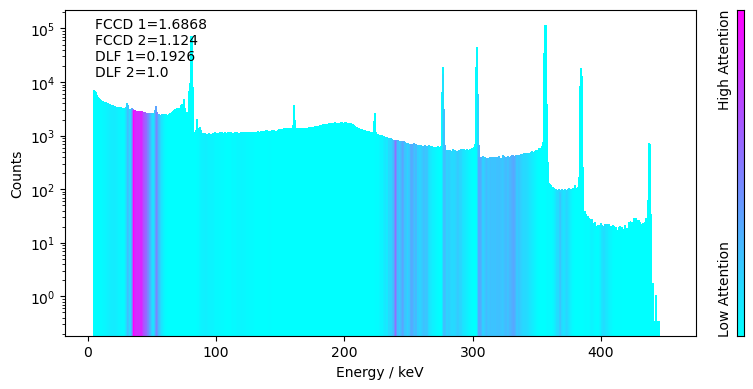

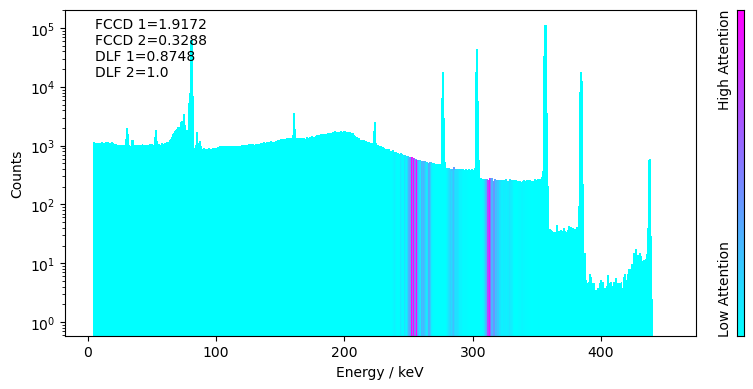

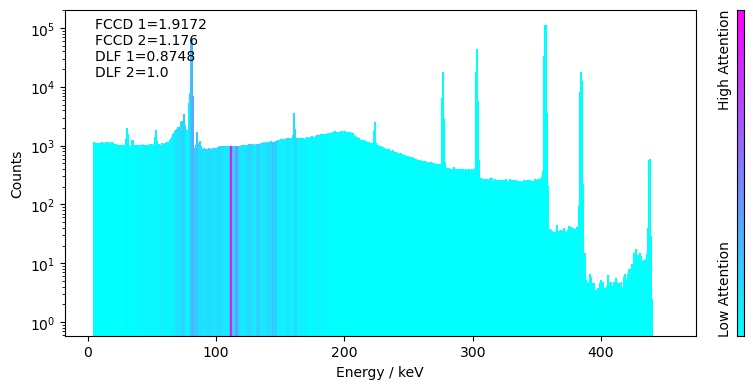

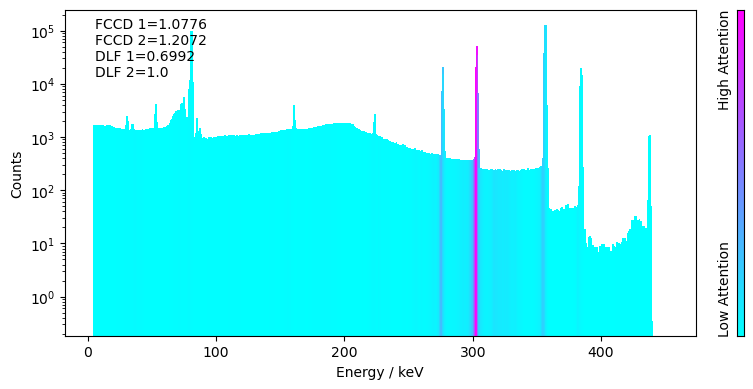

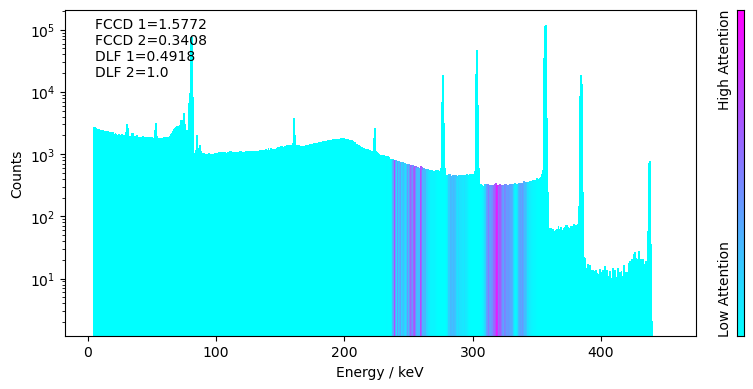

In [78]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.11it/s]


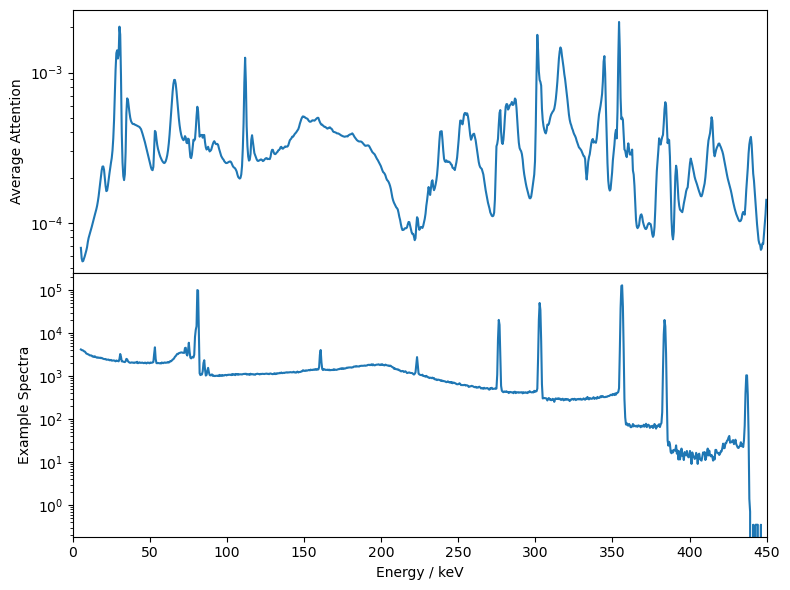

In [79]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)